# SONU M -TCS iON INTERNSHIP 


### Topic: Forecasting System - Project Demand of Products at a Retail Outlet Based on Historical Data

In [1]:
#Loading important Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
import statsmodels.api as sm
import itertools
import seaborn as sns

In [2]:
#Loading the data set
data=pd.read_csv('train_tcs.csv')

## Checking the basic details of dataset

In [3]:
data.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [4]:
data.shape

(913000, 4)

In [5]:
data.shape

(913000, 4)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [7]:
data.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [8]:
data.dtypes

date     object
store     int64
item      int64
sales     int64
dtype: object

In [9]:
data.isnull().sum()

date     0
store    0
item     0
sales    0
dtype: int64

In [10]:
#No null values in the dataset

In [11]:
data.duplicated().sum()

0

In [12]:
#No Duplicates values in the dataset

## Preprocessing

In [13]:
#converting Format of date column
data['date']=pd.to_datetime(data['date'])
data.dtypes

date     datetime64[ns]
store             int64
item              int64
sales             int64
dtype: object

In [14]:
#Feature engineering date column by creating additional columns related to time
def create_date_features(data):
    data['month'] = data.date.dt.month
    data['day_of_month'] = data.date.dt.day
    data['day_of_year'] = data.date.dt.dayofyear
    data['week_of_year'] = data.date.dt.weekofyear
    data['day_of_week'] = data.date.dt.dayofweek
    data['year'] = data.date.dt.year
    data["is_weekend"] = data.date.dt.weekday // 4
    data['is_month_start'] = data.date.dt.is_month_start.astype(int)
    data['is_month_end'] = data.date.dt.is_month_end.astype(int)
    return data

data = create_date_features(data)
create_date_features(data)

,date,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_weekend,is_month_start,is_month_end
0,2013-01-01,1,1,13,1,1,1,1,1,2013,0,1,0
1,2013-01-02,1,1,11,1,2,2,1,2,2013,0,0,0
2,2013-01-03,1,1,14,1,3,3,1,3,2013,0,0,0
3,2013-01-04,1,1,13,1,4,4,1,4,2013,1,0,0
4,2013-01-05,1,1,10,1,5,5,1,5,2013,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
912995,2017-12-27,10,50,63,12,27,361,52,2,2017,0,0,0
912996,2017-12-28,10,50,59,12,28,362,52,3,2017,0,0,0
912997,2017-12-29,10,50,74,12,29,363,52,4,2017,1,0,0
912998,2017-12-30,10,50,62,12,30,364,52,5,2017,1,0,0


## Checking unique values in the dataset

In [15]:
data['store'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
data['store'].nunique()

10

In [17]:
data['item'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50],
      dtype=int64)

In [18]:
data['item'].nunique()

50

### Analysing the dataset for the data limits

In [19]:
data['date'].max()

Timestamp('2017-12-31 00:00:00')

In [20]:
data['date'].min()

Timestamp('2013-01-01 00:00:00')

In [21]:
#The dataset is between the 2013 jan 1 to 2017 dec 31

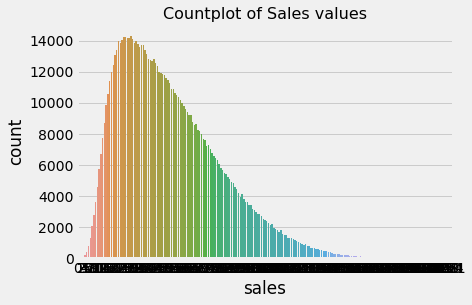

In [22]:
sns.countplot(data['sales'])
plt.title('Countplot of Sales values',fontsize=16)
plt.show()

In [23]:
data['sales'].max()

231

In [24]:
data['sales'].min()

0

In [25]:
#The Maximum and minimum values of sales are between 231 and 0

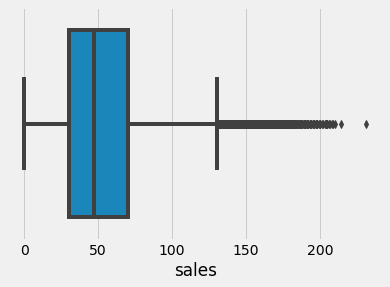

In [26]:
sns.boxplot(data['sales'])
plt.show()

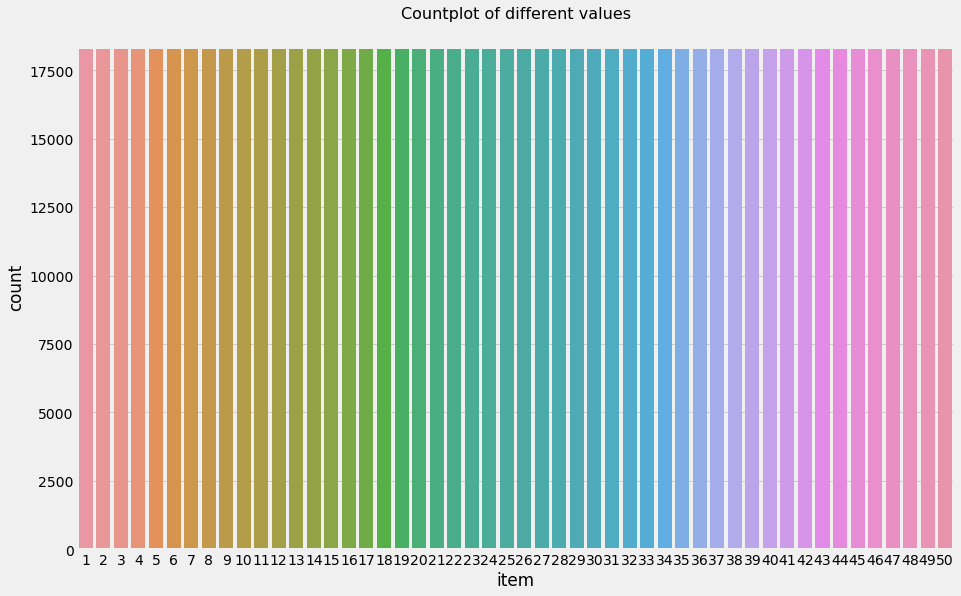

In [27]:
plt.figure(figsize=(14,9))
sns.countplot(data['item'])
plt.title('Countplot of different values',fontsize=16)
plt.show()

In [28]:
data['item'].value_counts()

1     18260
38    18260
28    18260
29    18260
30    18260
31    18260
32    18260
33    18260
34    18260
35    18260
36    18260
37    18260
39    18260
2     18260
40    18260
41    18260
42    18260
43    18260
44    18260
45    18260
46    18260
47    18260
48    18260
49    18260
27    18260
26    18260
25    18260
24    18260
3     18260
4     18260
5     18260
6     18260
7     18260
8     18260
9     18260
10    18260
11    18260
12    18260
13    18260
14    18260
15    18260
16    18260
17    18260
18    18260
19    18260
20    18260
21    18260
22    18260
23    18260
50    18260
Name: item, dtype: int64

In [29]:
data['store'].value_counts()

1     91300
2     91300
3     91300
4     91300
5     91300
6     91300
7     91300
8     91300
9     91300
10    91300
Name: store, dtype: int64

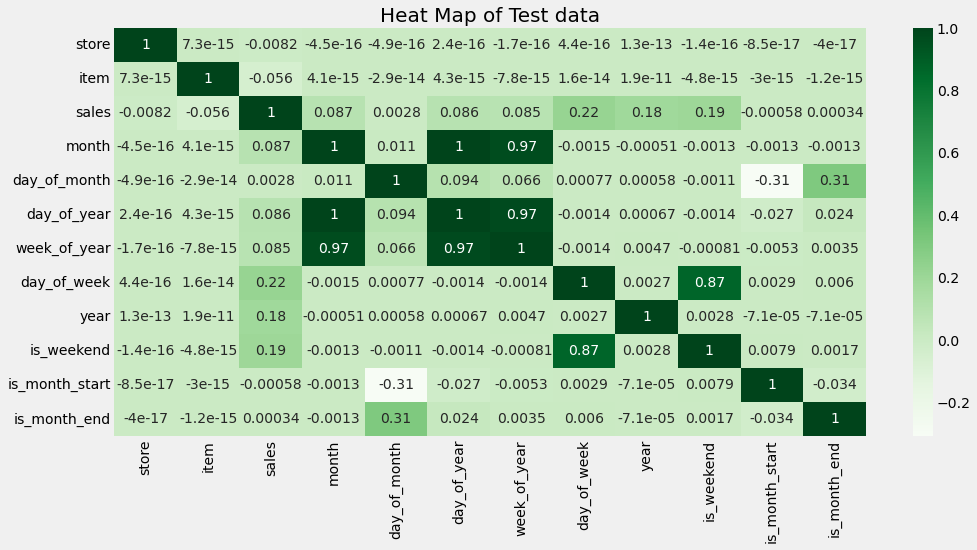

In [30]:
#Lets see the correlation between all variables in dataset
plt.figure(figsize=(15,7))
plt.title('Heat Map of Test data',size=20)
sns.heatmap(data.corr(),annot=True,cmap='Greens')
plt.show()

****

## Exploratory Data Analysis

In [31]:
#Finding Total sales day wise
Total= data.groupby('date')['sales'].sum().reset_index()
Total = Total.set_index('date')
Total

,sales
date,
2013-01-01,13696
2013-01-02,13678
2013-01-03,14488
2013-01-04,15677
2013-01-05,16237
...,...
2017-12-27,20378
2017-12-28,21885
2017-12-29,23535


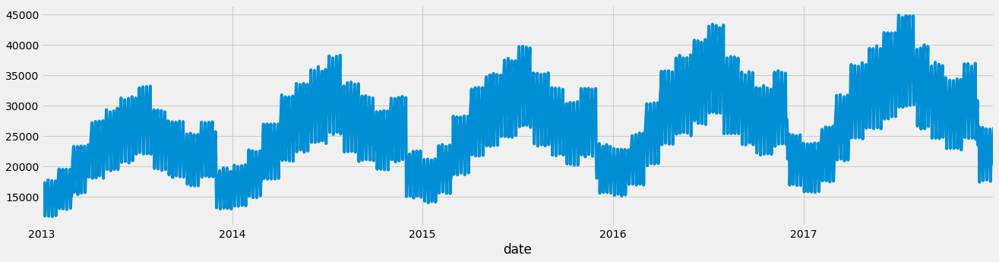

In [32]:
Total.sales.plot(figsize=(20,5))
plt.show()

In [33]:
#Now let's find how much total  sales occurred on each date in different stores
store_wise_sales = data.groupby('store')['sales'].sum()
store_wise_sales

store
1     4315603
2     6120128
3     5435144
4     5012639
5     3631016
6     3627670
7     3320009
8     5856169
9     5025976
10    5360158
Name: sales, dtype: int64

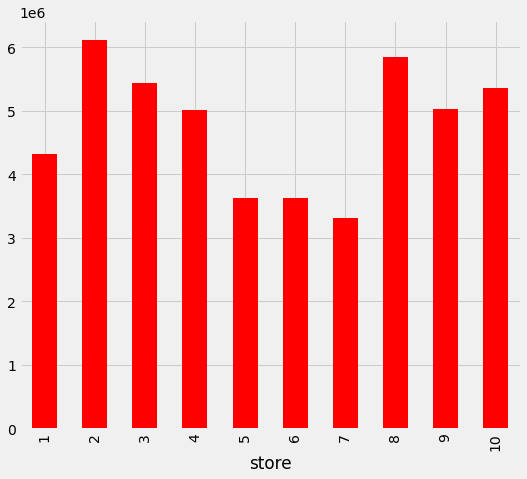

In [34]:
store_wise_sales.plot(figsize=(8,7),kind='bar',color='red')
plt.show()

In [35]:
#Now let's find how much total  sales occurred on each date in different stores
Item_wise_sales = data.groupby('item')['sales'].sum()
Item_wise_sales

item
1      401384
2     1069564
3      669087
4      401907
5      335230
6     1068281
7     1068777
8     1405108
9      938379
10    1337133
11    1271925
12    1271534
13    1539621
14    1071531
15    1607442
16     468480
17     602486
18    1538876
19     736892
20     867641
21     736190
22    1469971
23     534979
24    1205975
25    1473334
26     869981
27     402628
28    1604713
29    1271240
30     736554
31    1070845
32     803107
33    1270183
34     469935
35    1201541
36    1406548
37     534258
38    1470330
39     801311
40     534094
41     401759
42     669925
43     936635
44     536811
45    1471467
46    1070764
47     401781
48     937703
49     535663
50    1203009
Name: sales, dtype: int64

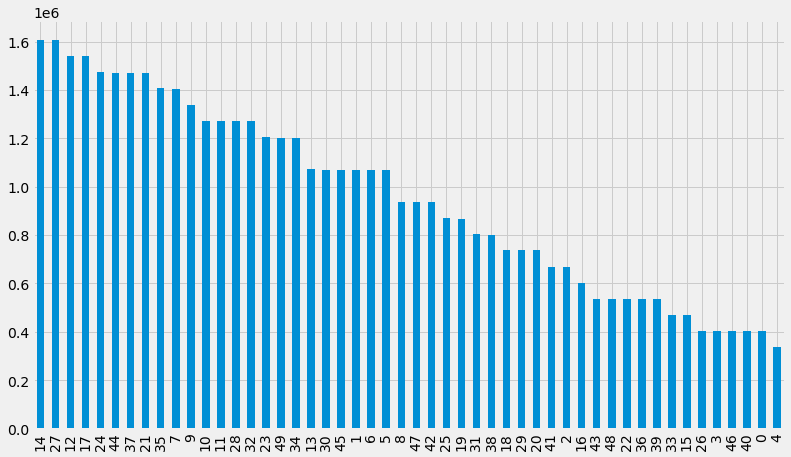

In [36]:
df=pd.DataFrame({'Item':Item_wise_sales.index, 'Sales':Item_wise_sales.values})
plt.figure(figsize=(12,7))
df["Sales"].sort_values(ascending=False).plot.bar()
plt.show()

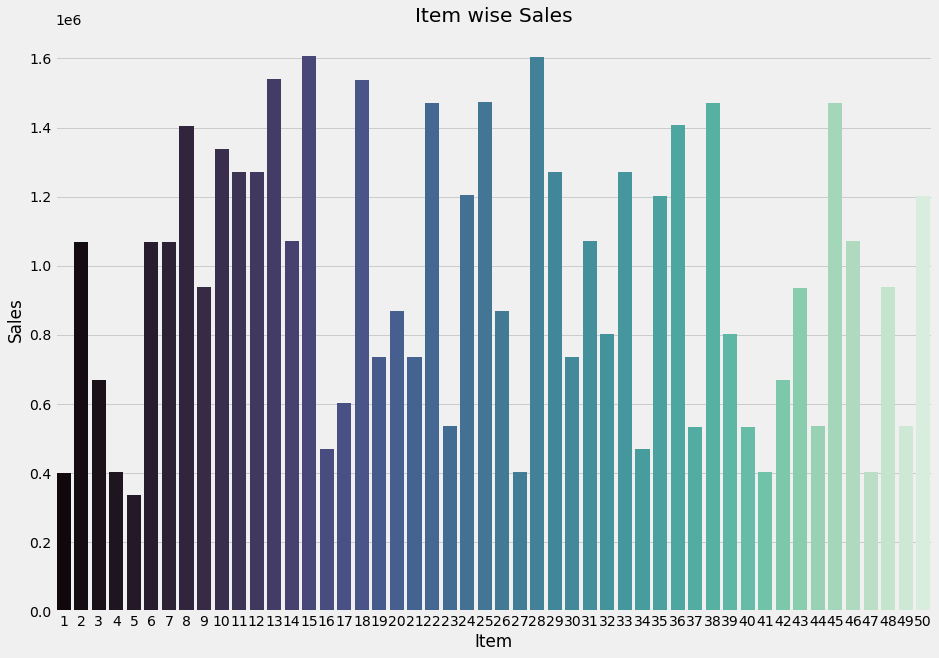

In [37]:
plt.figure(figsize=(14,10))
plt.title("Item wise Sales")
sns.barplot(x="Item", y="Sales", data=df,palette='mako')
plt.show()

In [38]:
for i in data['store'].unique():
    store_value=data[data['store']==i]
    plt.figure(figsize=(15,10))

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

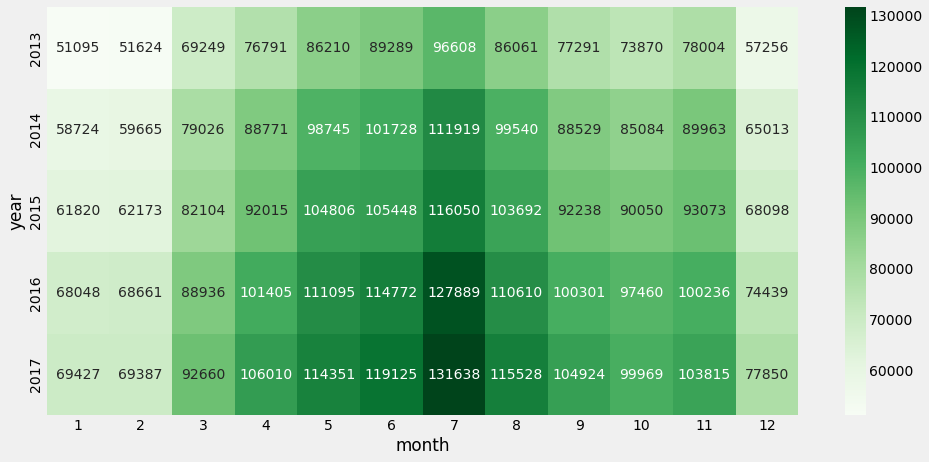

In [39]:
heatmap_sales=pd.pivot_table(data=store_value,values='sales', index ='year',columns =['month'],aggfunc = np.sum)
plt.figure(figsize=(15,7))
sns.heatmap(heatmap_sales,annot=True,fmt='g',cmap='Greens')
plt.show()

## Store Wise Sales

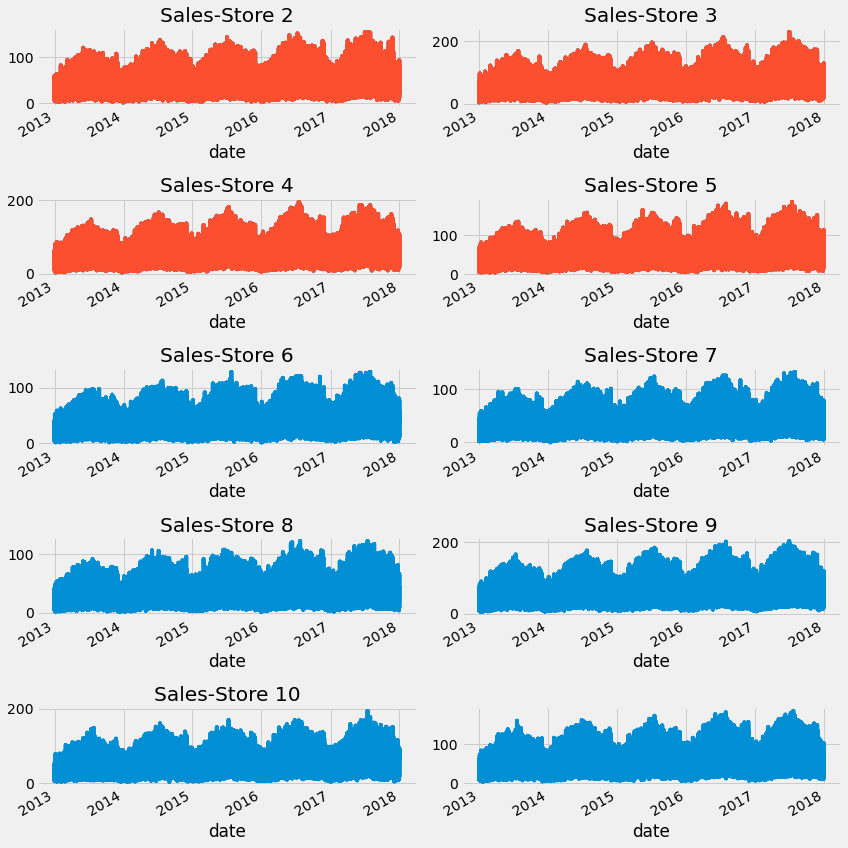

In [40]:
for i in data['store'].unique():
    store_i=data.loc[data['store']==i]
    store_i=store_i.sort_values('date')
    store_i=store_i.set_index('date')
    if i<5:
        plt.title("Sales-Store "+str(i))
        plt.subplot(5,2,i)
        store_i.sales.plot(figsize=(12,12))
    if i<11:
        plt.title("Sales-Store "+str(i))
        plt.subplot(5,2,i)
        store_i.sales.plot(figsize=(12,12))
plt.tight_layout()

In [41]:
store1= data.loc[data['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1

,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_weekend,is_month_start,is_month_end
date,,,,,,,,,,,,
2013-01-01,1,1,13,1,1,1,1,1,2013,0,1,0
2013-01-01,1,46,30,1,1,1,1,1,2013,0,1,0
2013-01-01,1,28,49,1,1,1,1,1,2013,0,1,0
2013-01-01,1,11,37,1,1,1,1,1,2013,0,1,0
2013-01-01,1,27,14,1,1,1,1,1,2013,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31,1,29,51,12,31,365,52,6,2017,1,0,1
2017-12-31,1,28,93,12,31,365,52,6,2017,1,0,1
2017-12-31,1,27,22,12,31,365,52,6,2017,1,0,1


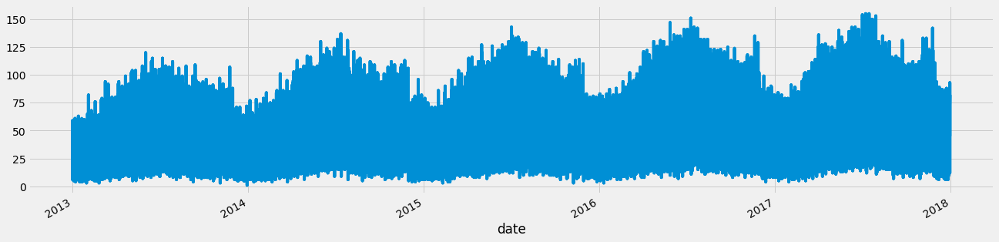

In [42]:
#plotting the sample store wise sales
store1.sales.plot(figsize=(20,5))
plt.show()

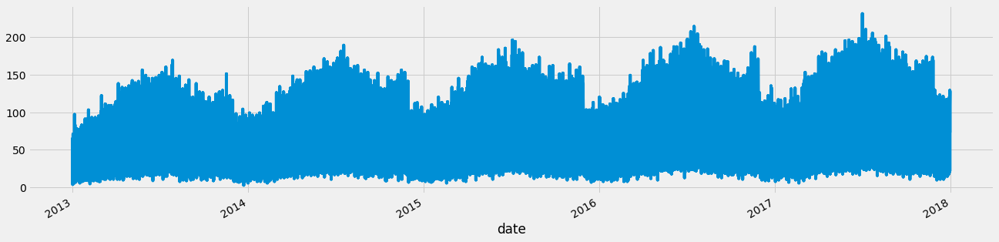

In [43]:
store2= data.loc[data['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2.sales.plot(figsize=(20,5))
plt.show()

## Item Wise Sales

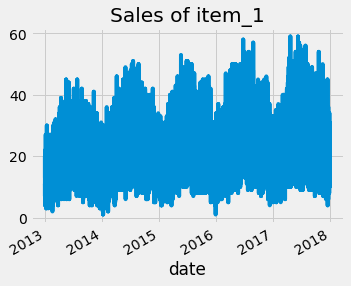

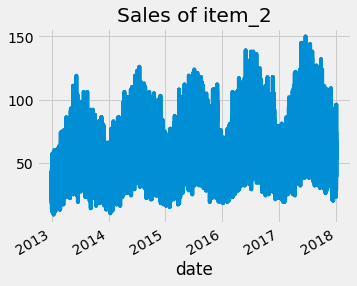

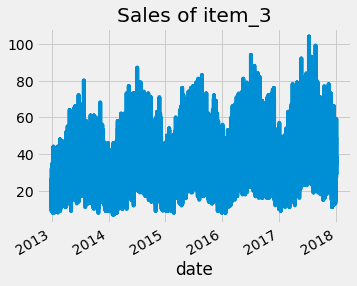

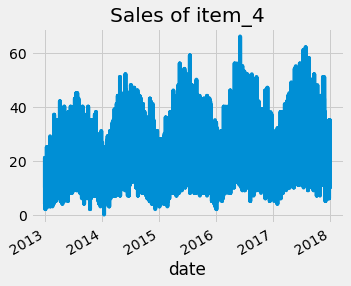

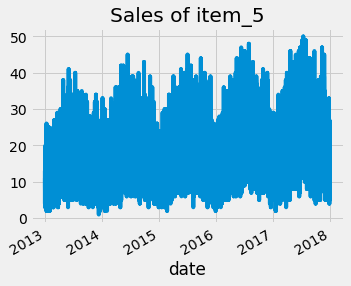

...

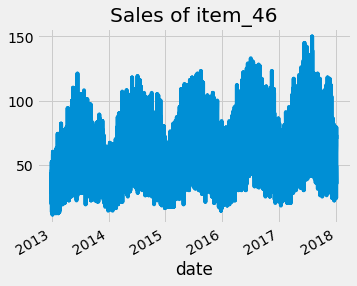

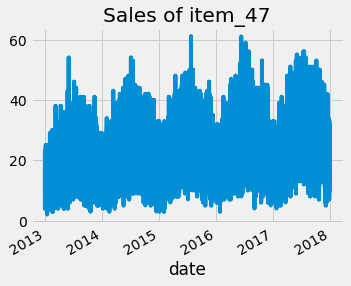

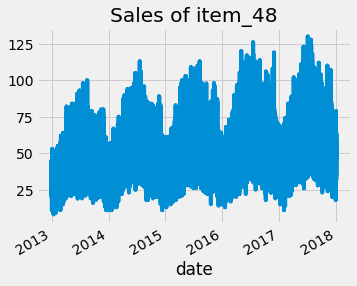

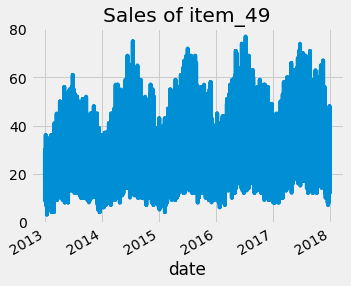

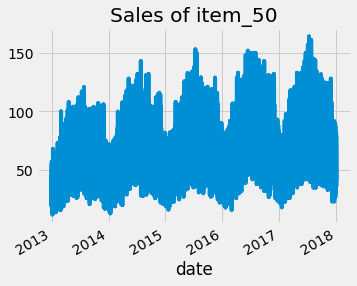

In [44]:
for i in data['item'].unique():
    item_i=data.loc[data['item']==i]
    item_i=item_i.sort_values('date')
    item_i=item_i.set_index('date')
    plt.title('Sales of item_'+str(i))
    item_i.sales.plot(figsize=(5,4))
    plt.show()


In [45]:
item2= data.loc[data['item'] == 2]
item2

,date,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_weekend,is_month_start,is_month_end
18260,2013-01-01,1,2,33,1,1,1,1,1,2013,0,1,0
18261,2013-01-02,1,2,43,1,2,2,1,2,2013,0,0,0
18262,2013-01-03,1,2,23,1,3,3,1,3,2013,0,0,0
18263,2013-01-04,1,2,18,1,4,4,1,4,2013,1,0,0
18264,2013-01-05,1,2,34,1,5,5,1,5,2013,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36515,2017-12-27,10,2,43,12,27,361,52,2,2017,0,0,0
36516,2017-12-28,10,2,35,12,28,362,52,3,2017,0,0,0
36517,2017-12-29,10,2,53,12,29,363,52,4,2017,1,0,0
36518,2017-12-30,10,2,56,12,30,364,52,5,2017,1,0,0


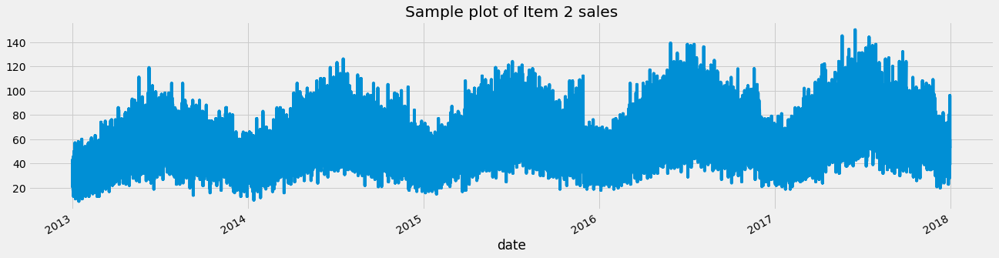

In [46]:
item2 = item2.sort_values('date')
item2 = item2.set_index('date')
item2.sales.plot(figsize=(20,5))
plt.title('Sample plot of Item 2 sales')
plt.show()

## Sum of Sales Store Wise

In [47]:
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1

,sales
date,
2013-01-01,1316
2013-01-02,1264
2013-01-03,1305
2013-01-04,1452
2013-01-05,1499
...,...
2017-12-27,1837
2017-12-28,1951
2017-12-29,2116


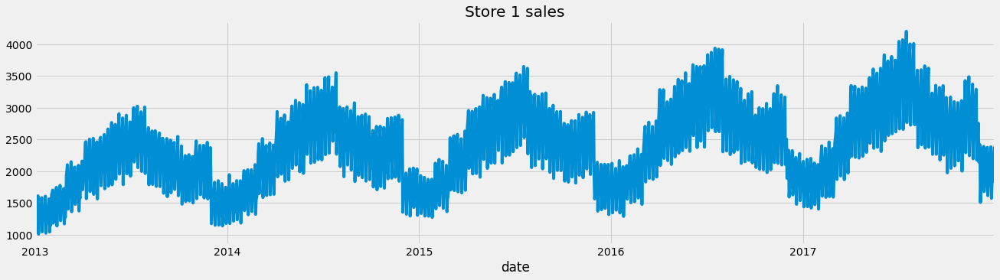

In [48]:
store1.sales.plot(figsize=(20,5))
plt.title('Store 1 sales')
plt.show()

In [49]:
store1_m = store1['sales'].resample('MS').mean()
store1_m

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
2013-06-01    2384.366667
2013-07-01    2500.870968
2013-08-01    2249.838710
2013-09-01    2080.266667
2013-10-01    1907.419355
2013-11-01    2082.166667
2013-12-01    1484.806452
2014-01-01    1541.548387
2014-02-01    1708.500000
2014-03-01    2055.774194
2014-04-01    2371.633333
2014-05-01    2584.129032
2014-06-01    2739.866667
2014-07-01    2883.516129
2014-08-01    2574.000000
2014-09-01    2371.133333
2014-10-01    2217.419355
2014-11-01    2416.866667
2014-12-01    1690.806452
2015-01-01    1607.806452
2015-02-01    1768.928571
2015-03-01    2130.838710
2015-04-01    2490.033333
2015-05-01    2694.290323
2015-06-01    2824.833333
2015-07-01    3031.258065
2015-08-01    2691.677419
2015-09-01    2479.633333
2015-10-01    2339.354839
2015-11-01    2476.400000
2015-12-01    1764.548387
2016-01-01    1759.967742
2016-02-01    1921.448276
2016-03

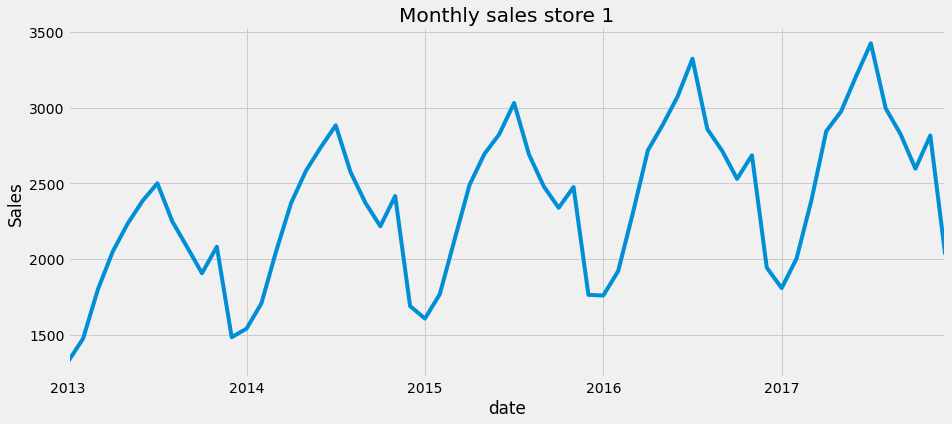

In [50]:
store1_m.plot(figsize=(14,6))
plt.title("Monthly sales store 1")
plt.ylabel("Sales")
plt.show()

In [51]:
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2 = store2.set_index('date')
store2_m = store2['sales'].resample('MS').mean()


In [52]:
store2_m

date
2013-01-01    1887.741935
2013-02-01    2120.857143
2013-03-01    2568.032258
2013-04-01    2932.900000
2013-05-01    3172.935484
2013-06-01    3405.266667
2013-07-01    3536.935484
2013-08-01    3161.032258
2013-09-01    2955.766667
2013-10-01    2712.677419
2013-11-01    2962.466667
2013-12-01    2094.903226
2014-01-01    2171.451613
2014-02-01    2414.464286
2014-03-01    2920.870968
2014-04-01    3382.133333
2014-05-01    3653.838710
2014-06-01    3883.000000
2014-07-01    4097.548387
2014-08-01    3652.129032
2014-09-01    3344.666667
2014-10-01    3152.677419
2014-11-01    3426.833333
2014-12-01    2386.741935
2015-01-01    2286.419355
2015-02-01    2533.928571
2015-03-01    3000.129032
2015-04-01    3538.866667
2015-05-01    3831.612903
2015-06-01    3989.066667
2015-07-01    4284.096774
2015-08-01    3813.741935
2015-09-01    3514.100000
2015-10-01    3298.645161
2015-11-01    3532.833333
2015-12-01    2517.225806
2016-01-01    2496.516129
2016-02-01    2719.000000
2016-03

In [53]:
store3= data.loc[data['store'] == 3]
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_m = store3['sales'].resample('MS').mean()
store4= data.loc[data['store'] == 4]
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_m = store4['sales'].resample('MS').mean()
store5= data.loc[data['store'] == 5]
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_m = store5['sales'].resample('MS').mean()
store6= data.loc[data['store'] == 6]
store6 = store6.groupby('date')['sales'].sum().reset_index()
store6 = store6.set_index('date')
store6_m = store6['sales'].resample('MS').mean()
store7= data.loc[data['store'] == 7]
store7 = store7.groupby('date')['sales'].sum().reset_index()
store7 = store7.set_index('date')
store7_m = store7['sales'].resample('MS').mean()
store8= data.loc[data['store'] == 8]
store8 = store8.groupby('date')['sales'].sum().reset_index()
store8 = store8.set_index('date')
store8_m = store8['sales'].resample('MS').mean()
store9= data.loc[data['store'] == 9]
store9 = store9.groupby('date')['sales'].sum().reset_index()
store9 = store9.set_index('date')
store9_m = store9['sales'].resample('MS').mean()
store10= data.loc[data['store'] == 10]
store10 = store10.groupby('date')['sales'].sum().reset_index()
store10 = store10.set_index('date')
store10_m = store10['sales'].resample('MS').mean()


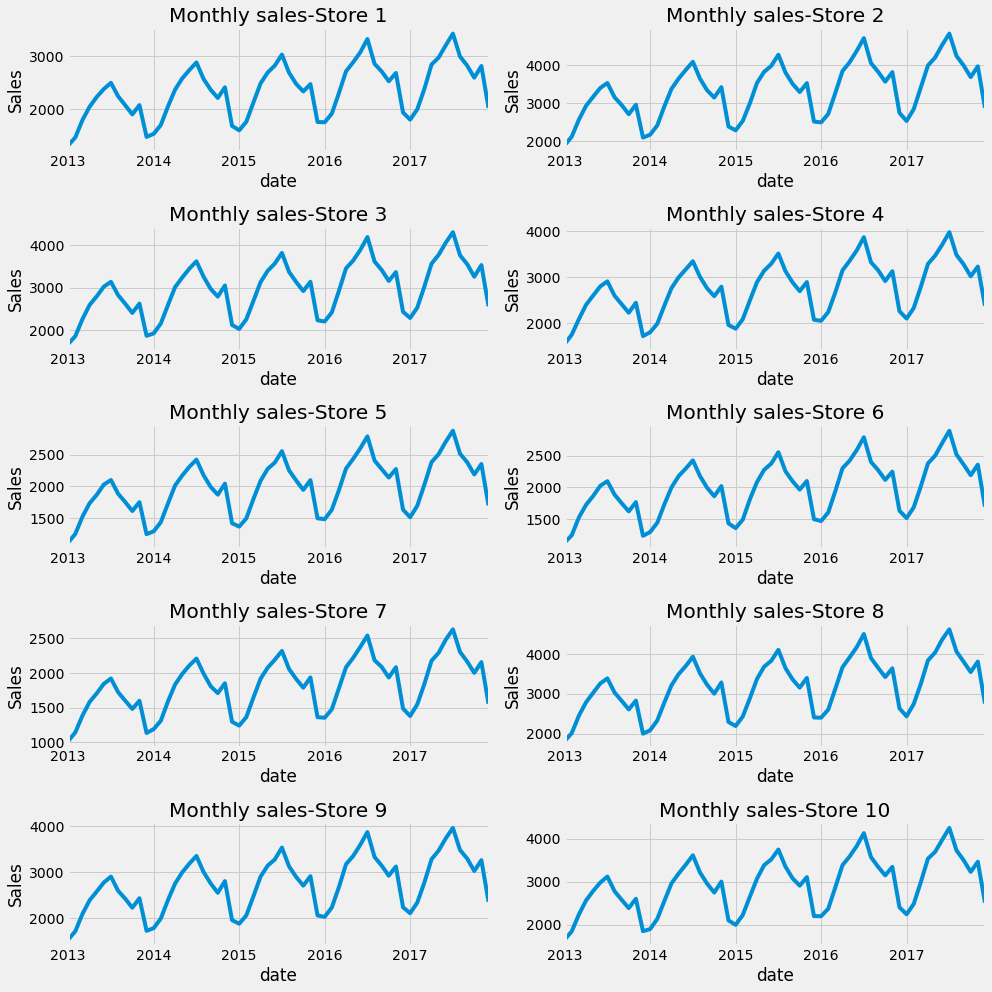

In [54]:
plt.figure(figsize=(14,14))
plt.subplot(5,2,1)
store1_m.plot()
plt.title("Monthly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_m.plot()
plt.title("Monthly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_m.plot()
plt.title("Monthly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_m.plot()
plt.title("Monthly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_m.plot()
plt.title("Monthly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_m.plot()
plt.title("Monthly sales-Store 6")
plt.ylabel("Sales")
plt.subplot(5,2,7)
store7_m.plot()
plt.title("Monthly sales-Store 7")
plt.ylabel("Sales")
plt.subplot(5,2,8)
store8_m.plot()
plt.title("Monthly sales-Store 8")
plt.ylabel("Sales")
plt.subplot(5,2,9)
store9_m.plot()
plt.title("Monthly sales-Store 9")
plt.ylabel("Sales")
plt.subplot(5,2,10)
store10_m.plot()
plt.title("Monthly sales-Store 10")
plt.tight_layout()


In [55]:
store1_Q = store1['sales'].resample('Q').mean()
store2_Q = store2['sales'].resample('Q').mean()
store3_Q = store3['sales'].resample('Q').mean()
store4_Q = store4['sales'].resample('Q').mean()
store5_Q = store5['sales'].resample('Q').mean()
store6_Q = store6['sales'].resample('Q').mean()
store7_Q = store7['sales'].resample('Q').mean()
store8_Q = store8['sales'].resample('Q').mean()
store9_Q = store9['sales'].resample('Q').mean()
store10_Q = store10['sales'].resample('Q').mean()

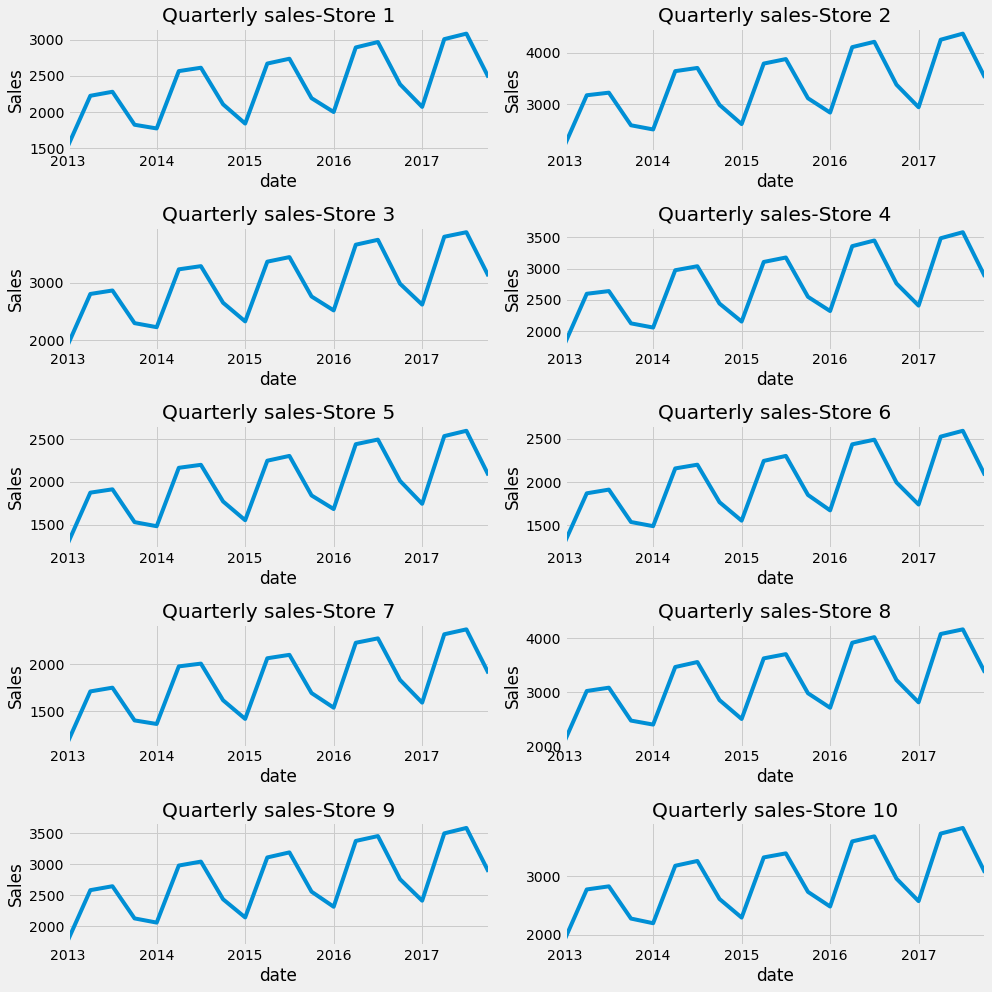

In [56]:
plt.figure(figsize=(14,14))
plt.subplot(5,2,1)
store1_Q.plot()
plt.title("Quarterly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_Q.plot()
plt.title("Quarterly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_Q.plot()
plt.title("Quarterly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_Q.plot()
plt.title("Quarterly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_Q.plot()
plt.title("Quarterly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_Q.plot()
plt.title("Quarterly sales-Store 6")
plt.ylabel("Sales")
plt.subplot(5,2,7)
store7_Q.plot()
plt.title("Quarterly sales-Store 7")
plt.ylabel("Sales")
plt.subplot(5,2,8)
store8_Q.plot()
plt.title("Quarterly sales-Store 8")
plt.ylabel("Sales")
plt.subplot(5,2,9)
store9_Q.plot()
plt.title("Quarterly sales-Store 9")
plt.ylabel("Sales")
plt.subplot(5,2,10)
store10_Q.plot()
plt.title("Quarterly sales-Store 10")
plt.tight_layout()

In [57]:
store1_y = store1['sales'].resample('Y').mean()
store2_y = store2['sales'].resample('Y').mean()
store3_y = store3['sales'].resample('Y').mean()
store4_y = store4['sales'].resample('Y').mean()
store5_y = store5['sales'].resample('Y').mean()
store6_y = store6['sales'].resample('Y').mean()
store7_y = store7['sales'].resample('Y').mean()
store8_y = store8['sales'].resample('Y').mean()
store9_y = store9['sales'].resample('Y').mean()
store10_y = store10['sales'].resample('Y').mean()

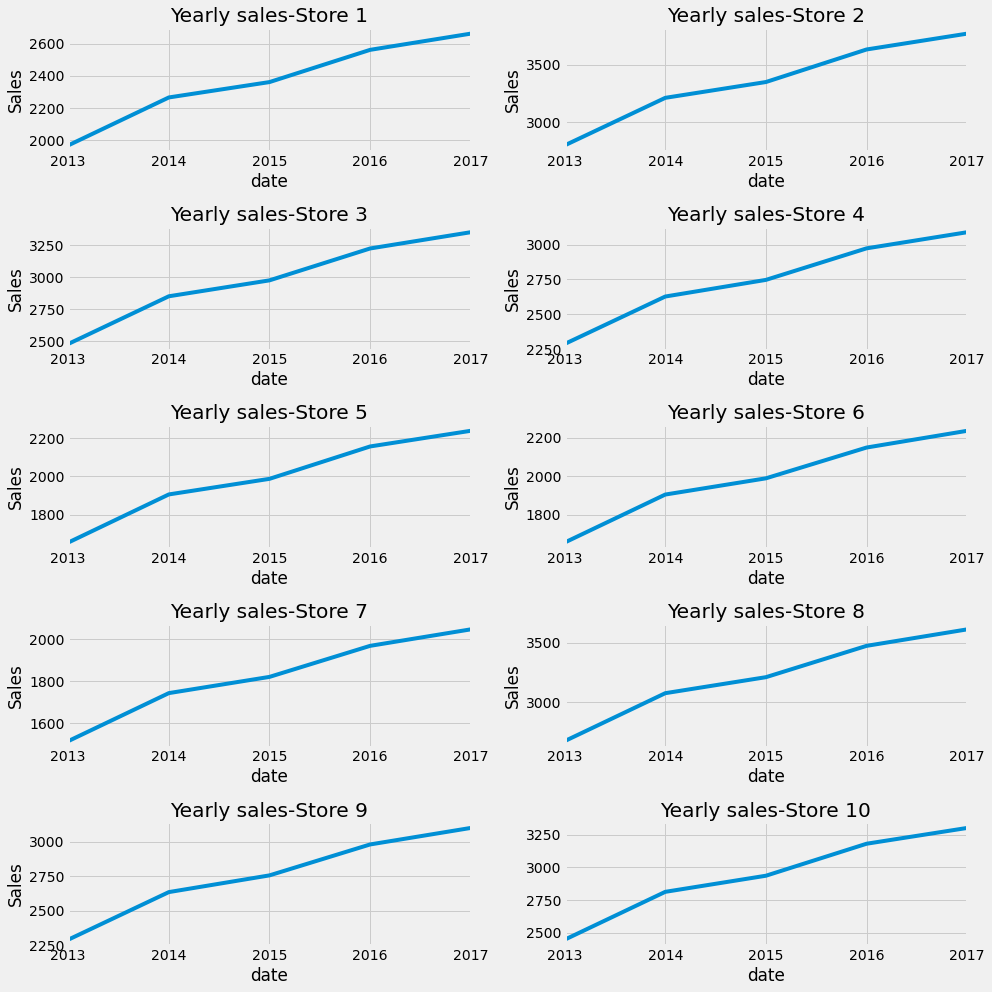

In [58]:
plt.figure(figsize=(14,14))
plt.subplot(5,2,1)
store1_y.plot()
plt.title("Yearly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_y.plot()
plt.title("Yearly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_y.plot()
plt.title("Yearly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_y.plot()
plt.title("Yearly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_y.plot()
plt.title("Yearly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_y.plot()
plt.title("Yearly sales-Store 6")
plt.ylabel("Sales")
plt.subplot(5,2,7)
store7_y.plot()
plt.title("Yearly sales-Store 7")
plt.ylabel("Sales")
plt.subplot(5,2,8)
store8_y.plot()
plt.title("Yearly sales-Store 8")
plt.ylabel("Sales")
plt.subplot(5,2,9)
store9_y.plot()
plt.title("Yearly sales-Store 9")
plt.ylabel("Sales")
plt.subplot(5,2,10)
store10_y.plot()
plt.title("Yearly sales-Store 10")
plt.tight_layout()

In [59]:
store_year= data.loc[(data['store'] == 1 )& (data['year']==2013)]
store_year

,date,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_weekend,is_month_start,is_month_end
0,2013-01-01,1,1,13,1,1,1,1,1,2013,0,1,0
1,2013-01-02,1,1,11,1,2,2,1,2,2013,0,0,0
2,2013-01-03,1,1,14,1,3,3,1,3,2013,0,0,0
3,2013-01-04,1,1,13,1,4,4,1,4,2013,1,0,0
4,2013-01-05,1,1,10,1,5,5,1,5,2013,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
895100,2013-12-27,1,50,41,12,27,361,52,4,2013,1,0,0
895101,2013-12-28,1,50,45,12,28,362,52,5,2013,1,0,0
895102,2013-12-29,1,50,42,12,29,363,52,6,2013,1,0,0
895103,2013-12-30,1,50,34,12,30,364,1,0,2013,0,0,0


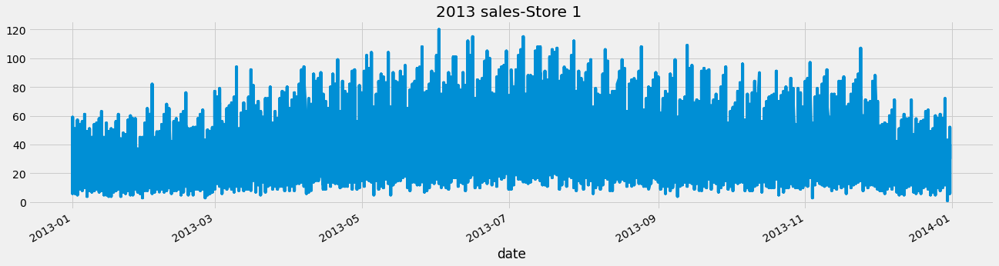

In [60]:
store_year= store_year.sort_values('date')
store_year= store_year.set_index('date')
store_year.sales.plot(figsize=(20,5))
plt.title("2013 sales-Store 1 ")
plt.show()

In [61]:
#peak is towards midle of an year

In [62]:
year_sales = data.groupby('year')['sales'].sum().reset_index()
year_sales

,year,sales
0,2013,7941243
1,2014,9135482
2,2015,9536887
3,2016,10357160
4,2017,10733740


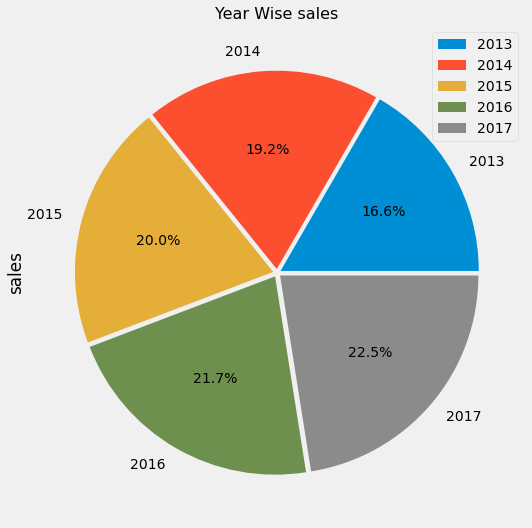

In [63]:
plot = year_sales.plot.pie(x = 'year', y='sales',labels=year_sales['year'], autopct='%1.1f%%', figsize=(11,8.5),explode=[0.02]*5)
plt.title('Year Wise sales',fontsize=16)
plt.show()

In [64]:
monthly_sales = data.groupby('month')['sales'].sum().reset_index()
monthly_sales

,month,sales
0,1,2753149
1,2,2776177
2,3,3666182
3,4,4136467
4,5,4582437
5,6,4726911
6,7,5192393
7,8,4580655
8,9,4130457
9,10,3967520


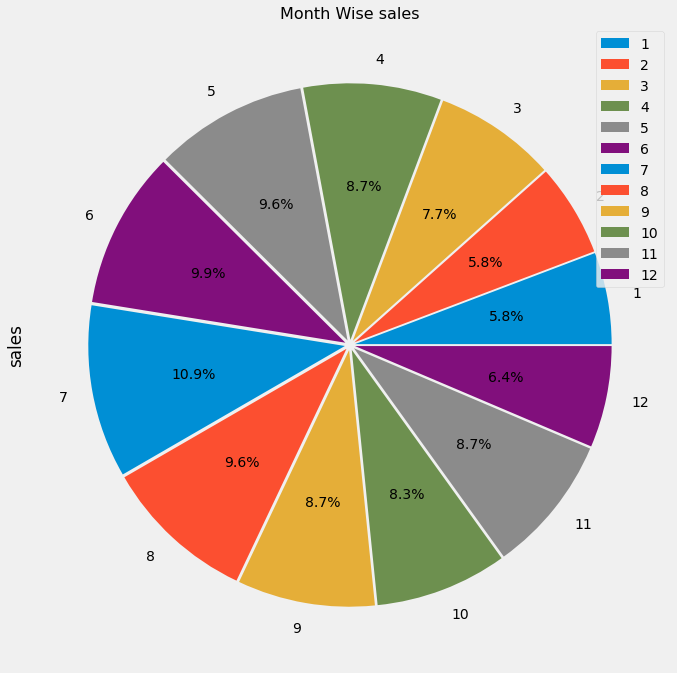

In [65]:
plot = monthly_sales.plot.pie(x = 'month', y='sales',labels=monthly_sales['month'], autopct='%1.1f%%', figsize=(17, 11),explode=[0.02]*12)
plt.title('Month Wise sales',fontsize=16)
plt.show()

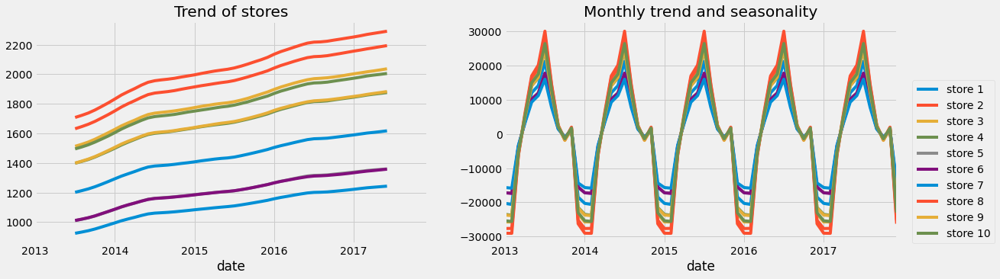

In [66]:
ax1 = plt.subplot(1,2,1)
plt.title('Trend of stores')
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].mean().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.trend.plot(figsize=(18,5))
    
ax2= plt.subplot(1,2,2)
plt.title('Seasonality of stores')
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].sum().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.seasonal.plot(figsize=(18,5))
    
plt.legend(('store 1','store 2','store 3','store 4','store 5','store 6','store 7','store 8','store 9','store 10'),loc=(1.04, 0))
plt.title("Monthly trend and seasonality");

****

## ETS DECOMPOSITION

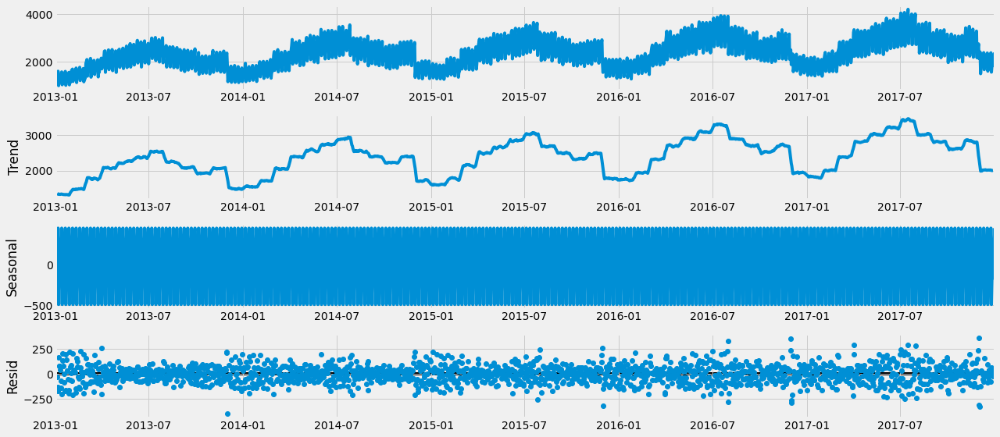

In [67]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1,model='additive')
fig = decomposition_office.plot()
plt.show()

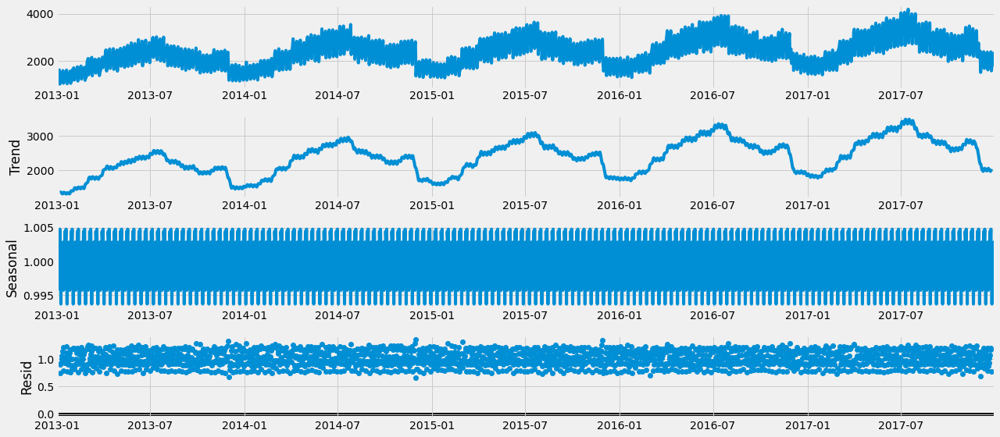

In [68]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

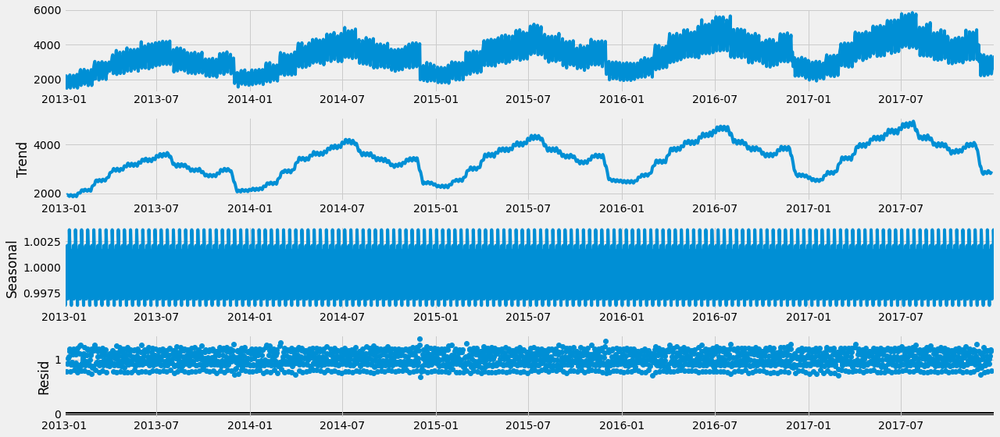

In [69]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store2,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

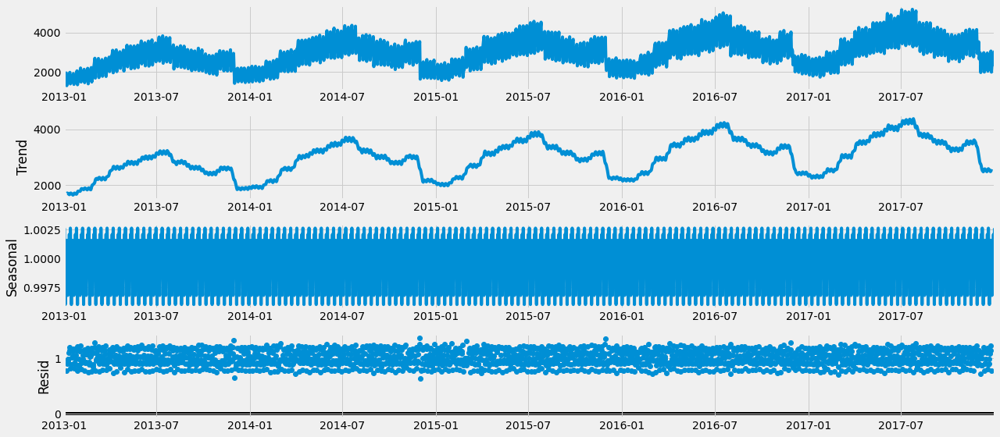

In [70]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store3,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

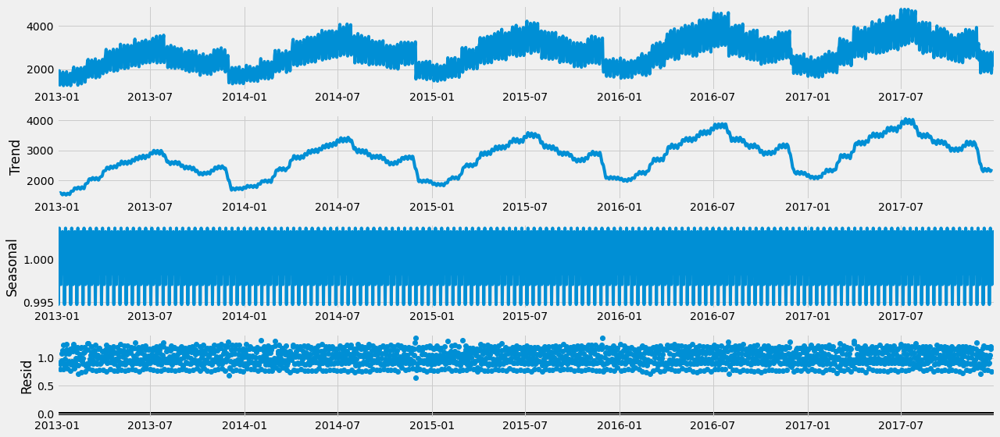

In [71]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store4,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

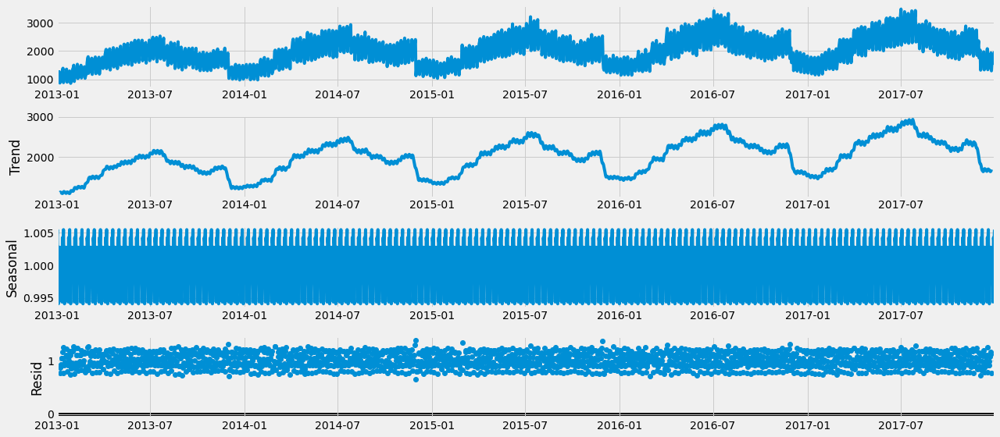

In [72]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store5,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

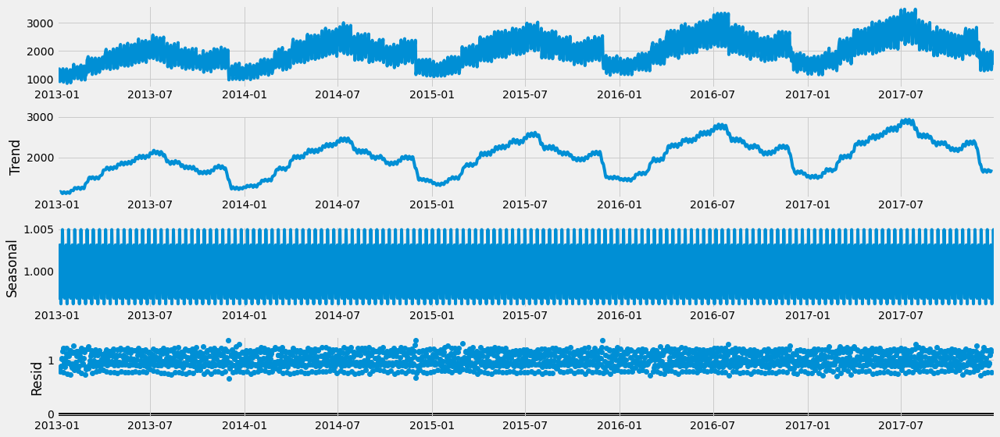

In [73]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store6,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

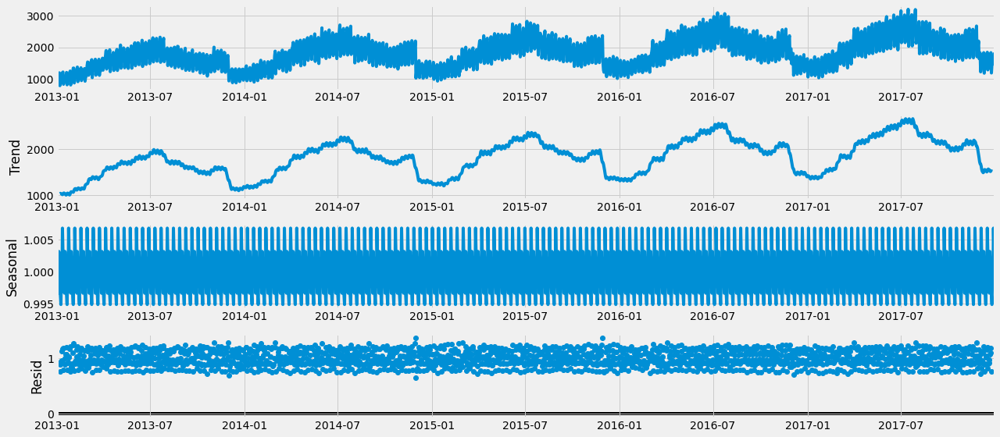

In [74]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store7,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

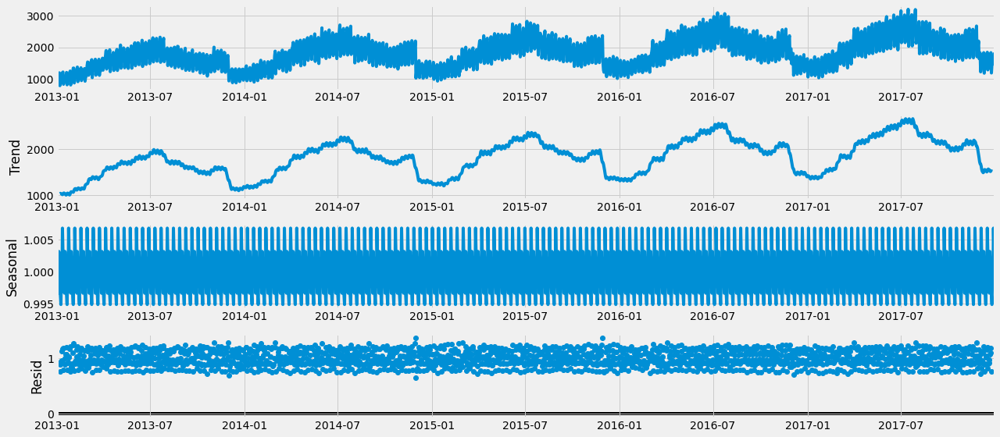

In [75]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store7,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

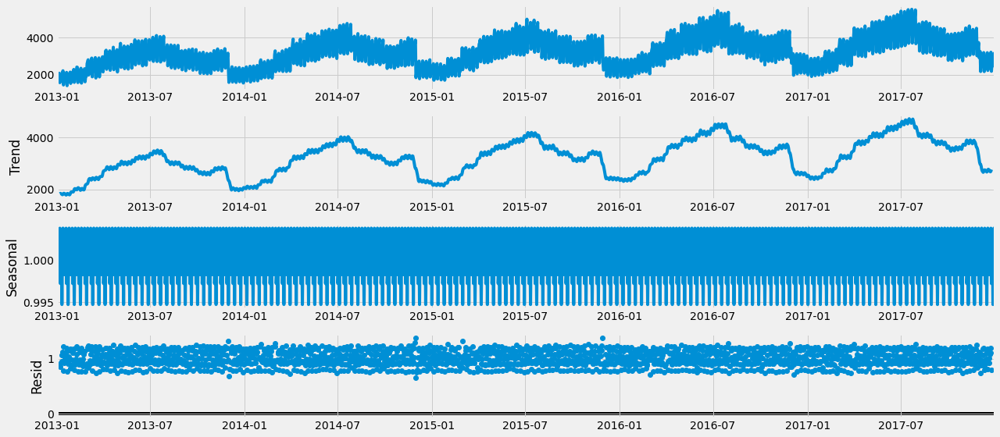

In [76]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store8,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

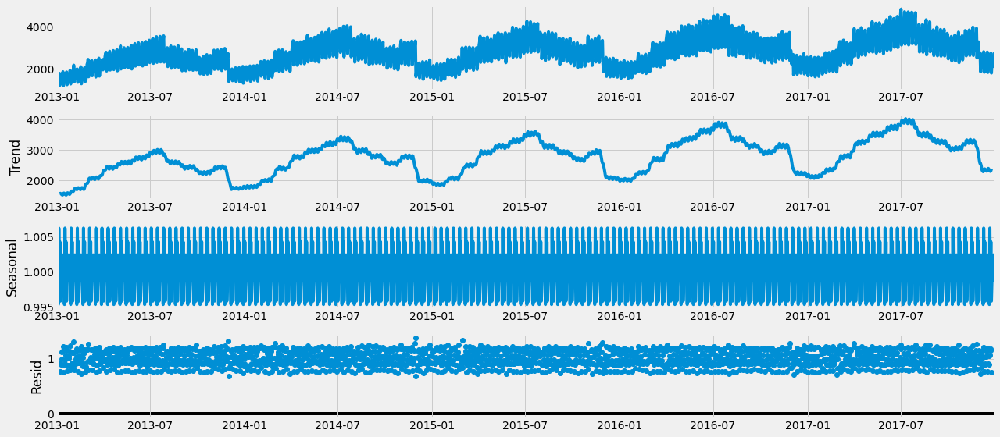

In [77]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store9,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

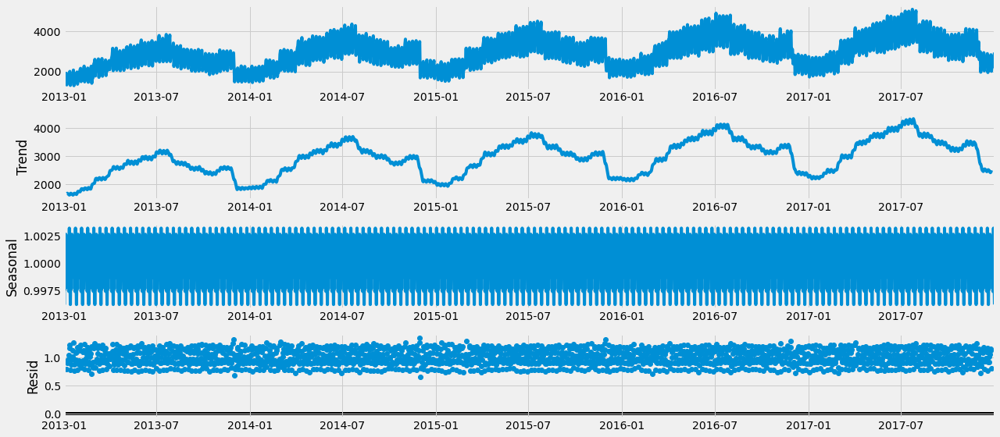

In [78]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store10,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

##  Decompostion Monthly- Multiplicative method

Decomposition of store 1


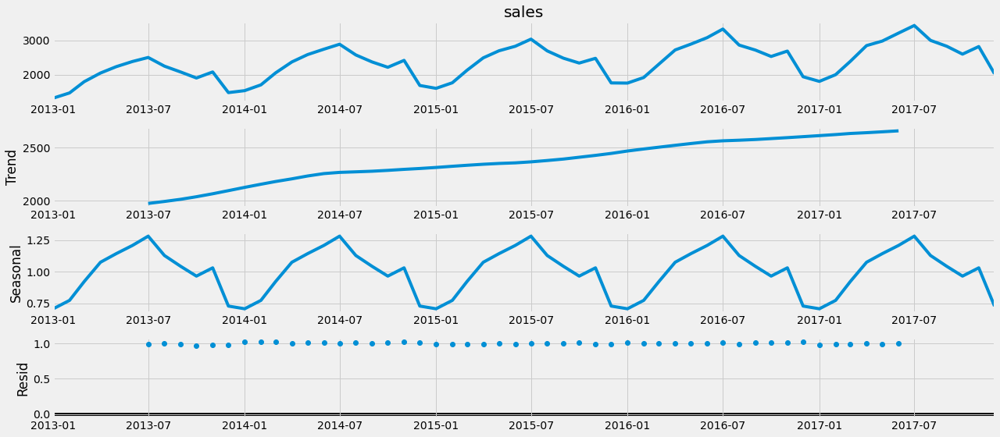

In [79]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 1')
decomposition_office = sm.tsa.seasonal_decompose(store1_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 2


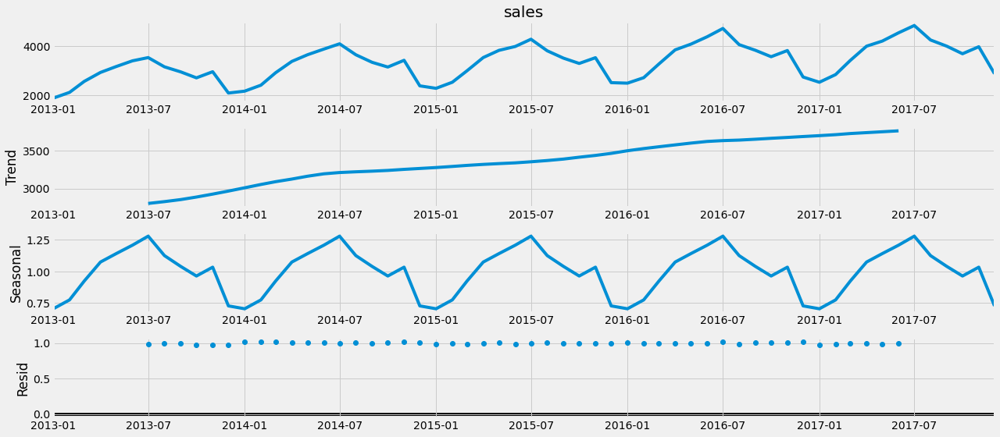

In [80]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 2')
decomposition_office = sm.tsa.seasonal_decompose(store2_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 3


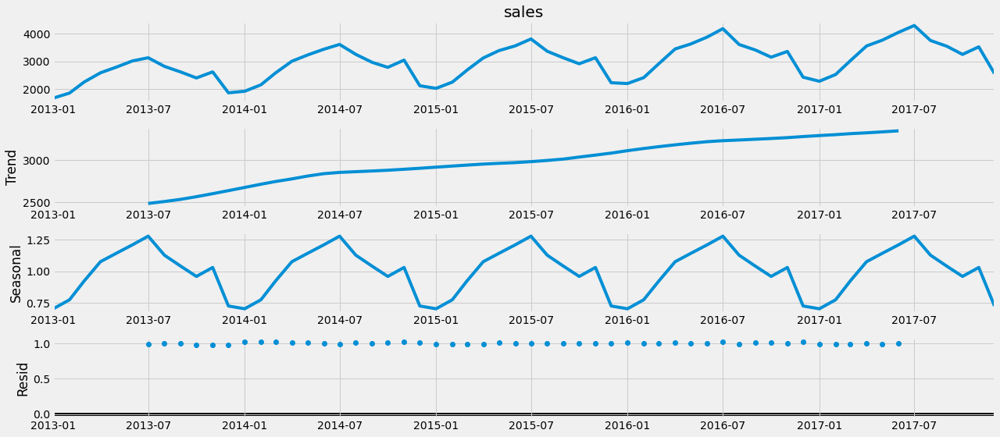

In [81]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 3')
decomposition_office = sm.tsa.seasonal_decompose(store3_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 4


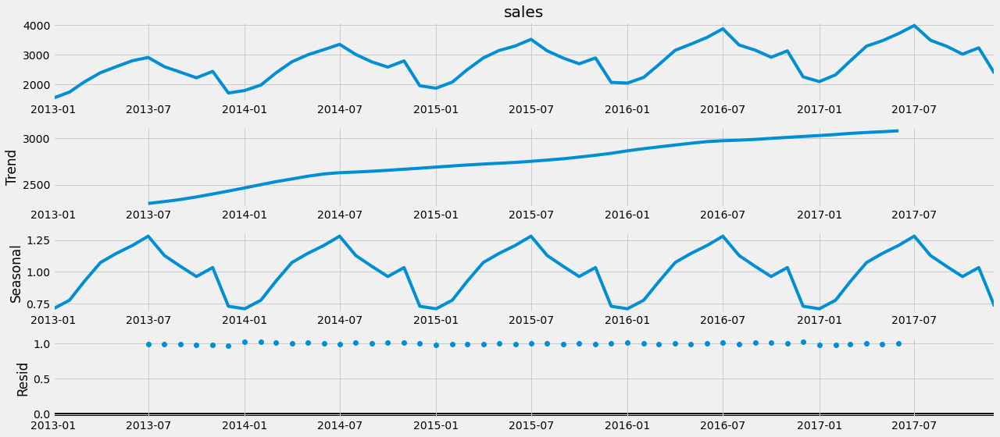

In [82]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 4')
decomposition_office = sm.tsa.seasonal_decompose(store4_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 5


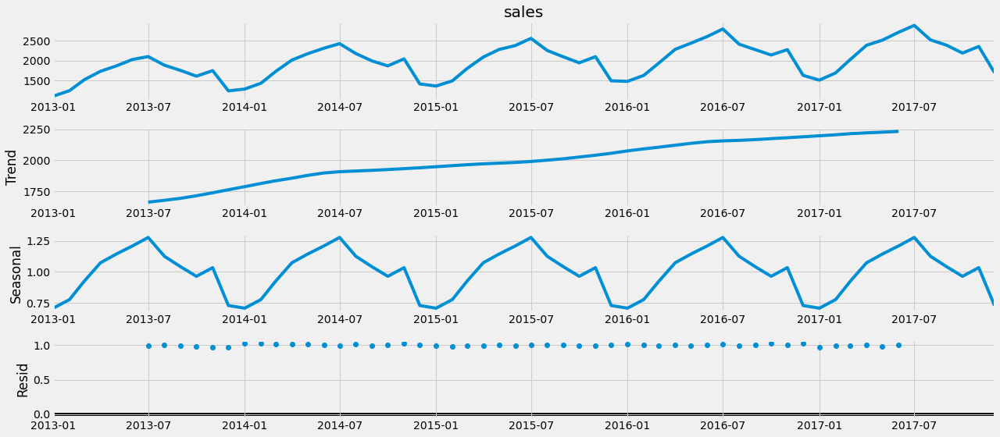

In [83]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 5')
decomposition_office = sm.tsa.seasonal_decompose(store5_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 6


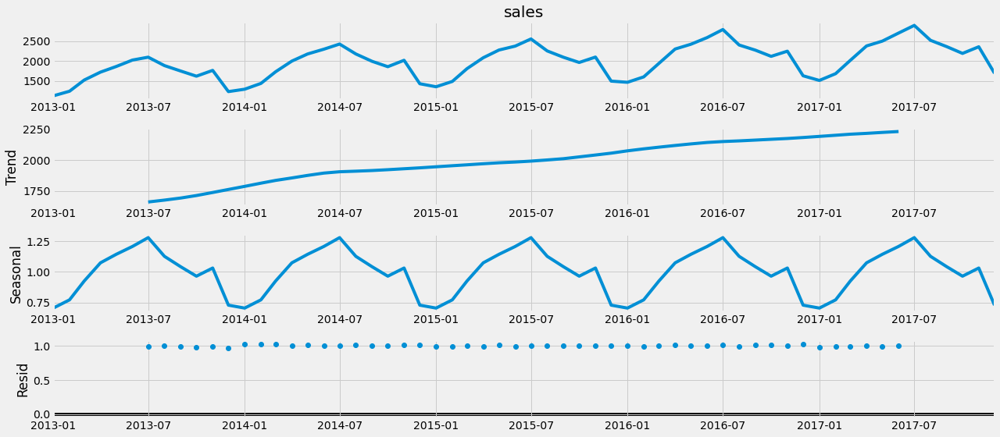

In [84]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 6')
decomposition_office = sm.tsa.seasonal_decompose(store6_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 7


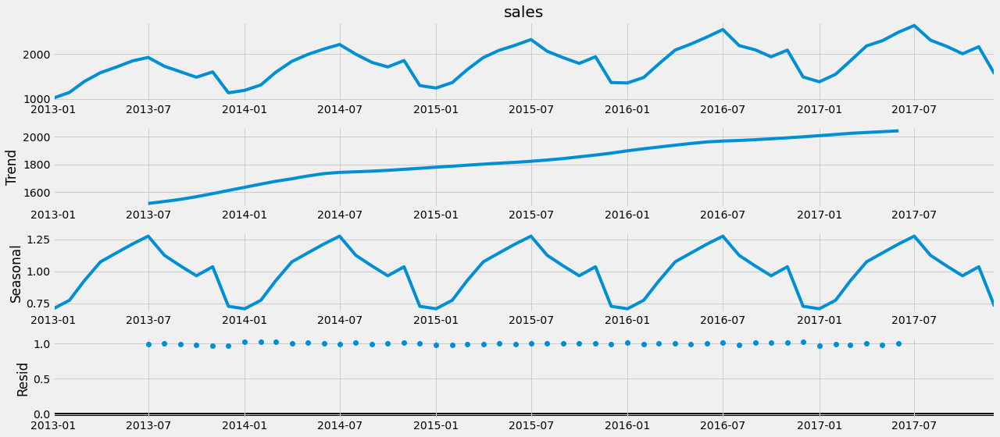

In [85]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 7')
decomposition_office = sm.tsa.seasonal_decompose(store7_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 8


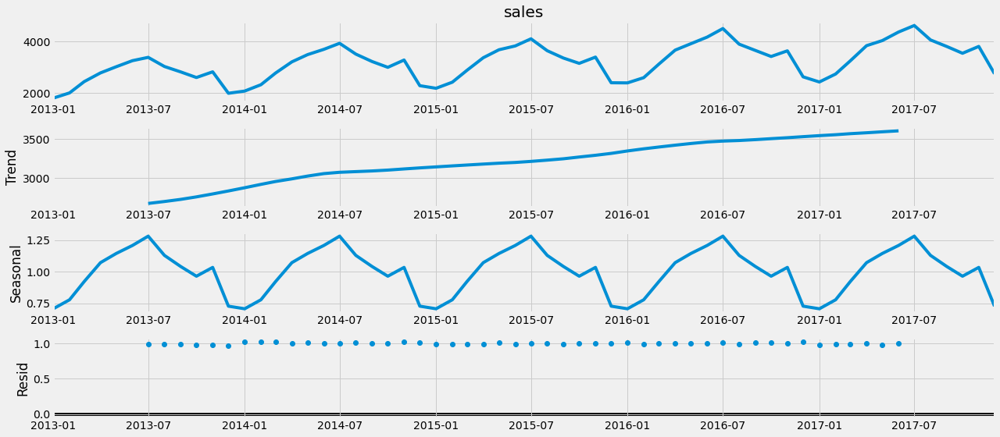

In [86]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 8')
decomposition_office = sm.tsa.seasonal_decompose(store8_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 9


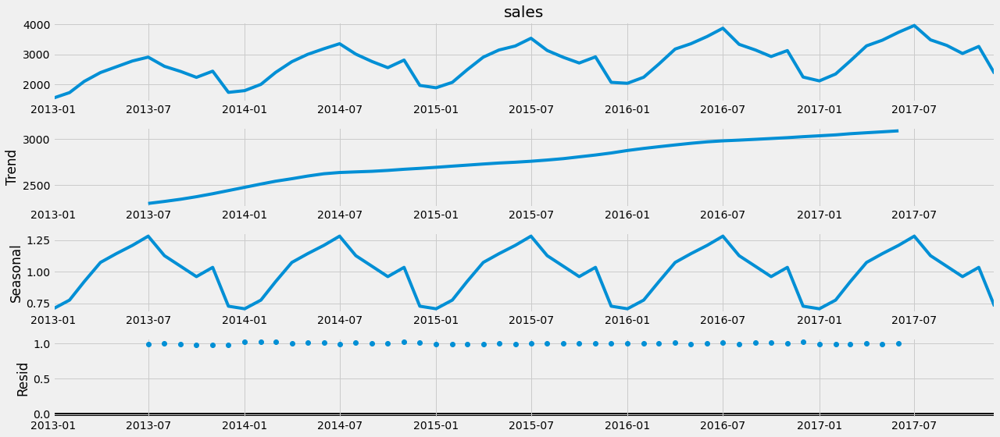

In [87]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 9')
decomposition_office = sm.tsa.seasonal_decompose(store9_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

Decomposition of store 10


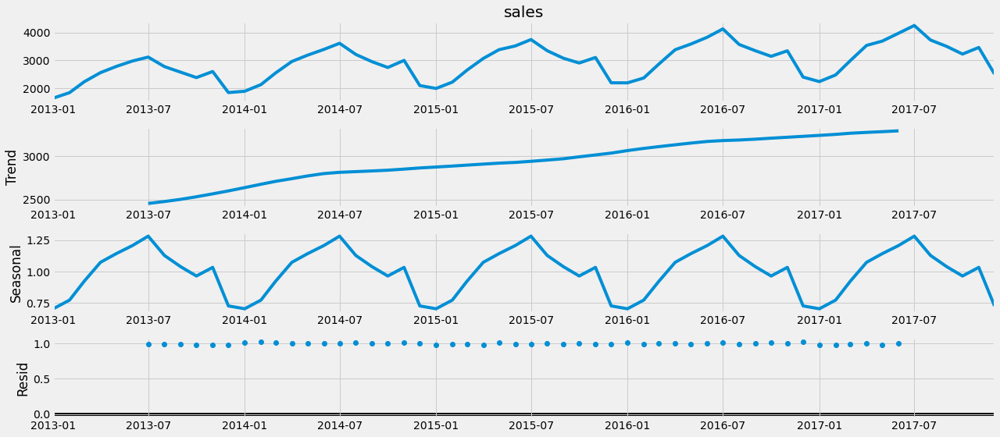

In [88]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
print('Decomposition of store 10')
decomposition_office = sm.tsa.seasonal_decompose(store10_m,model='multiplicative',period=12)
fig = decomposition_office.plot()
plt.show()

## Decompostion Monthly- Additive method

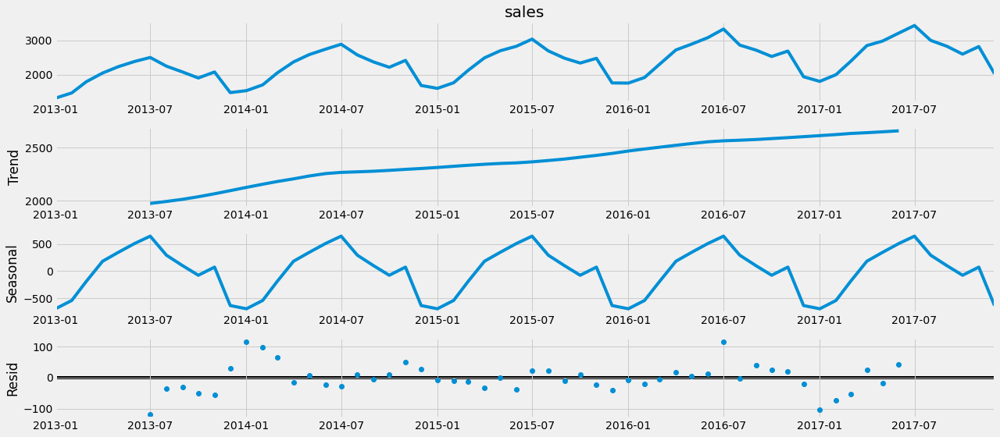

In [89]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1_m,model='additive')
plt = decomposition_office.plot()
plt.show()

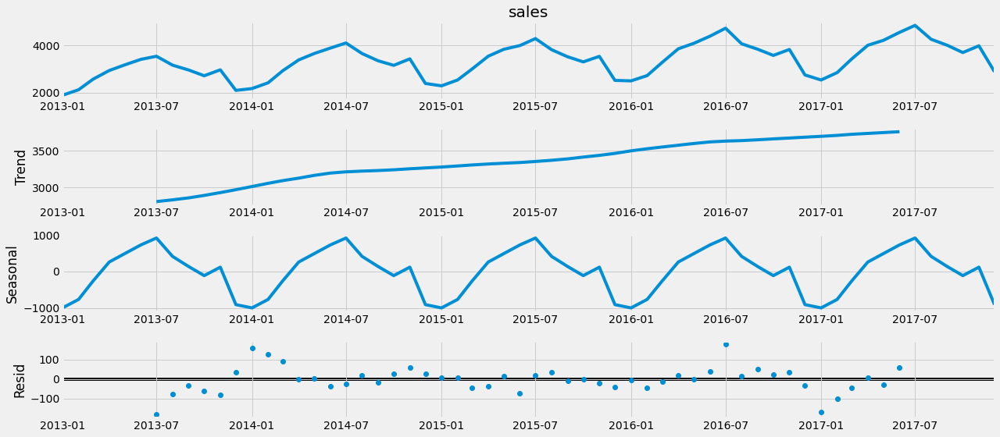

In [90]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store2_m,model='additive')
plt = decomposition_office.plot()
plt.show()

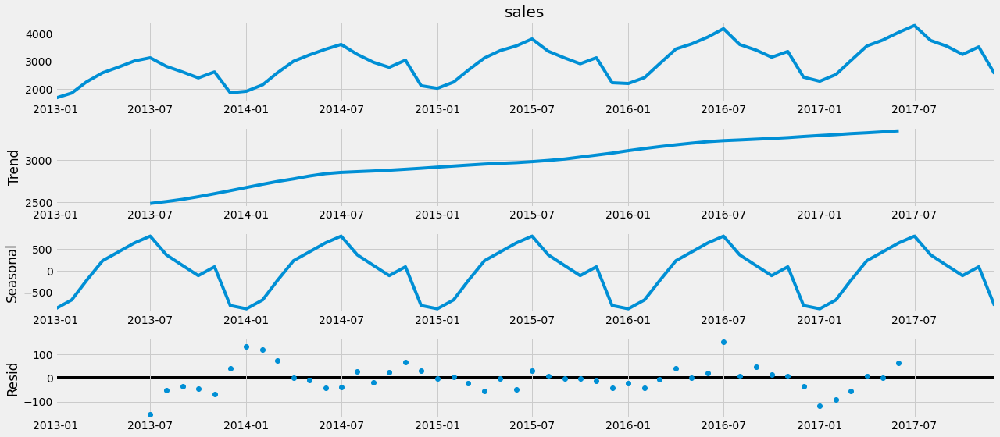

In [91]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store3_m,model='additive')
plt = decomposition_office.plot()
plt.show()

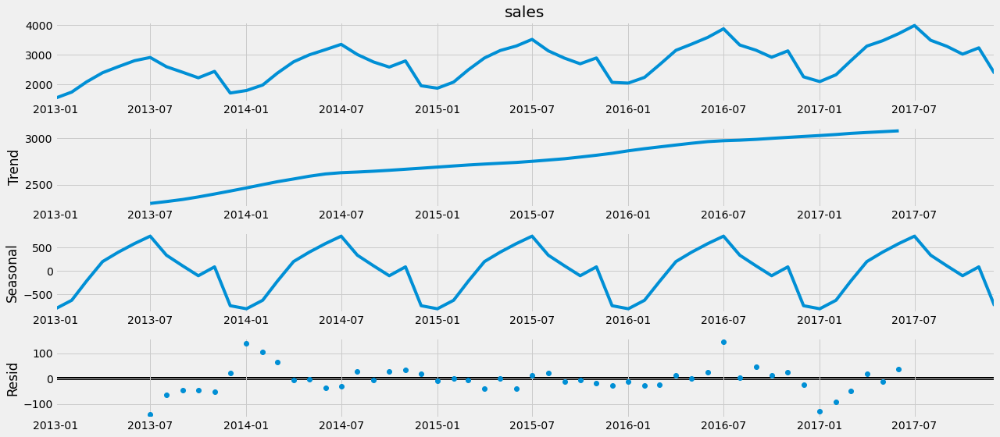

In [92]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store4_m,model='additive')
plt = decomposition_office.plot()
plt.show()

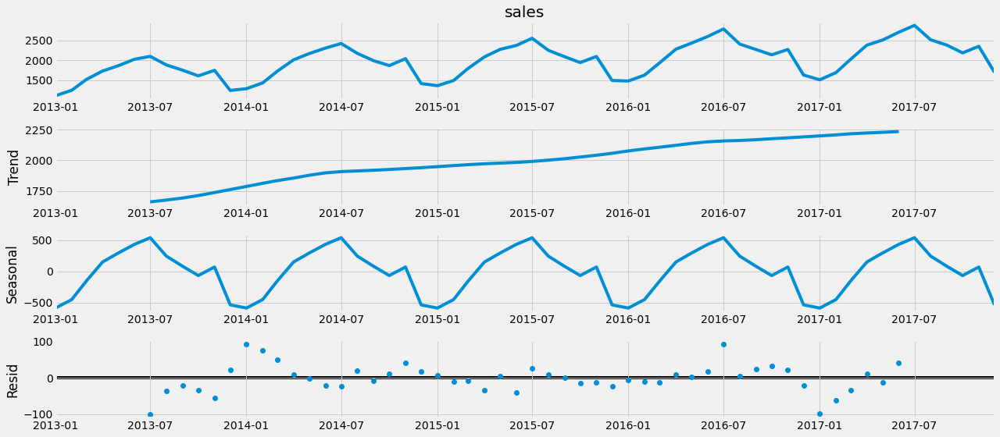

In [93]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store5_m,model='additive')
plt = decomposition_office.plot()
plt.show()

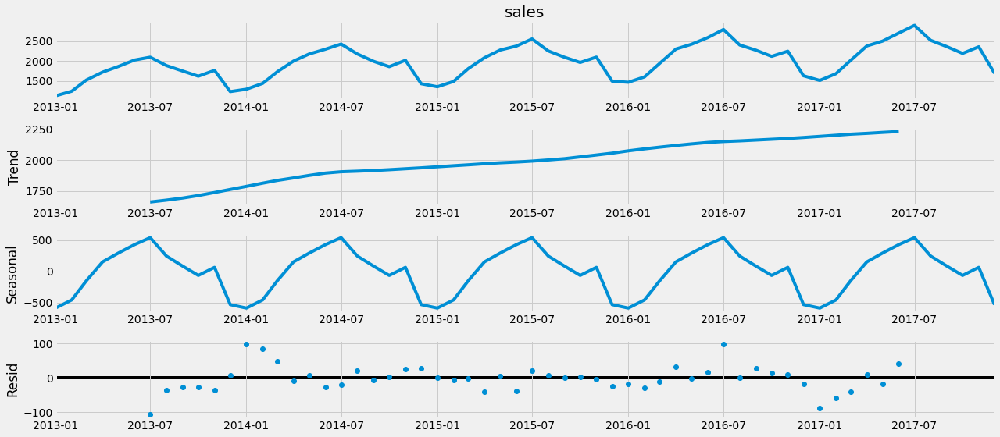

In [94]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store6_m,model='additive')
plt = decomposition_office.plot()
plt.show()

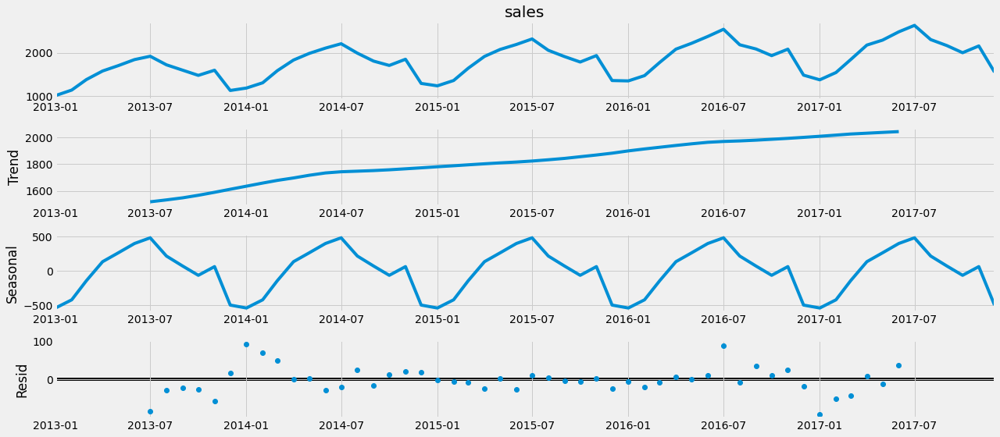

In [95]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store7_m,model='additive')
plt = decomposition_office.plot()
plt.show()

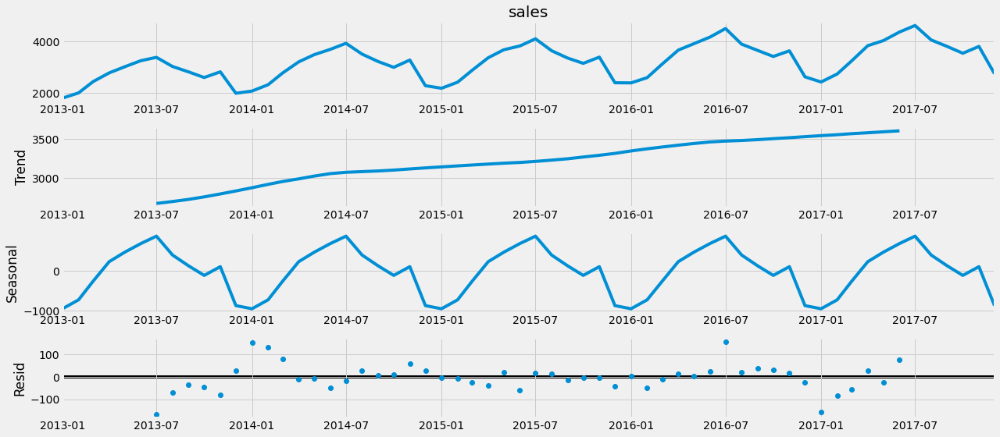

In [96]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store8_m,model='additive')
plt = decomposition_office.plot()
plt.show()

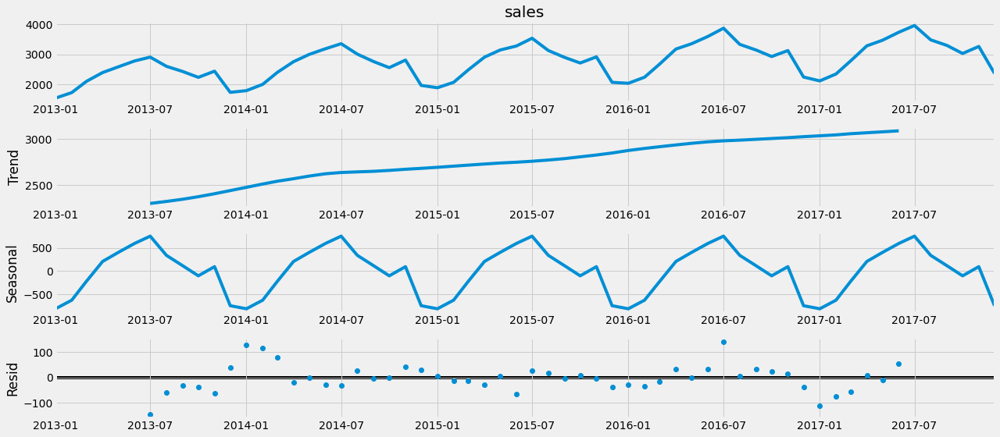

In [97]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store9_m,model='additive')
plt = decomposition_office.plot()
plt.show()

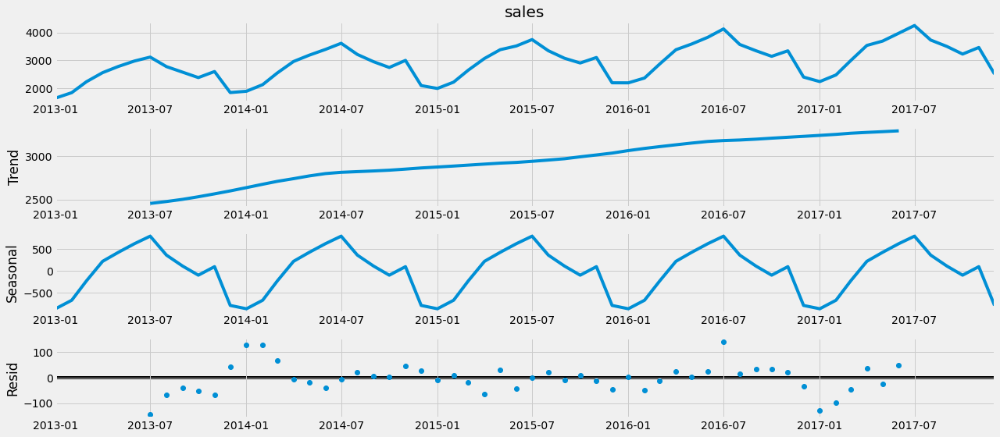

In [98]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store10_m,model='additive',period=12)
plt = decomposition_office.plot()
plt.show()

In [99]:
import matplotlib.pyplot as plt

Store1


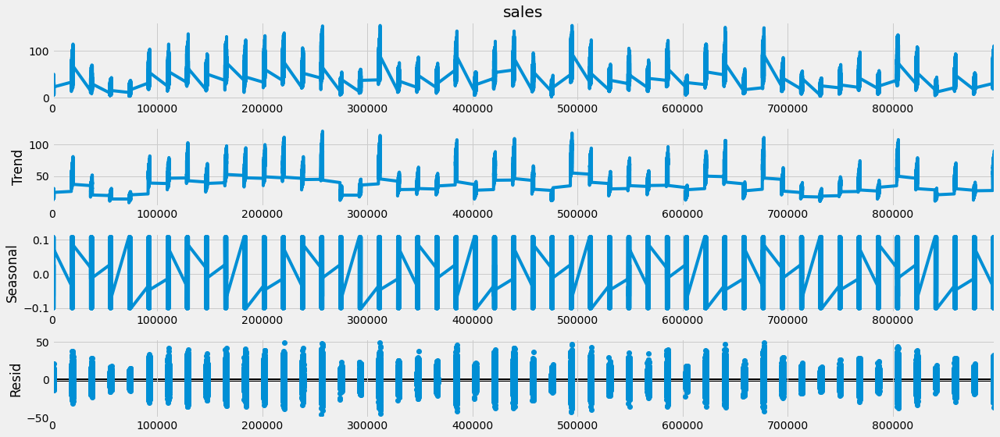

Store2


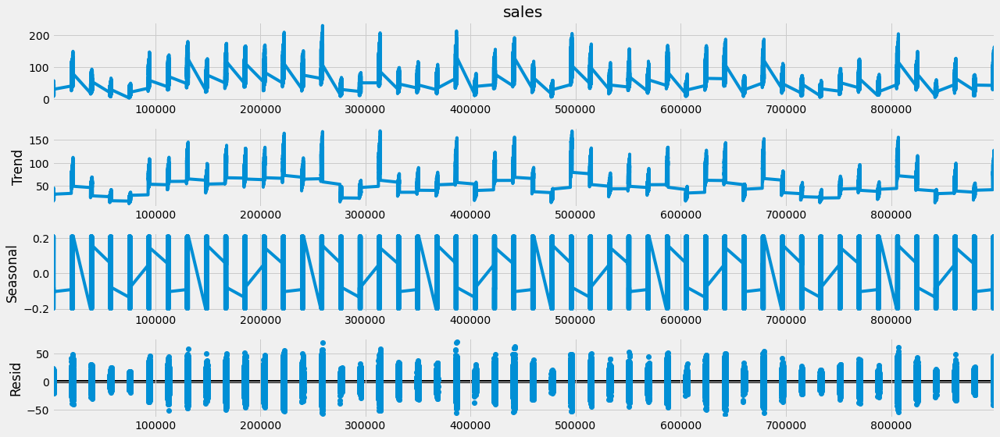

Store3


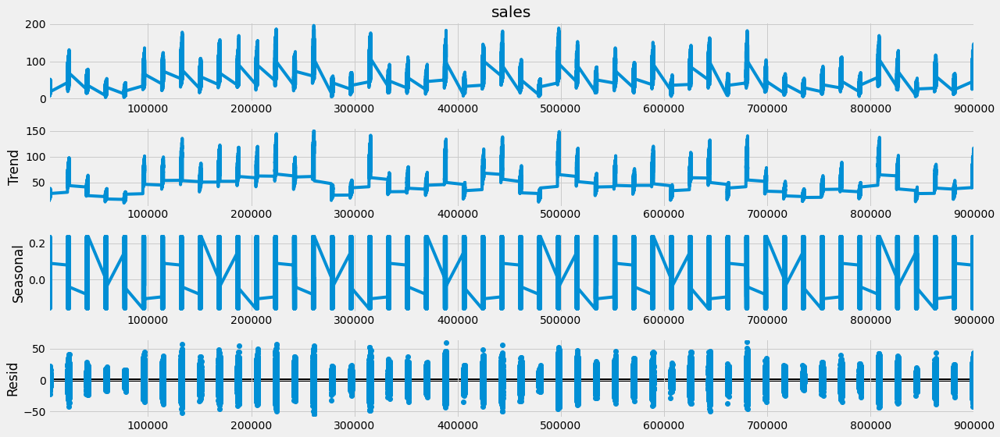

Store4


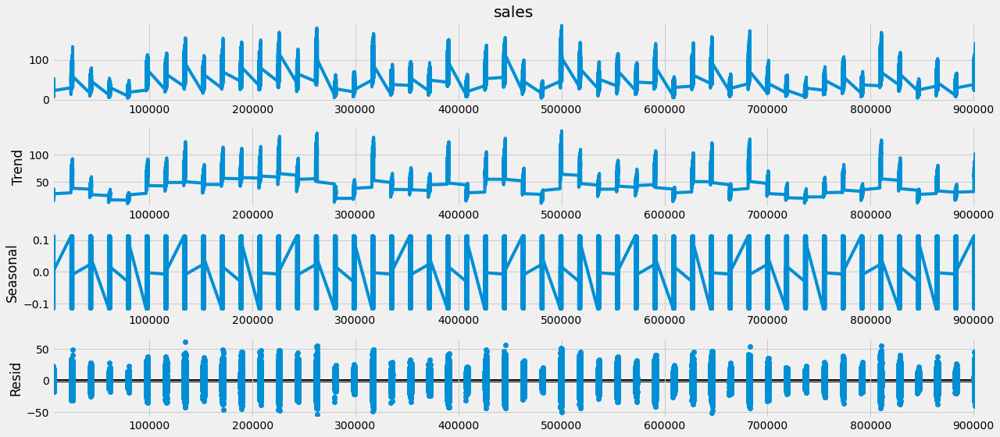

Store5


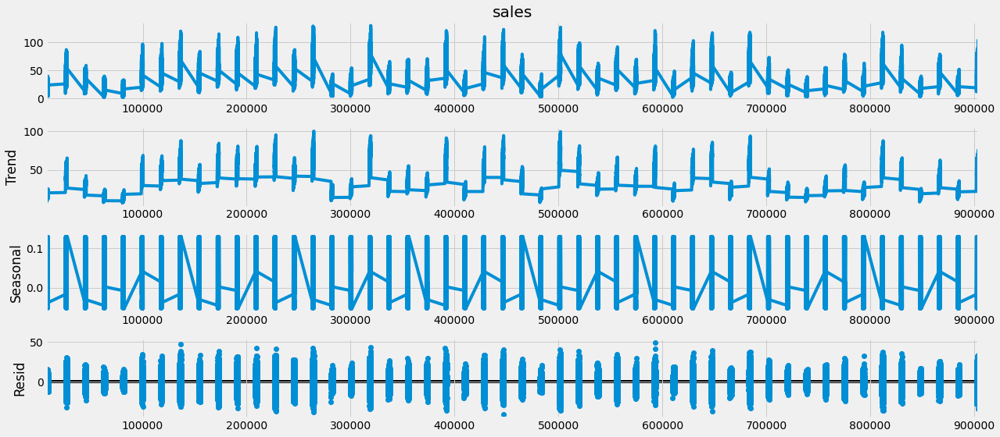

Store6


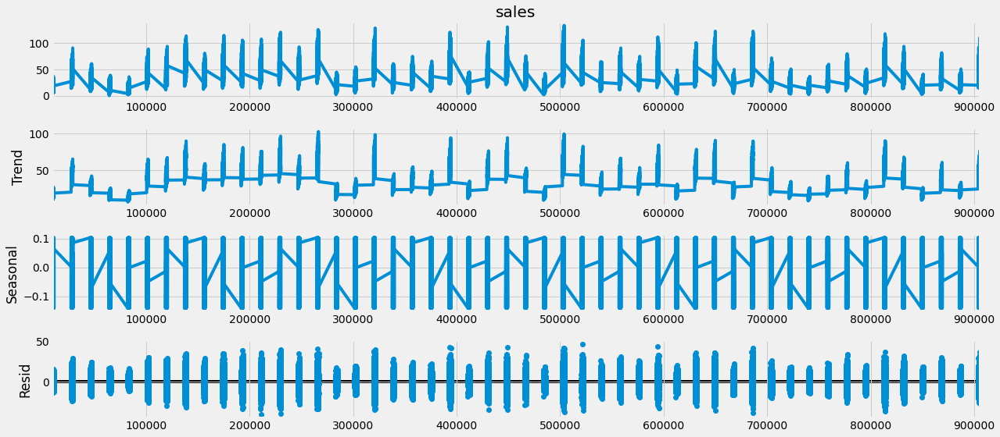

Store7


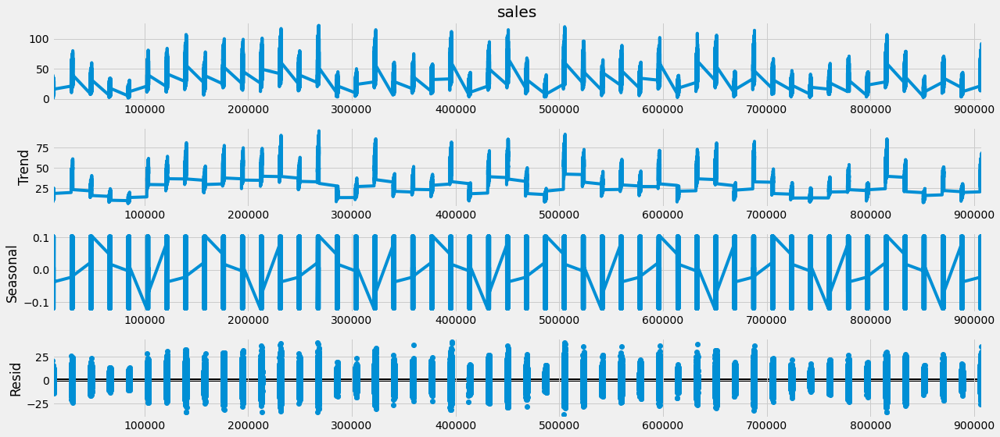

Store8


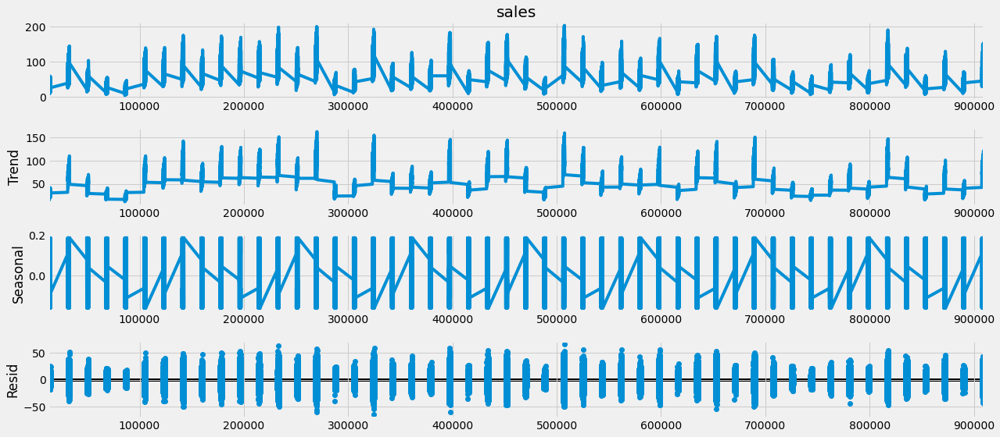

Store9


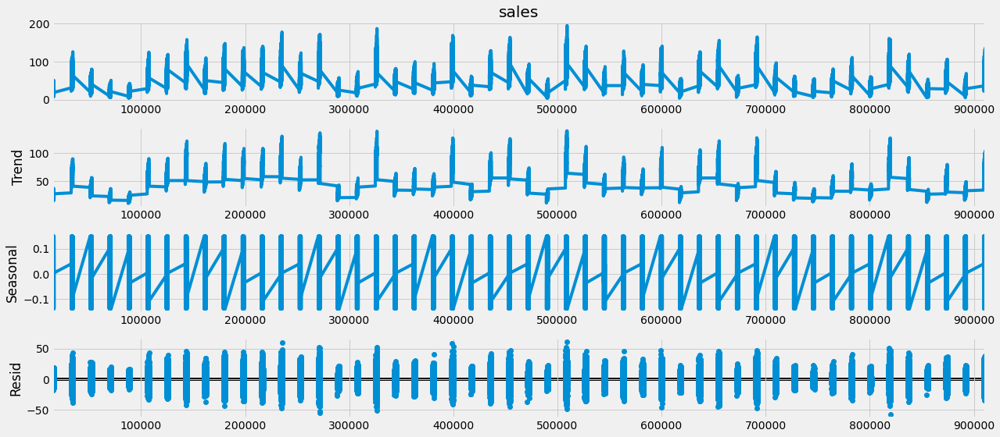

Store10


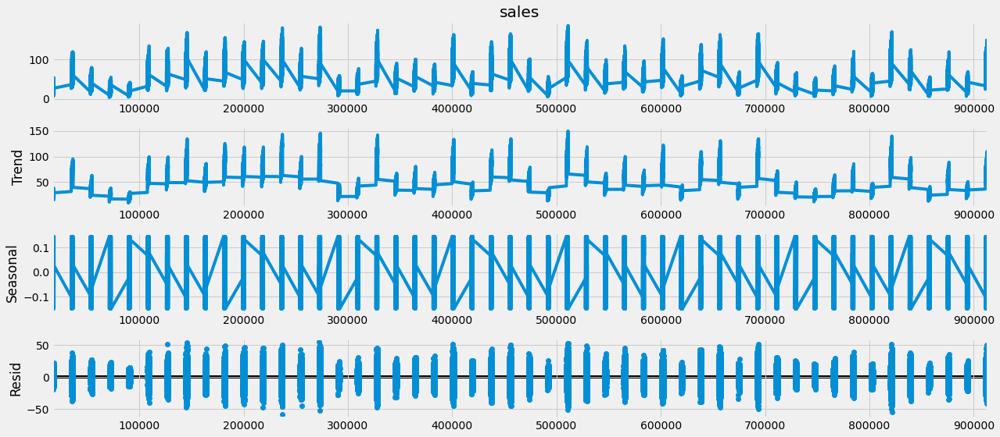

In [100]:
from statsmodels.tsa.seasonal import seasonal_decompose
for i in data['store'].unique():    
    store_i = data.loc[data['store'] == i]
    decompose_ts_add = seasonal_decompose(store_i.sales, model = "additive", period = 12)
    decompose_ts_add.plot()
    print('Store'+ str(i))
    plt.show()

*****

## Stationarity Checking

### Augmented Dickey-Fuller (ADF) test 

In [101]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

In [102]:
adf_test(store1_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.165600
p-value                  0.000010
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [103]:
adf_test(store2_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.012488
p-value                  0.000021
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [104]:
adf_test(store3_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.209288
p-value                  0.000008
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [105]:
adf_test(store4_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.511807
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [106]:
adf_test(store5_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.148333
p-value                  0.000011
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [107]:
adf_test(store6_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.501111
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [108]:
adf_test(store7_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.576794
p-value                  0.000001
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [109]:
adf_test(store8_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.323105
p-value                  0.000005
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [110]:
adf_test(store9_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.528050
p-value                  0.000002
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [111]:
adf_test(store10_m)

Augmented Dickey-Fuller Test: 
ADF test statistic      -5.275954
p-value                  0.000006
# lags used             11.000000
# observations          48.000000
critical value (1%)     -3.574589
critical value (5%)     -2.923954
critical value (10%)    -2.600039
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


### Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test 

In [112]:
from statsmodels.tsa.stattools import kpss
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','#Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)
    
    if  kpsstest[1] >= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is non stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is stationary")

In [113]:
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].mean().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    print('Stationarity of store_'+str(i))
    print('')
    kpss_test(store_i)
    print('**********************************')

Stationarity of store_1

Results of KPSS Test:
Test Statistic           0.538538
p-value                  0.032987
#Lags Used               4.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is stationary
**********************************
Stationarity of store_2

Results of KPSS Test:
Test Statistic           0.534764
p-value                  0.033837
#Lags Used               4.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is stationary
**********************************
Stationarity of store_3

Results of KPSS Test:
Test Statistic           0.539060
p-value          

****

## Auto-Correlation Plots

In [114]:
import matplotlib.pyplot as plt

<Figure size 864x720 with 0 Axes>

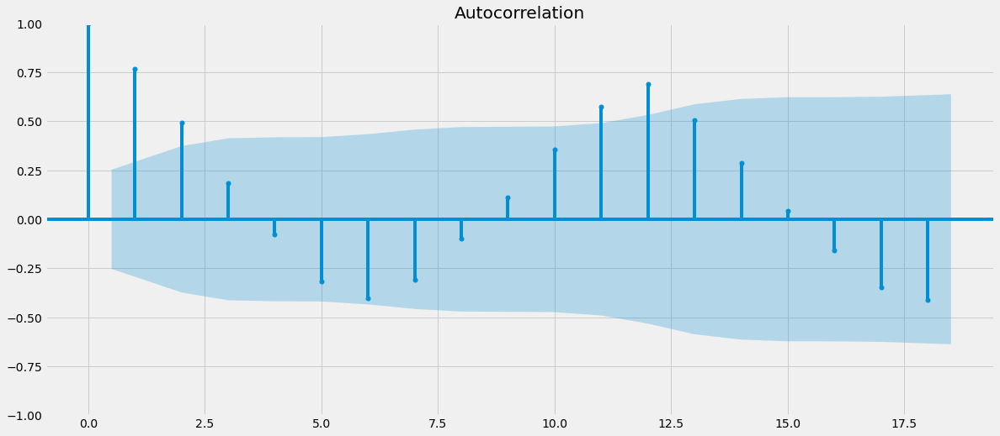

In [115]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store1_m)
plt.show()

<Figure size 864x720 with 0 Axes>

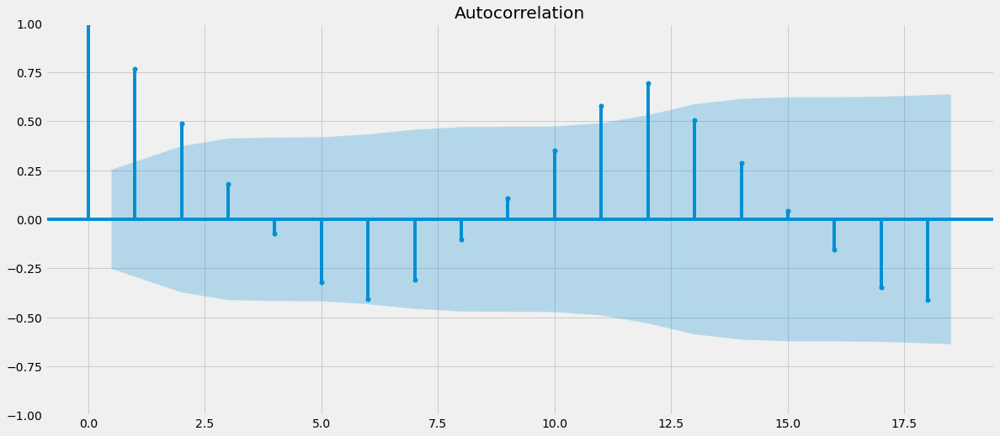

In [116]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store2_m)
plt.show()

<Figure size 864x720 with 0 Axes>

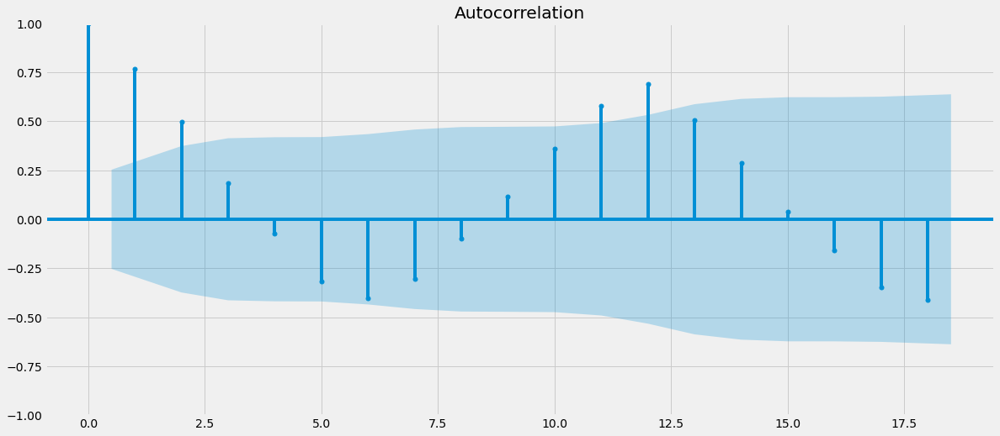

In [117]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store3_m)
plt.show()

<Figure size 864x720 with 0 Axes>

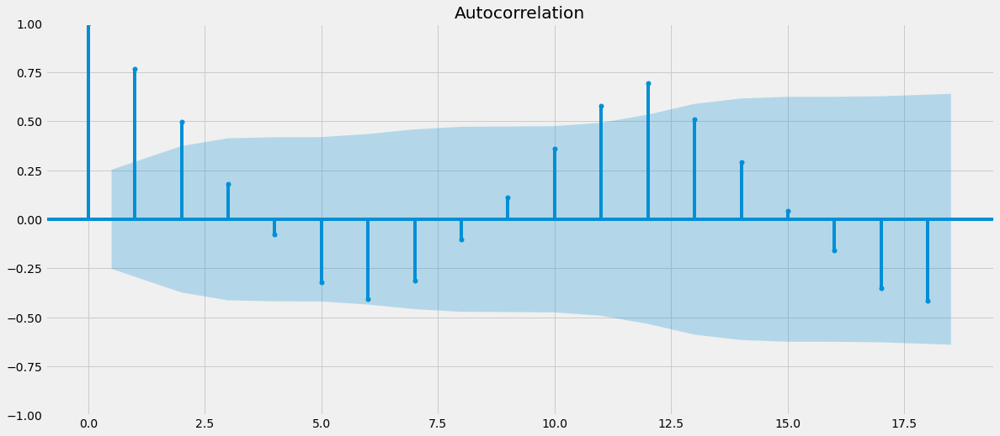

In [118]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store4_m)
plt.show()

<Figure size 864x720 with 0 Axes>

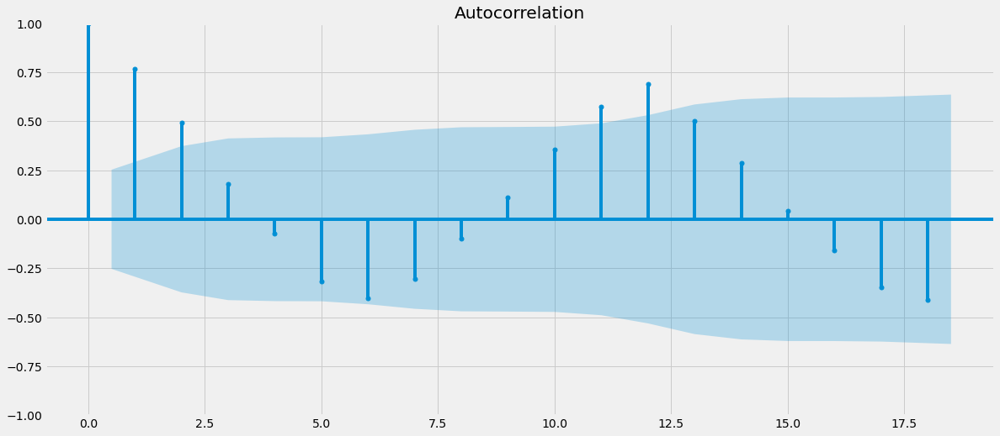

In [119]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store5_m)
plt.show()

<Figure size 864x720 with 0 Axes>

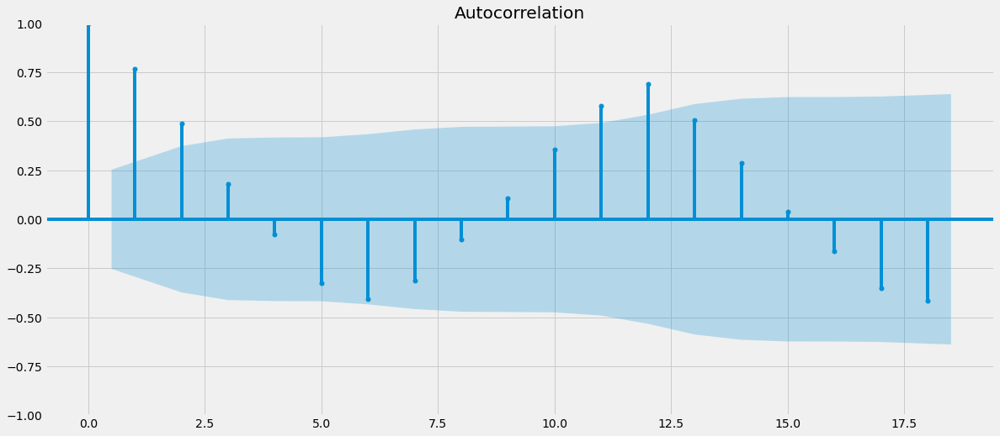

In [120]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store6_m)
plt.show()

<Figure size 864x720 with 0 Axes>

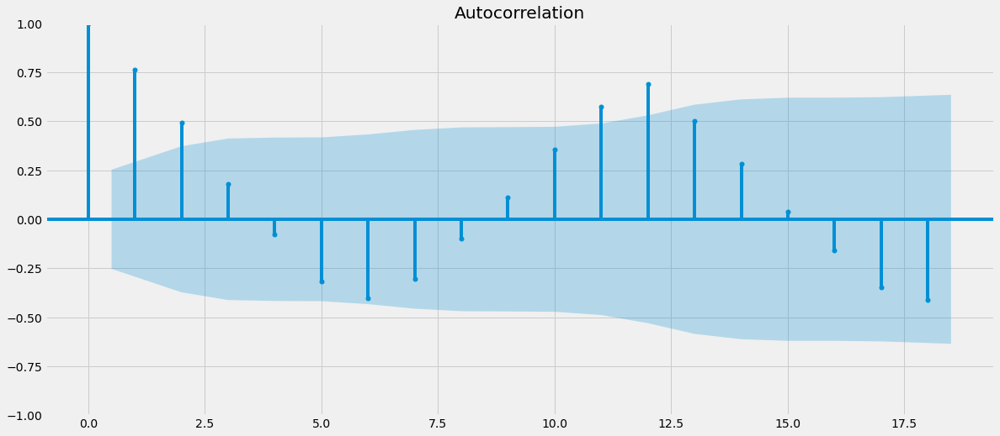

In [121]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store7_m)
plt.show()

<Figure size 864x720 with 0 Axes>

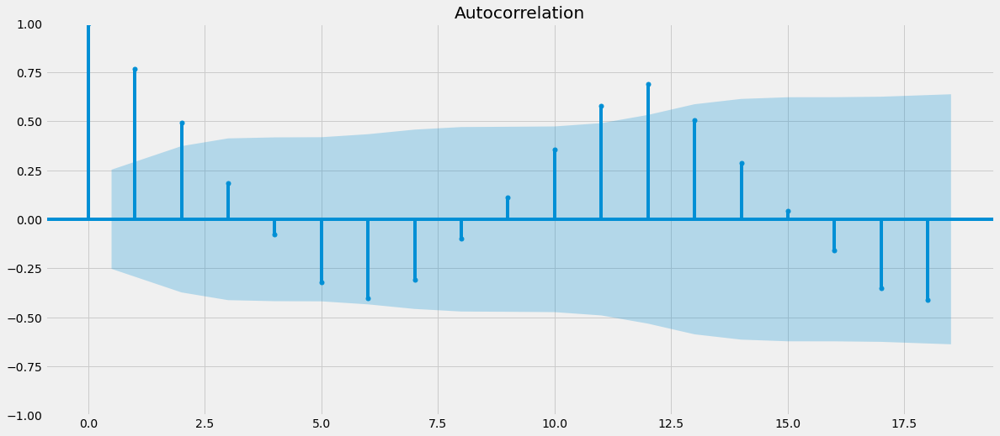

In [122]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store8_m)
plt.show()

<Figure size 864x720 with 0 Axes>

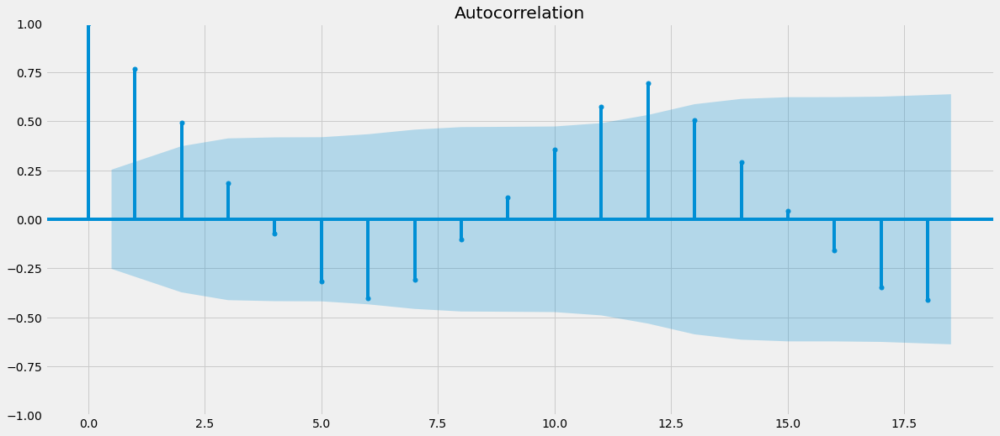

In [123]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store9_m)
plt.show()

<Figure size 864x720 with 0 Axes>

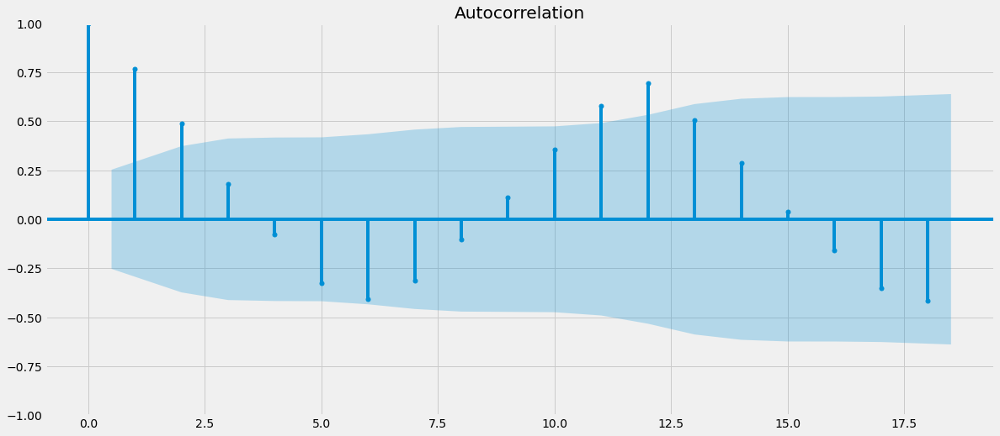

In [124]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store10_m)
plt.show()

## Partial Auto Correlation Plots

<Figure size 864x720 with 0 Axes>

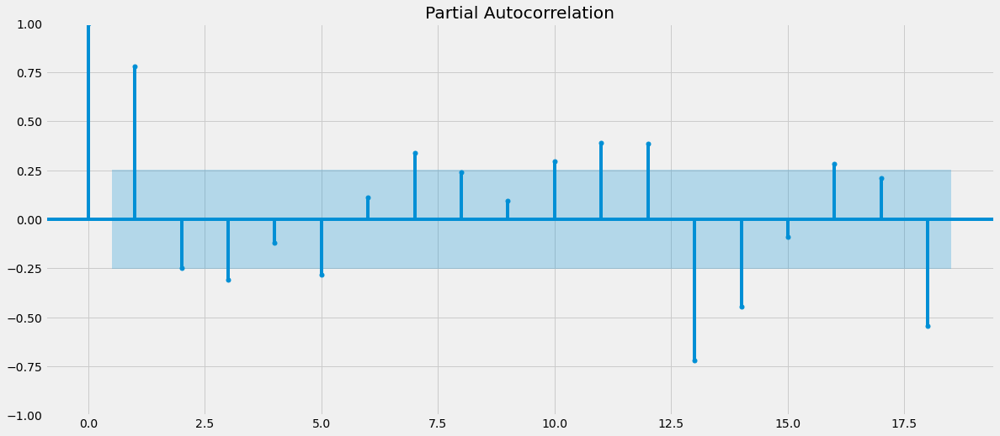

In [125]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store1_m)
plt.show()

<Figure size 864x720 with 0 Axes>

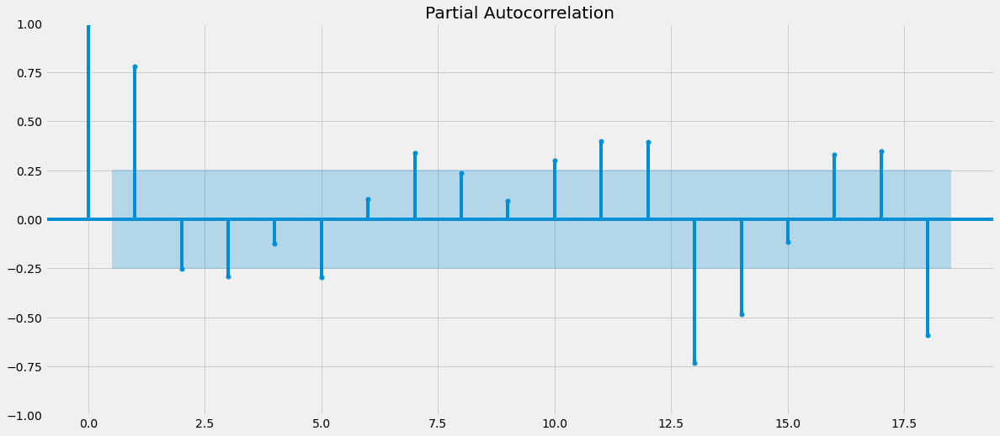

In [126]:

plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store2_m)
plt.show()

<Figure size 864x720 with 0 Axes>

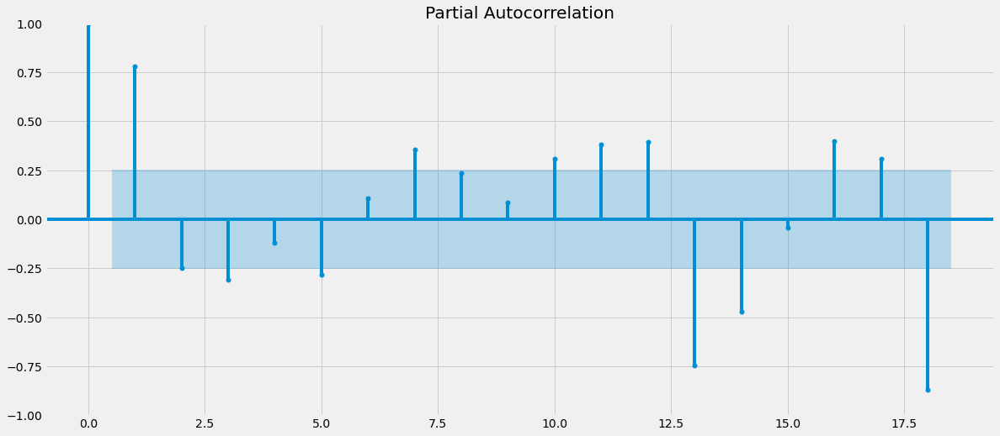

In [127]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store3_m)
plt.show()

<Figure size 864x720 with 0 Axes>

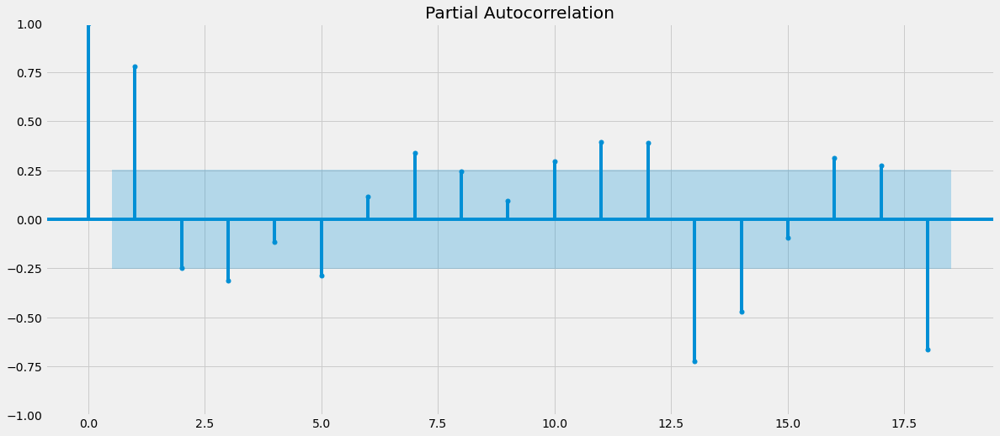

In [128]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store4_m)
plt.show()

<Figure size 864x720 with 0 Axes>

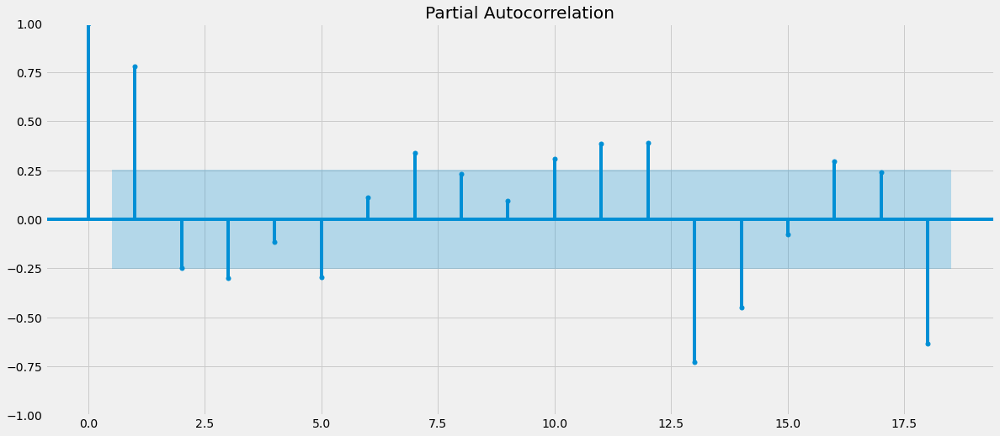

In [129]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store5_m)
plt.show()

<Figure size 864x720 with 0 Axes>

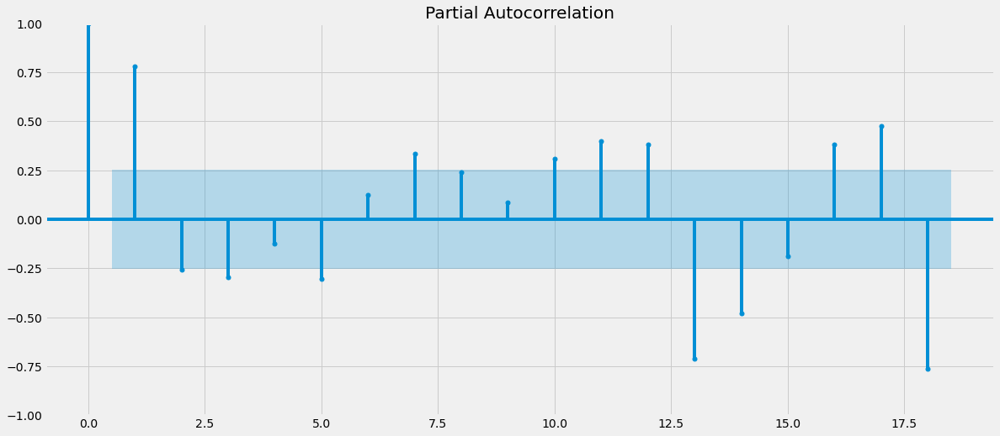

In [130]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store6_m)
plt.show()

<Figure size 864x720 with 0 Axes>

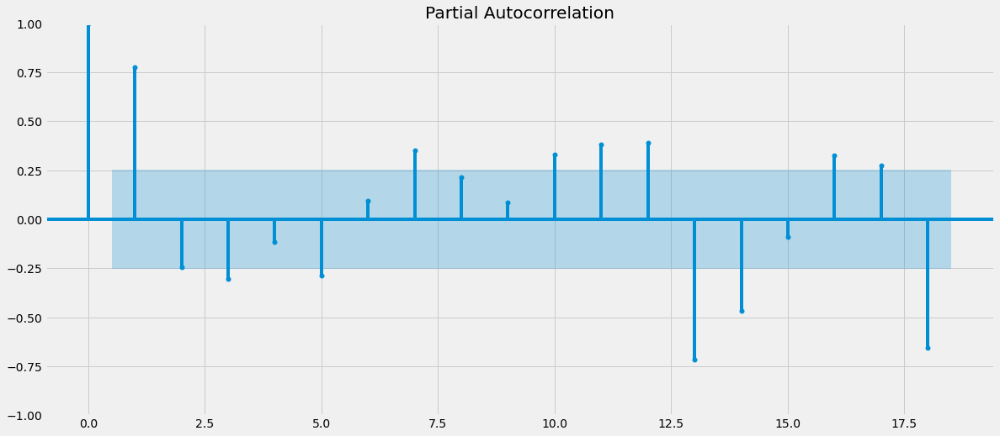

In [131]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store7_m)
plt.show()

<Figure size 864x720 with 0 Axes>

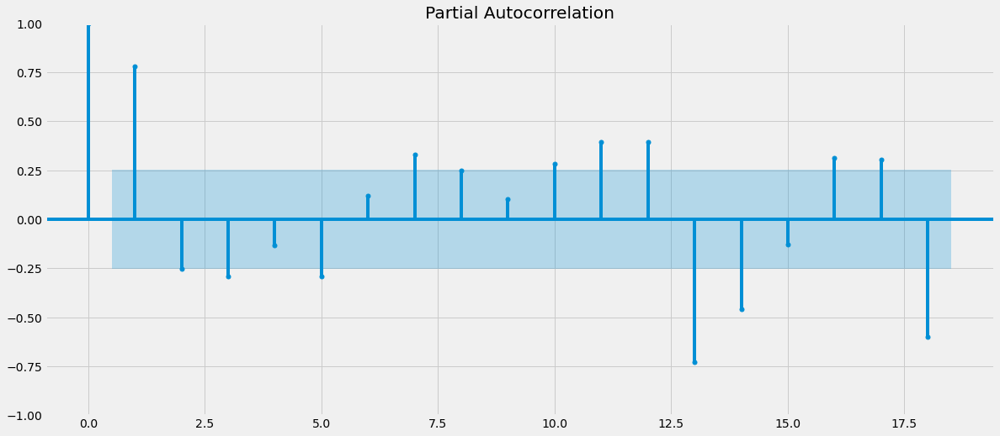

In [132]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store8_m)
plt.show()

<Figure size 864x720 with 0 Axes>

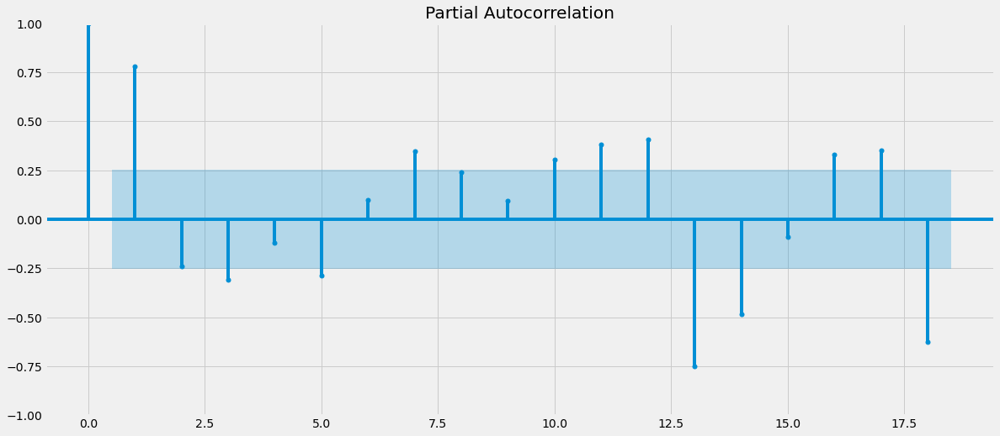

In [133]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store9_m)
plt.show()

<Figure size 576x648 with 0 Axes>

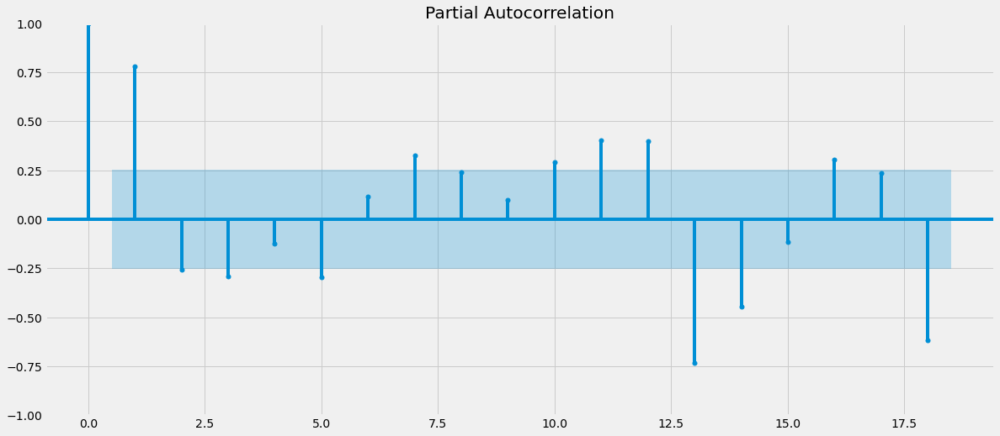

In [134]:
plt.figure(figsize=(8,9))
pacf_plot = plot_pacf(store10_m)
plt.show()

*****

# TIME SERIES FORECASTING MODELS

## SARIMA MODEL

### STORE 1

In [135]:
len(store1_m)

60

In [136]:
train_store1_m = store1_m.iloc[:48]
test_store1_m = store1_m.iloc[48:]

In [137]:
from pmdarima import auto_arima

In [138]:
model_store1_m = auto_arima(store1_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=509.051, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=512.111, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=512.275, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=510.737, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=510.853, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=510.569, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=510.533, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=512.514, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=510.926, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.341 seconds


In [139]:
model_store1_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -253.526
Date:                            Mon, 20 Feb 2023   AIC                            509.051
Time:                                    17:57:50   BIC                            510.901
Sample:                                01-01-2013   HQIC                           509.748
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2835.0701    509.222      5.567      0.000    1837.014    3833.126
===================================================================================
Ljung-Box (L1) (Q):                   0.53   Jarque-Bera (JB):                 6.83
Prob(Q):                              0.46   Prob(JB):                         0.03
Heteroskedasticity (H):               0.83   Skew:                            -0.91
Prob(H) (two-sided):                  0.71   Kurtosis:                         3.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [140]:
model_store1_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [141]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [142]:
train_store1_m

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
2013-06-01    2384.366667
2013-07-01    2500.870968
2013-08-01    2249.838710
2013-09-01    2080.266667
2013-10-01    1907.419355
2013-11-01    2082.166667
2013-12-01    1484.806452
2014-01-01    1541.548387
2014-02-01    1708.500000
2014-03-01    2055.774194
2014-04-01    2371.633333
2014-05-01    2584.129032
2014-06-01    2739.866667
2014-07-01    2883.516129
2014-08-01    2574.000000
2014-09-01    2371.133333
2014-10-01    2217.419355
2014-11-01    2416.866667
2014-12-01    1690.806452
2015-01-01    1607.806452
2015-02-01    1768.928571
2015-03-01    2130.838710
2015-04-01    2490.033333
2015-05-01    2694.290323
2015-06-01    2824.833333
2015-07-01    3031.258065
2015-08-01    2691.677419
2015-09-01    2479.633333
2015-10-01    2339.354839
2015-11-01    2476.400000
2015-12-01    1764.548387
2016-01-01    1759.967742
2016-02-01    1921.448276
2016-03

In [143]:
model_store1= SARIMAX(train_store1_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12),enforce_invertibility=False)

In [144]:
result_store1 = model_store1.fit()

In [145]:
result_store1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -186.393
Date:                            Mon, 20 Feb 2023   AIC                            386.787
Time:                                    17:57:52   BIC                            397.674
Sample:                                01-01-2013   HQIC                           390.545
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0155      0.169      0.092      0.927      -0.316       0.347
ma.L2         -0.2079      0.284     -0.732      0.464      -0.765       0.349
ma.L3          0.2608      0.226      1.154      0.249      -0.182       0.704
ma.S.L12      -0.1015      4.896     -0.021      0.983      -9.697       9.494
ma.S.L24       1.0025      0.309      3.241      0.001       0.396       1.609
ma.S.L36      -0.0486      9.917     -0.005      0.996     -19.486      19.388
sigma2      1332.9666      0.000   3.07e+06      0.000    1332.966    1332.967
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 2.67
Prob(Q):                              0.82   Prob(JB):                         0.26
Heteroskedasticity (H):               0.79   Skew:                            -0.68
Prob(H) (two-sided):                  0.70   Kurtosis:                         3.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.02e+25. Standard errors may be unstable.
"""

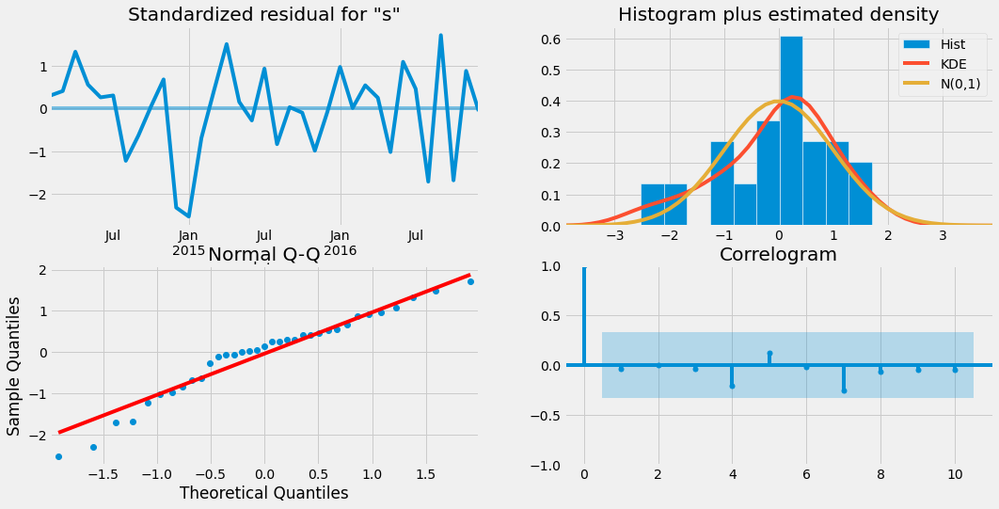

In [146]:
result_store1.plot_diagnostics(figsize=(16,8))
plt.show()

In [147]:
start = len(train_store1_m)
end = len(train_store1_m) + len(test_store1_m) - 1

In [148]:
prediction_store1_m = result_store1.predict(start,end).rename('SARIMA model predictions')

In [149]:
prediction_store1_m 

2017-01-01    1837.775671
2017-02-01    2008.462416
2017-03-01    2401.168082
2017-04-01    2833.158145
2017-05-01    3004.129264
2017-06-01    3173.053793
2017-07-01    3451.144277
2017-08-01    2979.952146
2017-09-01    2821.034044
2017-10-01    2649.914017
2017-11-01    2773.488548
2017-12-01    2028.992731
Freq: MS, Name: SARIMA model predictions, dtype: float64

Text(0.5, 1.0, 'store1 month supplies sales')

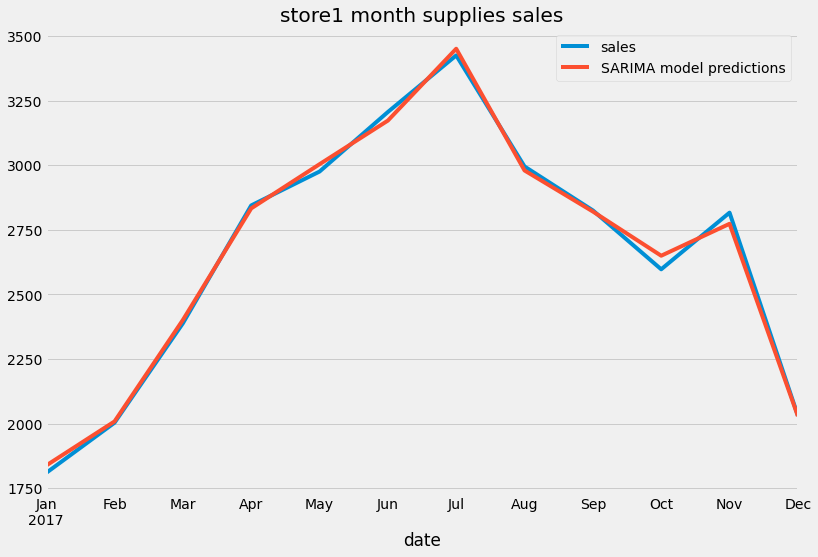

In [150]:
test_store1_m.plot(figsize=(12,8),legend=True)
prediction_store1_m.plot(legend=True)
plt.title("store1 month supplies sales")

In [151]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse

### Model Evaluation scores Store 1

In [152]:
msc1=mean_squared_error(test_store1_m,prediction_store1_m)
msc1

715.9466162709577

In [153]:
r1=rmse(test_store1_m,prediction_store1_m)
r1

26.75717878011353

In [154]:
t1=test_store1_m.mean()
t1

2659.885304659498

In [155]:
#Comparing the mean value to the root mean square value we can say that the model had predicted in a good way

In [156]:
#Now let us forecast into the unknown future
model_store1_m_final = SARIMAX(store1_m,order=(0, 1, 1),seasonal_order=(0, 1, 0, 12))

In [157]:
result_store1_m_final = model_store1_m_final.fit()

In [158]:
forecast_store1_m= result_store1_m_final.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'store1 Monthly supplies sales')

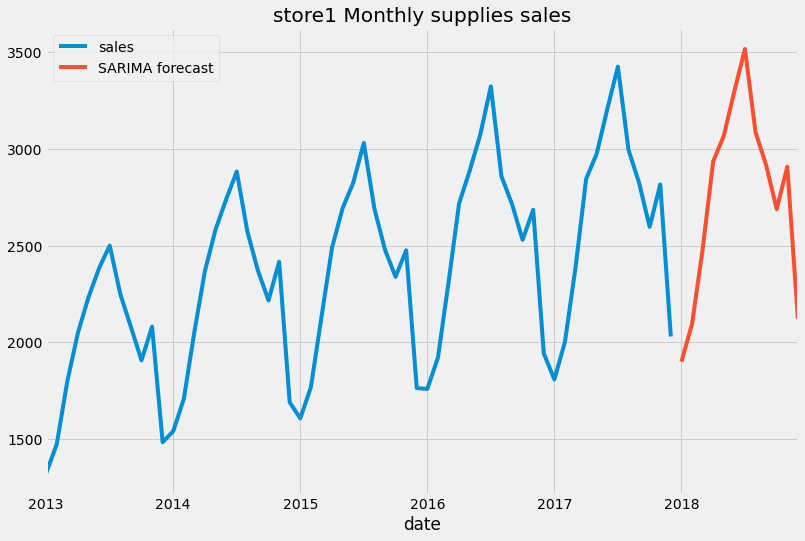

In [159]:
store1_m.plot(legend=True,figsize=(12,8))
forecast_store1_m.plot(legend=True)
plt.title("store1 Monthly supplies sales")

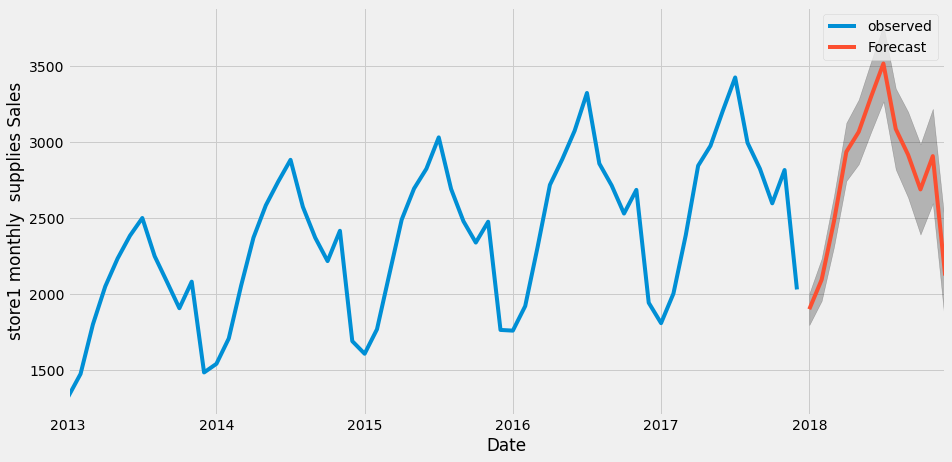

In [160]:
pred_store1_m = result_store1_m_final.get_forecast(steps=12)
pred_ci_store1_m = pred_store1_m.conf_int()
ax = store1_m.plot(label='observed',figsize=(14,7))
pred_store1_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store1_m.index,
               pred_ci_store1_m.iloc[:,0],
               pred_ci_store1_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('store1 monthly  supplies Sales')
plt.legend()
plt.show()

## STORE 2

In [161]:
train_store2_m = store2_m.iloc[:48]
test_store2_m = store2_m.iloc[48:]

In [162]:
model_store2_m = auto_arima(store2_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=542.300, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=545.063, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=545.329, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=543.409, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=543.719, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=544.009, Time=0.12 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=543.904, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=544.219, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.755 seconds


In [163]:
model_store2_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -270.150
Date:                            Mon, 20 Feb 2023   AIC                            542.300
Time:                                    17:58:00   BIC                            544.151
Sample:                                01-01-2013   HQIC                           542.997
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5751.0694   1044.959      5.504      0.000    3702.988    7799.151
===================================================================================
Ljung-Box (L1) (Q):                   0.33   Jarque-Bera (JB):                 5.07
Prob(Q):                              0.57   Prob(JB):                         0.08
Heteroskedasticity (H):               0.64   Skew:                            -0.77
Prob(H) (two-sided):                  0.38   Kurtosis:                         3.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [164]:
model_store2_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [165]:
model_store2_m = SARIMAX(train_store2_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store2_m = model_store2_m.fit()
result_store2_m.summary()

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -199.068
Date:                            Mon, 20 Feb 2023   AIC                            412.137
Time:                                    17:58:03   BIC                            423.024
Sample:                                01-01-2013   HQIC                           415.895
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0743      0.201     -0.370      0.711      -0.468       0.319
ma.L2         -0.1736      0.244     -0.712      0.476      -0.651       0.304
ma.L3          0.3669      0.198      1.849      0.064      -0.022       0.756
ma.S.L12      -0.1335     28.265     -0.005      0.996     -55.532      55.265
ma.S.L24       0.9764    237.196      0.004      0.997    -463.920     465.873
ma.S.L36       0.0552     24.803      0.002      0.998     -48.558      48.668
sigma2      2773.9864   6.66e+05      0.004      0.997    -1.3e+06    1.31e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.54
Prob(Q):                              0.95   Prob(JB):                         0.76
Heteroskedasticity (H):               0.82   Skew:                            -0.27
Prob(H) (two-sided):                  0.74   Kurtosis:                         2.72
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

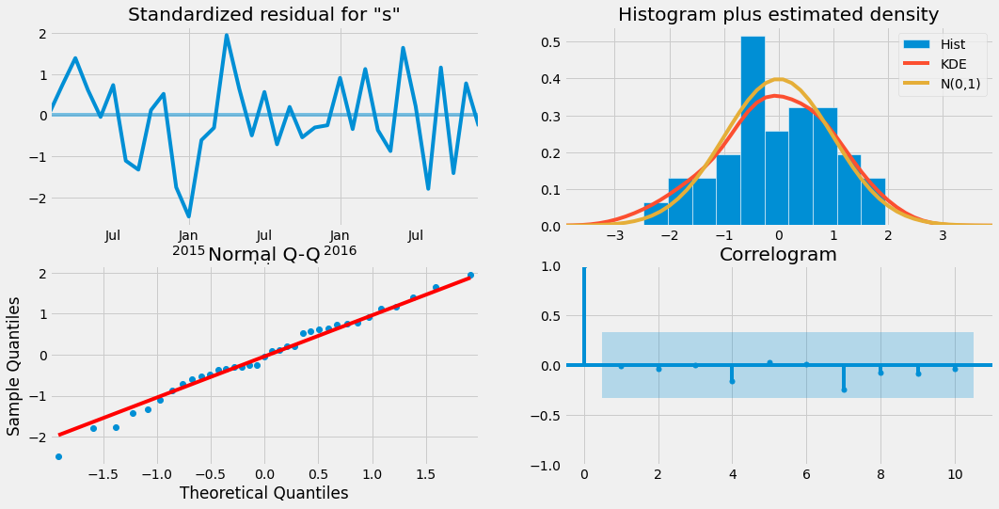

In [166]:
result_store2_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [167]:
#Now predict the values in the future
start = len(train_store2_m)
end = len(train_store2_m) + len(test_store2_m) - 1

In [168]:
prediction_store2_m = result_store2_m.predict(start,end).rename('SARIMA model predictions-Store2')
prediction_store2_m 

2017-01-01    2596.082398
2017-02-01    2845.863993
2017-03-01    3374.580989
2017-04-01    3996.126656
2017-05-01    4250.500758
2017-06-01    4497.239854
2017-07-01    4880.946326
2017-08-01    4223.939095
2017-09-01    3975.371645
2017-10-01    3716.128765
2017-11-01    3946.130168
2017-12-01    2861.560081
Freq: MS, Name: SARIMA model predictions-Store2, dtype: float64

Text(0.5, 1.0, 'Store 2 month supplies sales')

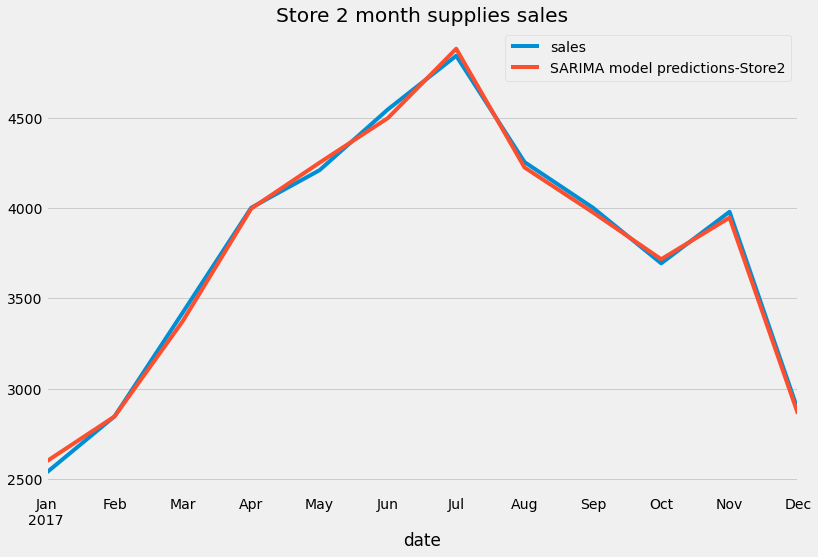

In [169]:
test_store2_m.plot(figsize=(12,8),legend=True)
prediction_store2_m.plot(legend=True)
plt.title("Store 2 month supplies sales")

### Model Evaluation scores Store 2 

In [170]:
msc2=mean_squared_error(test_store2_m,prediction_store2_m)
msc2

1271.4864346817342

In [171]:
r2=rmse(test_store2_m,prediction_store2_m)
r2

35.657908445136464

In [172]:
t2=test_store2_m.mean()
t2

3767.342921146954

In [173]:
#Comparing the mean value to the root mean square value we can say that the model had predicted in a good way

In [174]:
#Now let us forecast into the unknown future
model_store2_m_final = SARIMAX(store2_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12))

In [175]:
result_store2_m_final = model_store2_m_final.fit()
forecast_store2_m= result_store2_m_final.predict(len(store2_m),len(store2_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'store 2 Monthly supplies sales')

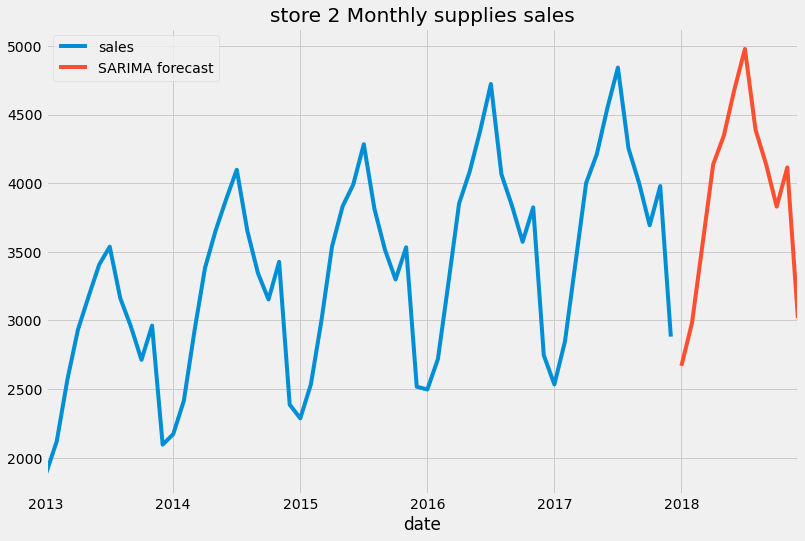

In [176]:
store2_m.plot(legend=True,figsize=(12,8))
forecast_store2_m.plot(legend=True)
plt.title("store 2 Monthly supplies sales")

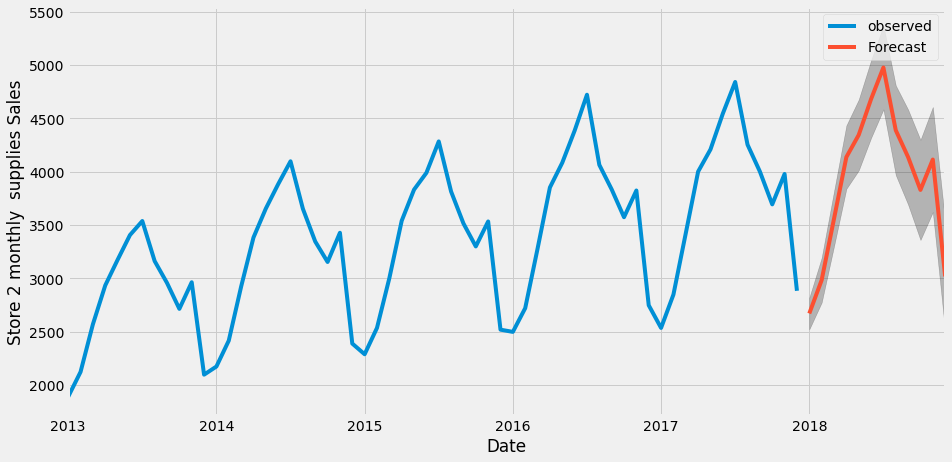

In [177]:
pred_store2_m = result_store2_m_final.get_forecast(steps=12)
pred_ci_store2_m = pred_store2_m.conf_int()
ax = store2_m.plot(label='observed',figsize=(14,7))
pred_store2_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store2_m.index,
               pred_ci_store2_m.iloc[:,0],
               pred_ci_store2_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 2 monthly  supplies Sales')
plt.legend()
plt.show()

## STORE 3

In [178]:
train_store3_m = store3_m.iloc[:48]
test_store3_m = store3_m.iloc[48:]
model_store3_m = auto_arima(store3_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=524.465, Time=0.22 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=527.964, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=527.987, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=526.371, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=526.396, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=526.105, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=526.078, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=527.776, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=526.389, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.355 seconds


In [179]:
model_store3_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -261.233
Date:                            Mon, 20 Feb 2023   AIC                            524.465
Time:                                    17:58:10   BIC                            526.315
Sample:                                01-01-2013   HQIC                           525.162
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3935.2325    775.012      5.078      0.000    2416.237    5454.229
===================================================================================
Ljung-Box (L1) (Q):                   0.39   Jarque-Bera (JB):                 4.68
Prob(Q):                              0.53   Prob(JB):                         0.10
Heteroskedasticity (H):               0.40   Skew:                            -0.77
Prob(H) (two-sided):                  0.08   Kurtosis:                         3.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [180]:
model_store3_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [181]:
model_store3_m = SARIMAX(train_store3_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store3_m = model_store3_m.fit()
result_store3_m.summary()

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -194.640
Date:                            Mon, 20 Feb 2023   AIC                            403.281
Time:                                    17:58:14   BIC                            414.168
Sample:                                01-01-2013   HQIC                           407.039
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0427      0.181     -0.236      0.813      -0.397       0.312
ma.L2         -0.0779      0.220     -0.355      0.723      -0.508       0.353
ma.L3          0.2876      0.208      1.385      0.166      -0.120       0.695
ma.S.L12      -0.0951     70.077     -0.001      0.999    -137.443     137.253
ma.S.L24       0.7284    207.070      0.004      0.997    -405.121     406.578
ma.S.L36       0.4012    121.848      0.003      0.997    -238.416     239.219
sigma2      2450.0242   5.95e+05      0.004      0.997   -1.16e+06    1.17e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):                 2.76
Prob(Q):                              0.84   Prob(JB):                         0.25
Heteroskedasticity (H):               0.61   Skew:                            -0.66
Prob(H) (two-sided):                  0.40   Kurtosis:                         2.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

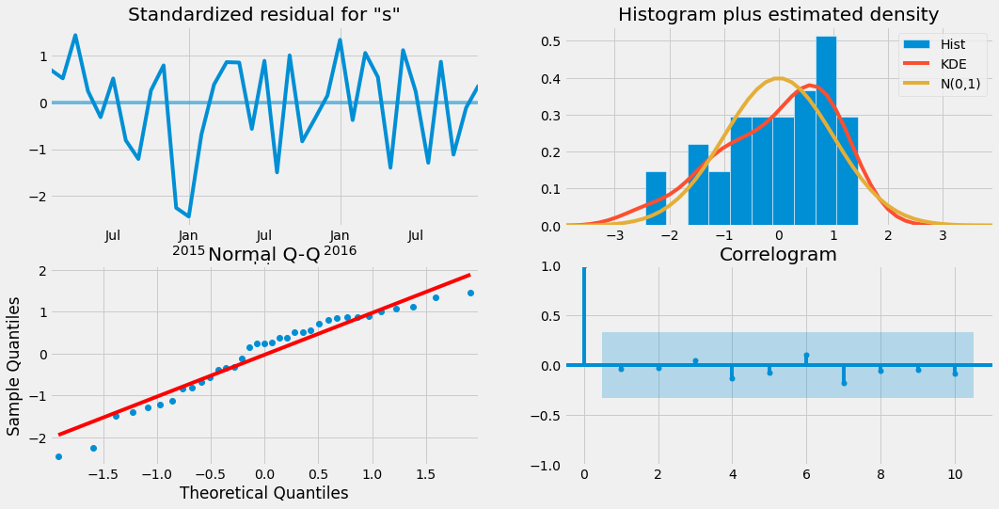

In [182]:
result_store3_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [183]:
#Now predict the values in the future
start = len(train_store3_m)
end = len(train_store3_m) + len(test_store3_m) - 1
prediction_store3_m = result_store3_m.predict(start,end).rename('SARIMA model predictions-Store3')
prediction_store3_m 

2017-01-01    2329.381692
2017-02-01    2547.403290
2017-03-01    3063.760522
2017-04-01    3618.178640
2017-05-01    3824.544307
2017-06-01    4050.246318
2017-07-01    4393.950657
2017-08-01    3783.600211
2017-09-01    3582.546996
2017-10-01    3321.729164
2017-11-01    3518.991331
2017-12-01    2559.700845
Freq: MS, Name: SARIMA model predictions-Store3, dtype: float64

Text(0.5, 1.0, 'Store 3 month supplies sales')

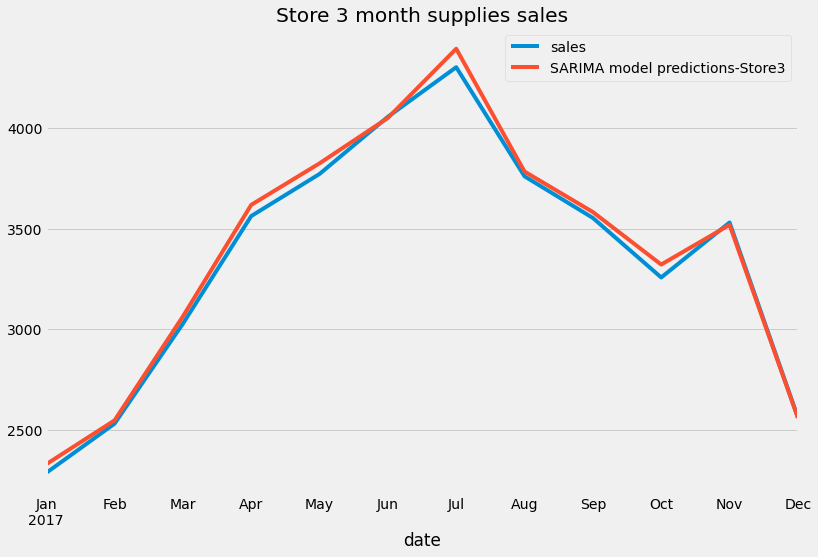

In [184]:
test_store3_m.plot(figsize=(12,8),legend=True)
prediction_store3_m.plot(legend=True)
plt.title("Store 3 month supplies sales")

### Model Evaluation scores Store 3

In [185]:
msc3=mean_squared_error(test_store3_m,prediction_store3_m)
msc3

1950.648070247494

In [186]:
r3=rmse(test_store3_m,prediction_store3_m)
r3

44.16614167263758

In [187]:
t3=test_store3_m.mean()
t3

3350.1655593958008

In [188]:
#Comparing the mean value to the root mean square value we can say that the model had predicted in a good way

In [189]:
#Now let us forecast into the unknown future
model_store3_m_final = SARIMAX(store3_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store3_m_final = model_store3_m_final.fit()
forecast_store3_m= result_store3_m_final.predict(len(store3_m),len(store3_m)+11,typ='levels').rename('SARIMA forecast')

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Text(0.5, 1.0, 'Store 3 Monthly supplies sales')

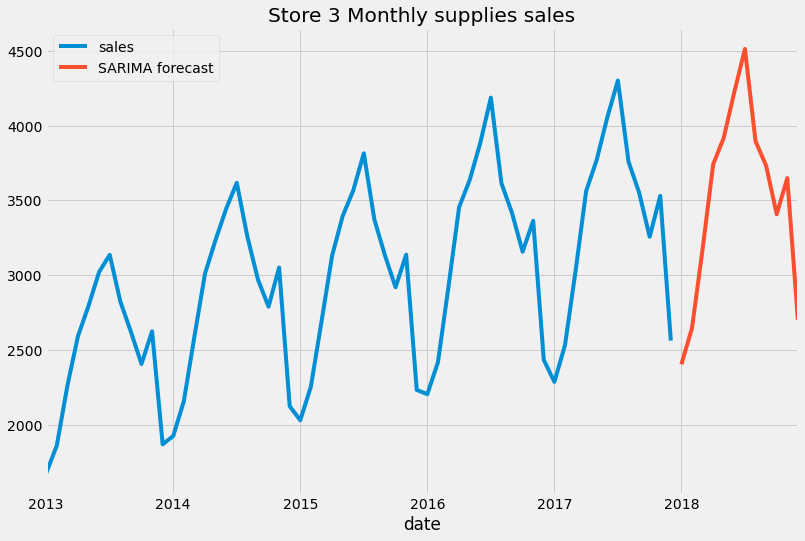

In [190]:
store3_m.plot(legend=True,figsize=(12,8))
forecast_store3_m.plot(legend=True)
plt.title("Store 3 Monthly supplies sales")

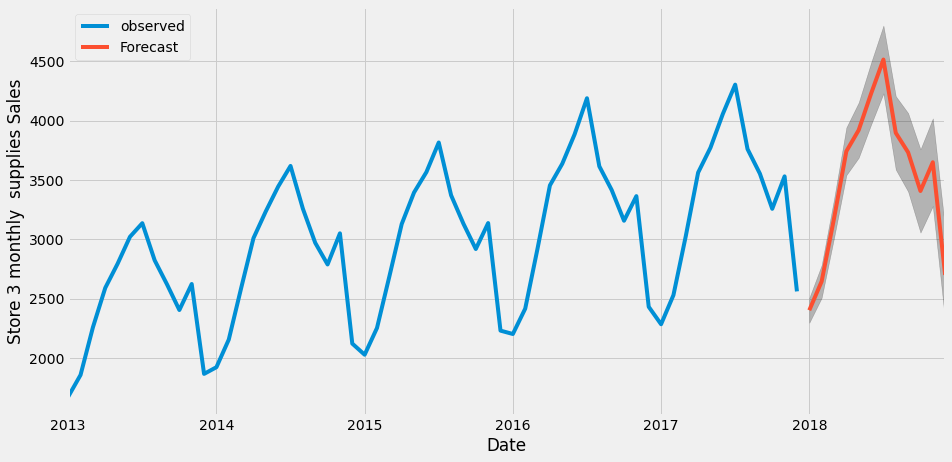

In [191]:
pred_store3_m = result_store3_m_final.get_forecast(steps=12)
pred_ci_store3_m = pred_store3_m.conf_int()
ax = store3_m.plot(label='observed',figsize=(14,7))
pred_store3_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store3_m.index,
               pred_ci_store3_m.iloc[:,0],
               pred_ci_store3_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 3 monthly  supplies Sales')
plt.legend()
plt.show()

## STORE 4

In [192]:
train_store4_m = store4_m.iloc[:48]
test_store4_m = store4_m.iloc[48:]
model_store4_m = auto_arima(store4_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=514.977, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=518.399, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=518.493, Time=0.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=516.724, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=516.826, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=516.679, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=516.648, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=518.629, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=516.853, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.568 seconds


In [193]:
model_store4_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -256.488
Date:                            Mon, 20 Feb 2023   AIC                            514.977
Time:                                    17:58:25   BIC                            516.827
Sample:                                01-01-2013   HQIC                           515.673
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3215.9302    508.348      6.326      0.000    2219.586    4212.275
===================================================================================
Ljung-Box (L1) (Q):                   0.35   Jarque-Bera (JB):                11.47
Prob(Q):                              0.55   Prob(JB):                         0.00
Heteroskedasticity (H):               0.62   Skew:                            -1.05
Prob(H) (two-sided):                  0.35   Kurtosis:                         4.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [194]:
model_store4_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [195]:
model_store4_m = SARIMAX(train_store4_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store4_m = model_store4_m.fit()
result_store4_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -191.008
Date:                            Mon, 20 Feb 2023   AIC                            396.017
Time:                                    17:58:26   BIC                            406.904
Sample:                                01-01-2013   HQIC                           399.775
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1379      0.239     -0.577      0.564      -0.606       0.330
ma.L2         -0.0088      0.243     -0.036      0.971      -0.485       0.467
ma.L3          0.2518      0.212      1.188      0.235      -0.163       0.667
ma.S.L12       0.1258      6.777      0.019      0.985     -13.157      13.408
ma.S.L24       0.5653     11.835      0.048      0.962     -22.630      23.761
ma.S.L36      -0.2404     14.664     -0.016      0.987     -28.981      28.500
sigma2      2414.3405   3.83e+04      0.063      0.950   -7.27e+04    7.75e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 7.55
Prob(Q):                              0.91   Prob(JB):                         0.02
Heteroskedasticity (H):               0.80   Skew:                            -0.99
Prob(H) (two-sided):                  0.71   Kurtosis:                         4.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

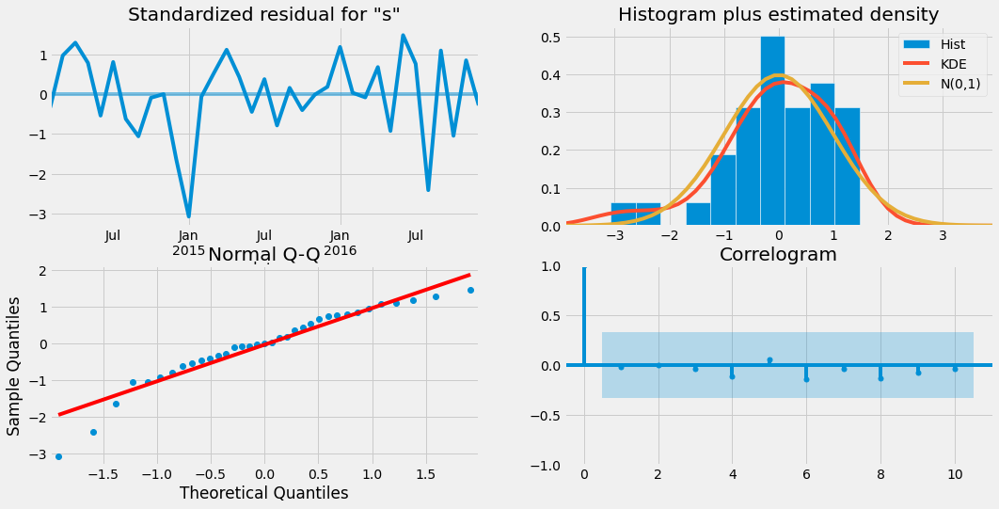

In [196]:
result_store4_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [197]:
#Now predict the values in the future
start = len(train_store4_m)
end = len(train_store4_m) + len(test_store4_m) - 1
prediction_store4_m = result_store4_m.predict(start,end).rename('SARIMA model predictions-Store 4')
prediction_store4_m 

2017-01-01    2155.732517
2017-02-01    2369.372106
2017-03-01    2789.502471
2017-04-01    3267.730564
2017-05-01    3470.108808
2017-06-01    3702.791520
2017-07-01    4000.515543
2017-08-01    3426.221100
2017-09-01    3277.346485
2017-10-01    3024.704246
2017-11-01    3239.042903
2017-12-01    2389.380629
Freq: MS, Name: SARIMA model predictions-Store 4, dtype: float64

Text(0.5, 1.0, 'Store 4 month supplies sales')

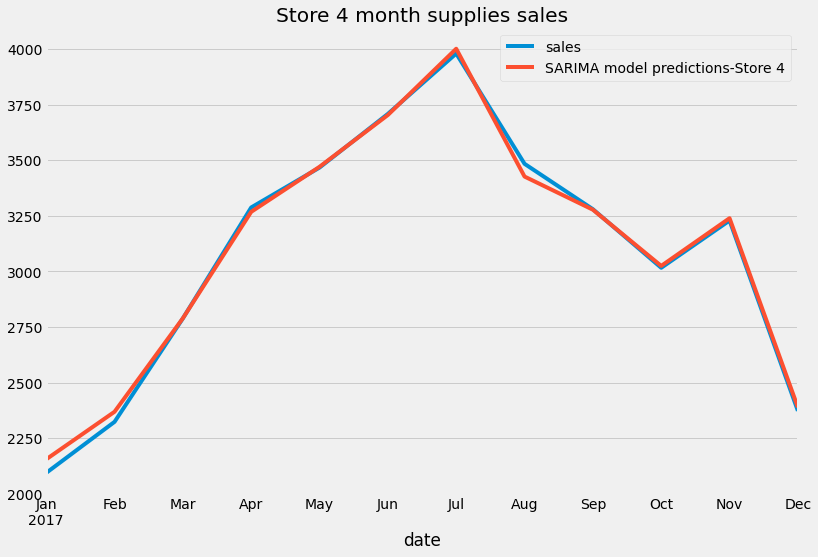

In [198]:
test_store4_m.plot(figsize=(12,8),legend=True)
prediction_store4_m.plot(legend=True)
plt.title("Store 4 month supplies sales")

## Model Evaluation scores Store 4

In [199]:
msc4=mean_squared_error(test_store4_m,prediction_store4_m)
msc4

865.6831005113837

In [200]:
r4=rmse(test_store4_m,prediction_store4_m)
r4

29.422493104959404

In [201]:
t4=test_store4_m.mean()
t4

3085.8208973374294

In [202]:
#Now let us forecast into the unknown future
model_store4_m_final = SARIMAX(store4_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store4_m_final = model_store4_m_final.fit()
forecast_store4_m= result_store4_m_final.predict(len(store4_m),len(store4_m)+11,typ='levels').rename('SARIMA forecast')

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Text(0.5, 1.0, 'Store 4 Monthly supplies sales')

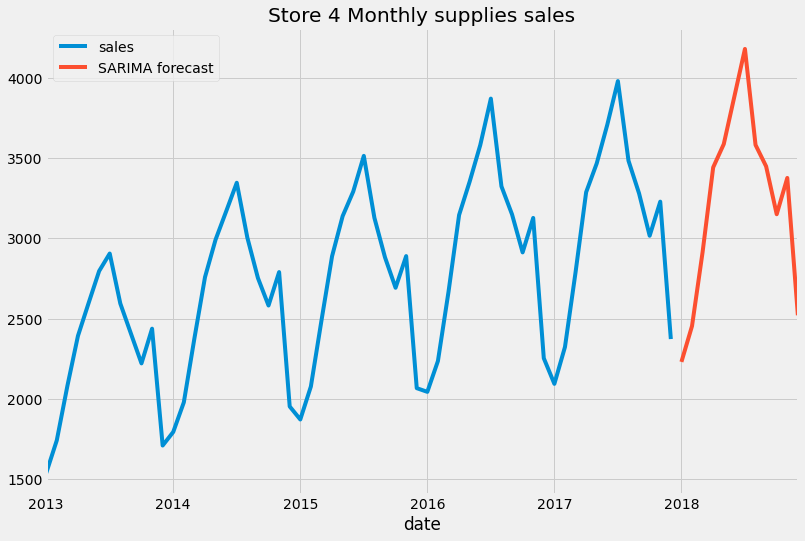

In [203]:
store4_m.plot(legend=True,figsize=(12,8))
forecast_store4_m.plot(legend=True)
plt.title("Store 4 Monthly supplies sales")

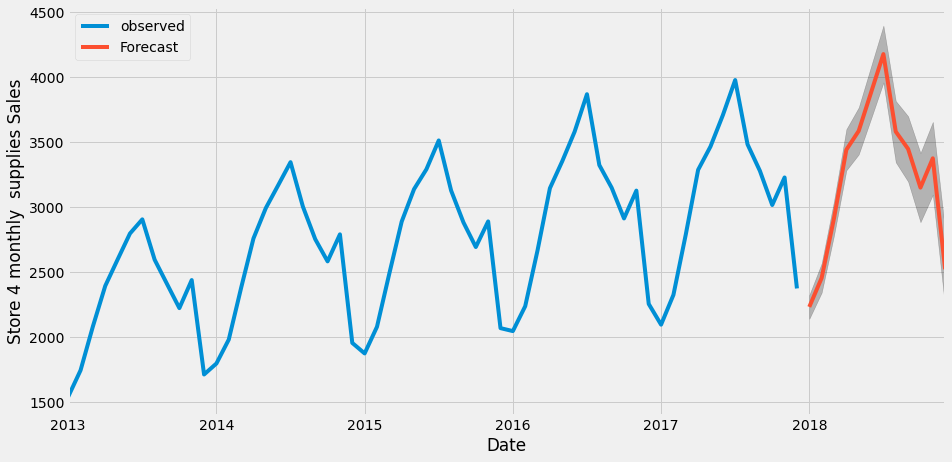

In [204]:
pred_store4_m = result_store4_m_final.get_forecast(steps=12)
pred_ci_store4_m = pred_store4_m.conf_int()
ax = store4_m.plot(label='observed',figsize=(14,7))
pred_store4_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store4_m.index,
               pred_ci_store4_m.iloc[:,0],
               pred_ci_store4_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 4 monthly  supplies Sales')
plt.legend()
plt.show()

## STORE 5

In [205]:
train_store5_m = store5_m.iloc[:48]
test_store5_m = store5_m.iloc[48:]
model_store5_m = auto_arima(store5_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=490.979, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=494.630, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=494.694, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=492.837, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=492.884, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=492.854, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=492.835, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=493.250, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=492.845, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.991 seconds


In [206]:
model_store5_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -244.489
Date:                            Mon, 20 Feb 2023   AIC                            490.979
Time:                                    17:58:36   BIC                            492.829
Sample:                                01-01-2013   HQIC                           491.675
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1930.1704    363.712      5.307      0.000    1217.309    2643.032
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                 4.50
Prob(Q):                              0.70   Prob(JB):                         0.11
Heteroskedasticity (H):               0.58   Skew:                            -0.75
Prob(H) (two-sided):                  0.29   Kurtosis:                         3.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [207]:
model_store5_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [208]:
model_store5_m = SARIMAX(train_store5_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store5_m = model_store5_m.fit()
result_store5_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -181.521
Date:                            Mon, 20 Feb 2023   AIC                            377.043
Time:                                    17:58:38   BIC                            387.930
Sample:                                01-01-2013   HQIC                           380.801
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1203      0.160     -0.753      0.452      -0.433       0.193
ma.L2         -0.0474      0.202     -0.235      0.814      -0.444       0.349
ma.L3          0.1682      0.215      0.784      0.433      -0.252       0.589
ma.S.L12      -0.1439     18.667     -0.008      0.994     -36.731      36.444
ma.S.L24       0.6600     30.428      0.022      0.983     -58.978      60.298
ma.S.L36       0.0840     39.829      0.002      0.998     -77.979      78.147
sigma2      1376.3552   4.91e+04      0.028      0.978   -9.49e+04    9.76e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 1.47
Prob(Q):                              0.98   Prob(JB):                         0.48
Heteroskedasticity (H):               0.45   Skew:                            -0.50
Prob(H) (two-sided):                  0.18   Kurtosis:                         2.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

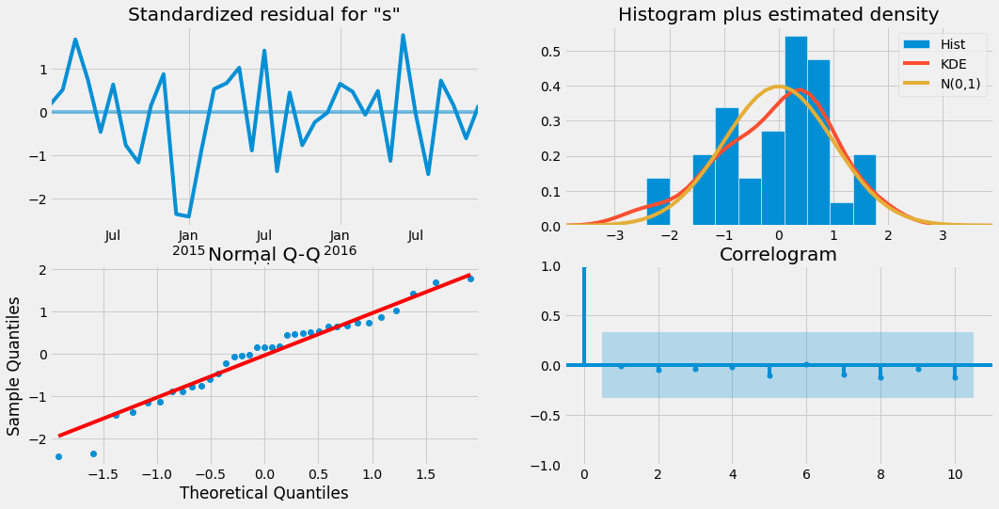

In [209]:
result_store5_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [210]:
#Now predict the values in the future
start = len(train_store5_m)
end = len(train_store5_m) + len(test_store5_m) - 1
prediction_store5_m = result_store5_m.predict(start,end).rename('SARIMA model predictions-Store 5')
prediction_store5_m 

2017-01-01    1573.251491
2017-02-01    1709.142821
2017-03-01    2030.379007
2017-04-01    2377.722471
2017-05-01    2554.571585
2017-06-01    2689.158228
2017-07-01    2913.923819
2017-08-01    2514.218769
2017-09-01    2375.494664
2017-10-01    2232.176729
2017-11-01    2366.000456
2017-12-01    1716.858237
Freq: MS, Name: SARIMA model predictions-Store 5, dtype: float64

Text(0.5, 1.0, 'Store 5 month supplies sales')

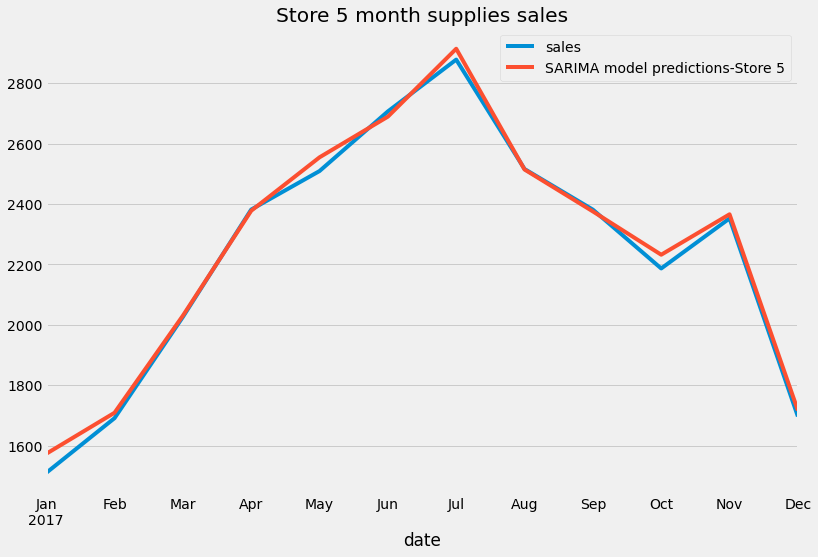

In [211]:
test_store5_m.plot(figsize=(12,8),legend=True)
prediction_store5_m.plot(legend=True)
plt.title("Store 5 month supplies sales")

## Model Evaluation scores Store 5

In [212]:
msc5=mean_squared_error(test_store5_m,prediction_store5_m)
msc5

890.7763785041074

In [213]:
r5=rmse(test_store5_m,prediction_store5_m)
r5

29.84587707714597

In [214]:
t5=test_store5_m.mean()
t5

2236.3349014336914

In [215]:
#Now let us forecast into the unknown future
model_store5_m_final = SARIMAX(store5_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12))
result_store5_m_final = model_store5_m_final.fit()
forecast_store5_m= result_store5_m_final.predict(len(store5_m),len(store5_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store 5 Monthly supplies sales')

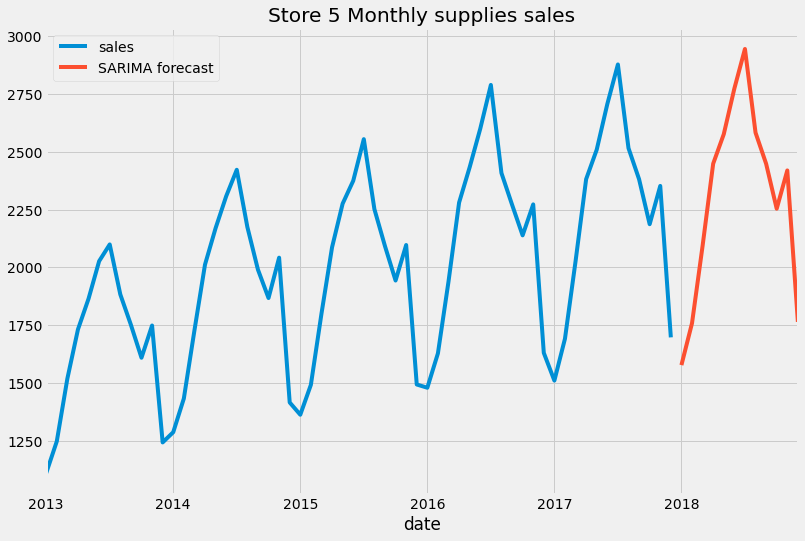

In [216]:
store5_m.plot(legend=True,figsize=(12,8))
forecast_store5_m.plot(legend=True)
plt.title("Store 5 Monthly supplies sales")

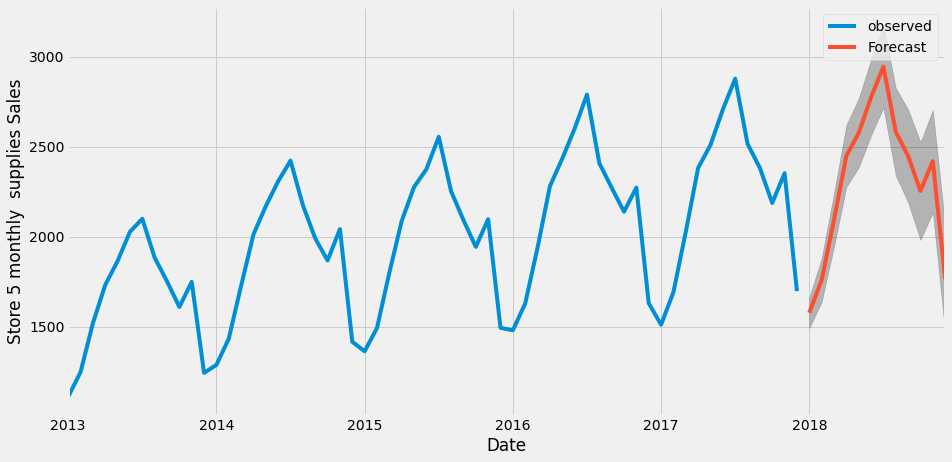

In [217]:
pred_store5_m = result_store5_m_final.get_forecast(steps=12)
pred_ci_store5_m = pred_store5_m.conf_int()
ax = store5_m.plot(label='observed',figsize=(14,7))
pred_store5_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store5_m.index,
               pred_ci_store5_m.iloc[:,0],
               pred_ci_store5_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 5 monthly  supplies Sales')
plt.legend()
plt.show()

# Store 6

In [218]:
train_store6_m = store6_m.iloc[:48]
test_store6_m = store6_m.iloc[48:]
model_store6_m = auto_arima(store6_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=491.040, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=493.595, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=493.602, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=493.006, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=493.016, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=491.626, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=491.626, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=493.590, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=492.923, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.824 seconds


In [219]:
model_store6_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -244.520
Date:                            Mon, 20 Feb 2023   AIC                            491.040
Time:                                    17:58:46   BIC                            492.890
Sample:                                01-01-2013   HQIC                           491.736
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1932.6907    342.946      5.636      0.000    1260.529    2604.852
===================================================================================
Ljung-Box (L1) (Q):                   1.50   Jarque-Bera (JB):                 3.48
Prob(Q):                              0.22   Prob(JB):                         0.18
Heteroskedasticity (H):               0.43   Skew:                            -0.60
Prob(H) (two-sided):                  0.10   Kurtosis:                         3.58
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [220]:
model_store6_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [221]:
model_store6_m = SARIMAX(train_store6_m,order=(1, 0, 3),seasonal_order=(1, 0, 3, 12))
result_store6_m = model_store6_m.fit()
result_store6_m.summary()

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(1, 0, 3)x(1, 0, 3, 12)   Log Likelihood                -289.293
Date:                            Mon, 20 Feb 2023   AIC                            596.586
Time:                                    17:58:49   BIC                            613.427
Sample:                                01-01-2013   HQIC                           602.950
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9471      0.049     19.183      0.000       0.850       1.044
ma.L1          0.5451      0.161      3.394      0.001       0.230       0.860
ma.L2          0.6013      0.133      4.505      0.000       0.340       0.863
ma.L3          0.6757      0.151      4.487      0.000       0.381       0.971
ar.S.L12       0.9334      0.103      9.075      0.000       0.732       1.135
ma.S.L12       0.4182      2.382      0.176      0.861      -4.251       5.087
ma.S.L24       0.4278      3.313      0.129      0.897      -6.065       6.920
ma.S.L36       0.7377     12.065      0.061      0.951     -22.910      24.385
sigma2      2864.6731   3.16e+04      0.091      0.928   -5.91e+04    6.49e+04
===================================================================================
Ljung-Box (L1) (Q):                   3.59   Jarque-Bera (JB):                 0.65
Prob(Q):                              0.06   Prob(JB):                         0.72
Heteroskedasticity (H):               1.22   Skew:                            -0.21
Prob(H) (two-sided):                  0.70   Kurtosis:                         3.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

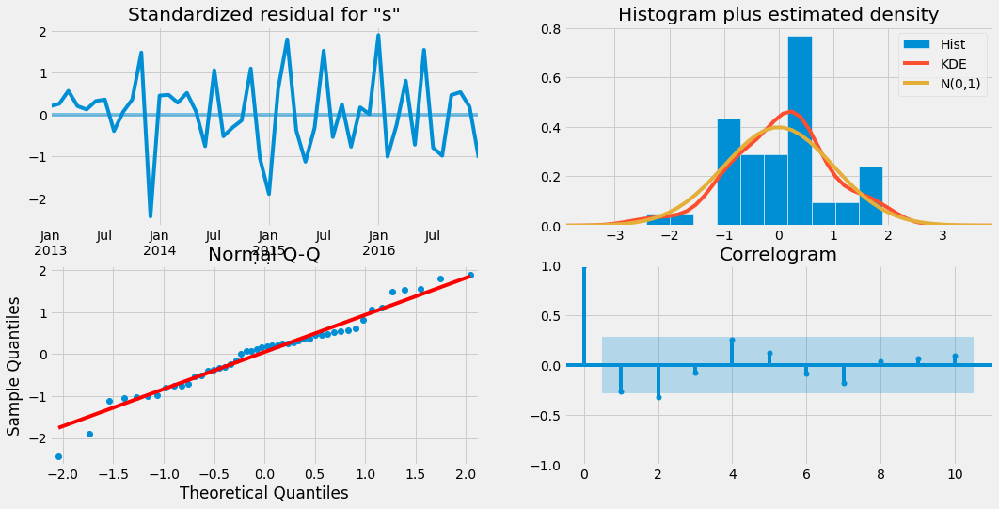

In [222]:
result_store6_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [223]:
#Now predict the values in the future
start = len(train_store6_m)
end = len(train_store6_m) + len(test_store6_m) - 1
prediction_store6_m = result_store6_m.predict(start,end).rename('SARIMA model predictions-Store 6')
prediction_store6_m 

2017-01-01    1586.544105
2017-02-01    1686.627506
2017-03-01    1978.595769
2017-04-01    2366.496145
2017-05-01    2468.661202
2017-06-01    2638.411081
2017-07-01    2858.543661
2017-08-01    2443.619990
2017-09-01    2321.983805
2017-10-01    2165.497439
2017-11-01    2279.925012
2017-12-01    1654.735629
Freq: MS, Name: SARIMA model predictions-Store 6, dtype: float64

Text(0.5, 1.0, 'Store 6 month supplies sales')

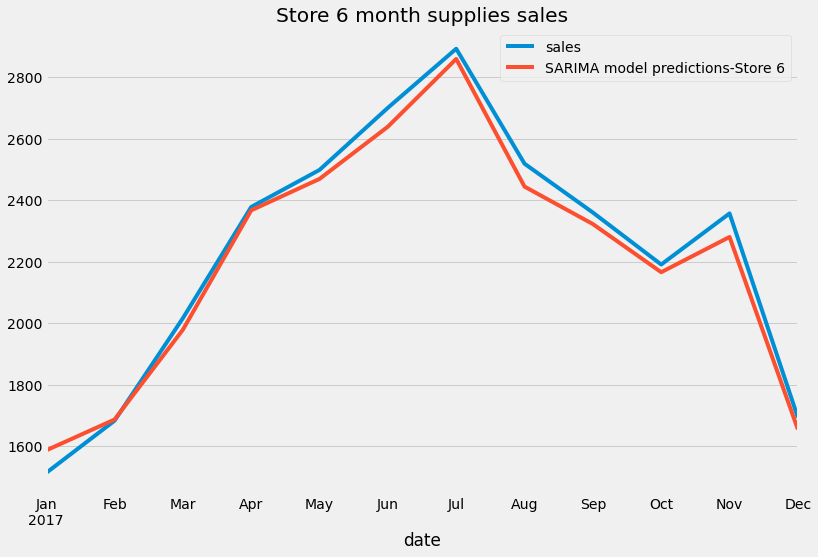

In [224]:
test_store6_m.plot(figsize=(12,8),legend=True)
prediction_store6_m.plot(legend=True)
plt.title("Store 6 month supplies sales")

### Model Evaluation scores Store 6

In [225]:
msc6=mean_squared_error(test_store6_m,prediction_store6_m)
msc6

2295.9334428070947

In [226]:
r6=rmse(test_store6_m,prediction_store6_m)
r6

47.91589968692119

In [227]:
t6=test_store6_m.mean()
t6

2233.0886712749616

In [228]:
#Now let us forecast into the unknown future
model_store6_m_final = SARIMAX(store6_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store6_m_final = model_store6_m_final.fit()
forecast_store6_m= result_store6_m_final.predict(len(store6_m),len(store3_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store 6 Monthly supplies sales')

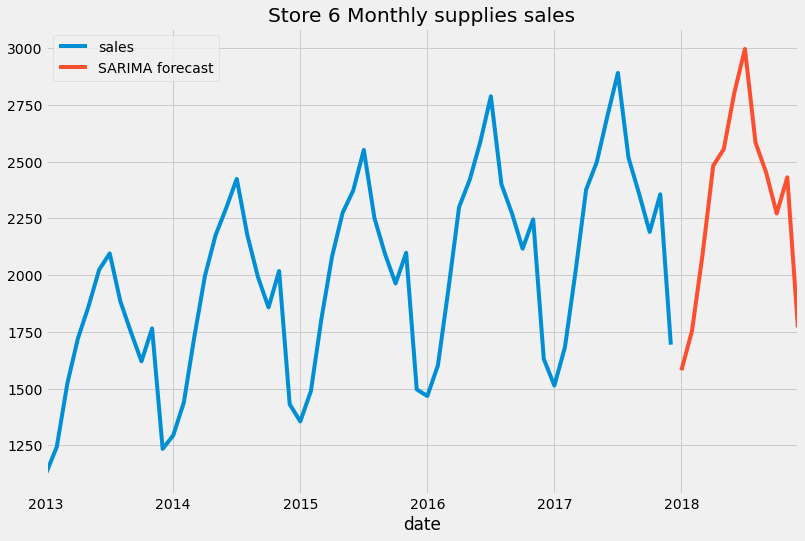

In [229]:
store6_m.plot(legend=True,figsize=(12,8))
forecast_store6_m.plot(legend=True)
plt.title("Store 6 Monthly supplies sales")

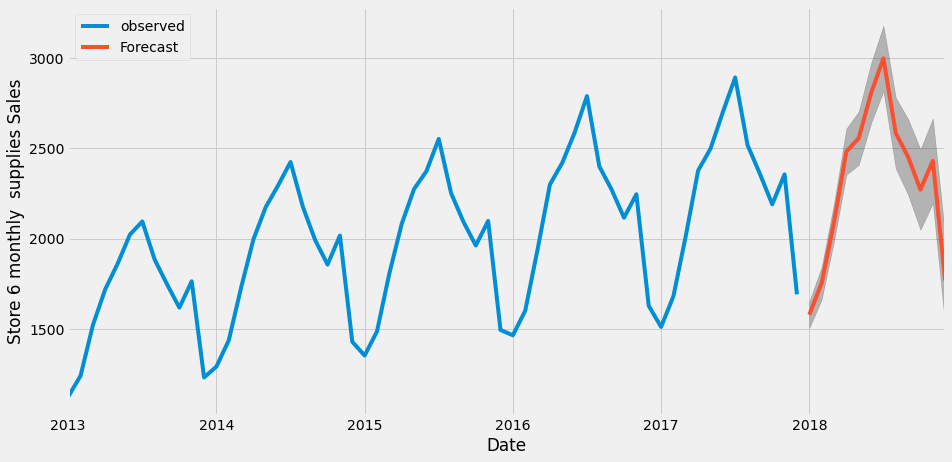

In [230]:
pred_store6_m = result_store6_m_final.get_forecast(steps=12)
pred_ci_store6_m = pred_store6_m.conf_int()
ax = store6_m.plot(label='observed',figsize=(14,7))
pred_store6_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store6_m.index,
               pred_ci_store6_m.iloc[:,0],
               pred_ci_store6_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 6 monthly  supplies Sales')
plt.legend()
plt.show()

## STORE 7

In [231]:
train_store7_m = store7_m.iloc[:48]
test_store7_m = store7_m.iloc[48:]
model_store7_m = auto_arima(store7_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=482.062, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=485.101, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=485.133, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=484.049, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=484.053, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=483.119, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=483.142, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=485.119, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=483.917, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.888 seconds


In [232]:
model_store7_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -240.031
Date:                            Mon, 20 Feb 2023   AIC                            482.062
Time:                                    17:58:58   BIC                            483.912
Sample:                                01-01-2013   HQIC                           482.758
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1597.5099    276.808      5.771      0.000    1054.976    2140.044
===================================================================================
Ljung-Box (L1) (Q):                   1.06   Jarque-Bera (JB):                 8.91
Prob(Q):                              0.30   Prob(JB):                         0.01
Heteroskedasticity (H):               0.67   Skew:                            -1.02
Prob(H) (two-sided):                  0.44   Kurtosis:                         3.61
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [233]:
model_store7_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [234]:
model_store7_m = SARIMAX(train_store7_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store7_m = model_store7_m.fit()
result_store7_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -178.510
Date:                            Mon, 20 Feb 2023   AIC                            371.019
Time:                                    17:58:59   BIC                            381.907
Sample:                                01-01-2013   HQIC                           374.778
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0649      0.217     -0.300      0.764      -0.489       0.360
ma.L2         -0.0567      0.350     -0.162      0.871      -0.743       0.630
ma.L3          0.1078      0.291      0.370      0.711      -0.462       0.678
ma.S.L12       0.3686     91.746      0.004      0.997    -179.451     180.188
ma.S.L24       0.4028    134.411      0.003      0.998    -263.037     263.843
ma.S.L36      -0.4780    126.432     -0.004      0.997    -248.280     247.324
sigma2      1067.7837   2.08e+05      0.005      0.996   -4.06e+05    4.08e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 4.68
Prob(Q):                              1.00   Prob(JB):                         0.10
Heteroskedasticity (H):               0.63   Skew:                            -0.83
Prob(H) (two-sided):                  0.44   Kurtosis:                         3.69
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

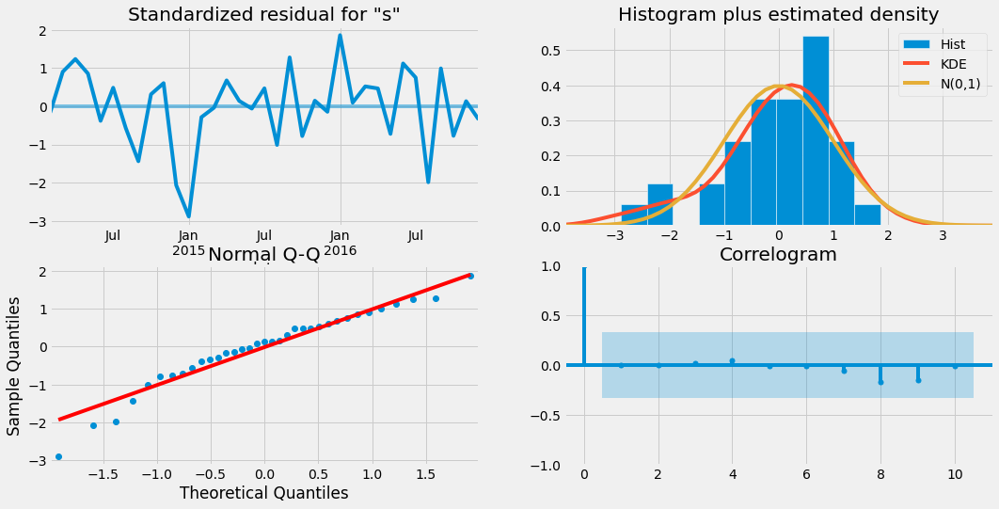

In [235]:
result_store7_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [236]:
#Now predict the values in the future
start = len(train_store7_m)
end = len(train_store7_m) + len(test_store7_m) - 1
prediction_store7_m = result_store7_m.predict(start,end).rename('SARIMA model predictions-Store7')
prediction_store7_m 

2017-01-01    1472.287907
2017-02-01    1597.663106
2017-03-01    1891.337465
2017-04-01    2190.631175
2017-05-01    2310.354175
2017-06-01    2482.970649
2017-07-01    2651.835679
2017-08-01    2272.161902
2017-09-01    2217.164863
2017-10-01    2045.094184
2017-11-01    2185.298210
2017-12-01    1615.314674
Freq: MS, Name: SARIMA model predictions-Store7, dtype: float64

Text(0.5, 1.0, 'Store 7 month supplies sales')

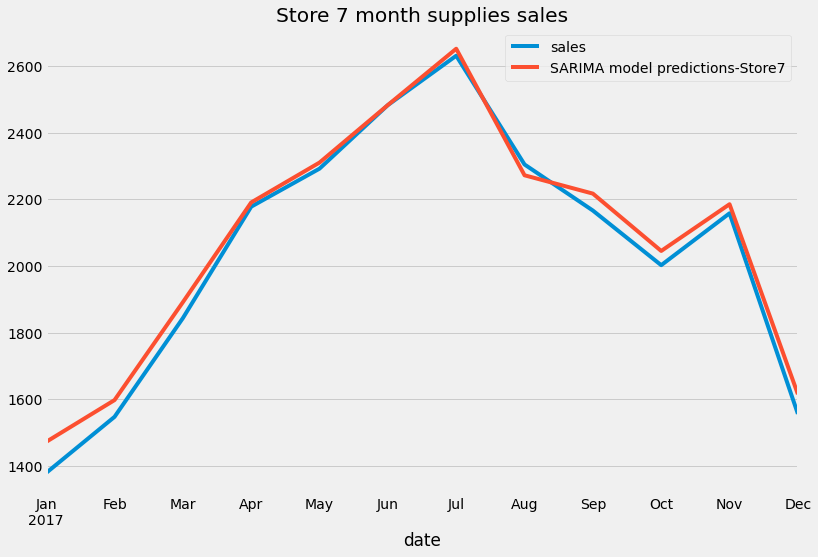

In [237]:
test_store7_m.plot(figsize=(12,8),legend=True)
prediction_store7_m.plot(legend=True)
plt.title("Store 7 month supplies sales")

### Model Evaluation scores Store 7

In [238]:
msc7=mean_squared_error(test_store7_m,prediction_store7_m)
msc7

2008.3260869452815

In [239]:
r7=rmse(test_store7_m,prediction_store7_m)
r7

44.81435135026816

In [240]:
t7=test_store7_m.mean()
t7

2045.1242959549409

In [241]:
#Now let us forecast into the unknown future
model_store7_m_final = SARIMAX(store7_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store7_m_final = model_store7_m_final.fit()
forecast_store7_m= result_store7_m_final.predict(len(store7_m),len(store7_m)+11,typ='levels').rename('SARIMA forecast')

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Text(0.5, 1.0, 'Store 7 Monthly supplies sales')

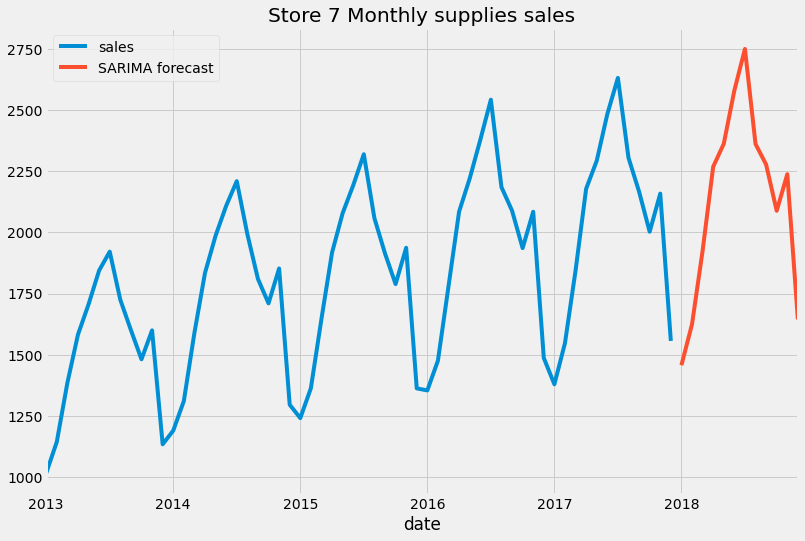

In [242]:
store7_m.plot(legend=True,figsize=(12,8))
forecast_store7_m.plot(legend=True)
plt.title("Store 7 Monthly supplies sales")

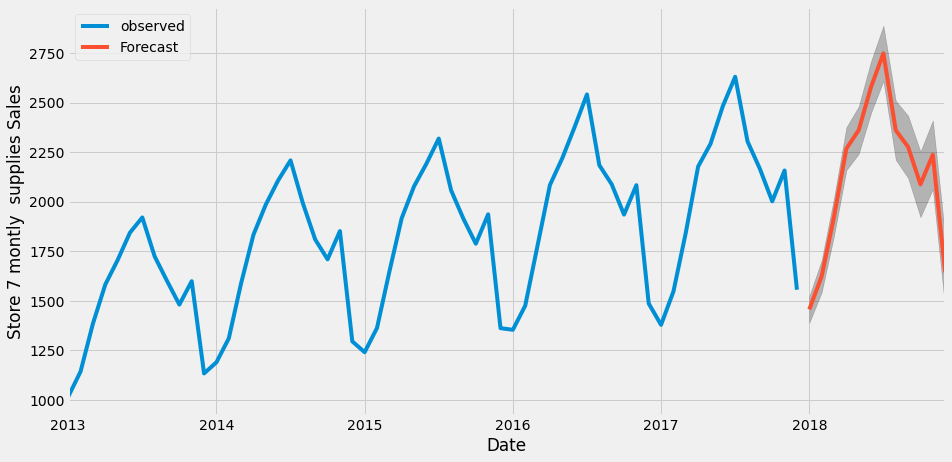

In [243]:
pred_store7_m = result_store7_m_final.get_forecast(steps=12)
pred_ci_store7_m = pred_store7_m.conf_int()
ax = store7_m.plot(label='observed',figsize=(14,7))
pred_store7_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store7_m.index,
               pred_ci_store7_m.iloc[:,0],
               pred_ci_store7_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 7 montly  supplies Sales')
plt.legend()
plt.show()

## STORE 8

In [244]:
train_store8_m = store8_m.iloc[:48]
test_store8_m = store8_m.iloc[48:]
model_store8_m = auto_arima(store8_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=538.139, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=540.204, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=540.395, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=539.667, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=539.830, Time=0.30 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=538.666, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=538.655, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=540.634, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=540.045, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.973 seconds


In [245]:
model_store8_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -268.070
Date:                            Mon, 20 Feb 2023   AIC                            538.139
Time:                                    17:59:10   BIC                            539.990
Sample:                                01-01-2013   HQIC                           538.836
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5263.8756    966.071      5.449      0.000    3370.410    7157.341
===================================================================================
Ljung-Box (L1) (Q):                   1.57   Jarque-Bera (JB):                 4.74
Prob(Q):                              0.21   Prob(JB):                         0.09
Heteroskedasticity (H):               0.74   Skew:                            -0.75
Prob(H) (two-sided):                  0.56   Kurtosis:                         3.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [246]:
model_store8_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [247]:
model_store8_m = SARIMAX(train_store8_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store8_m = model_store8_m.fit()
result_store8_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -195.934
Date:                            Mon, 20 Feb 2023   AIC                            405.868
Time:                                    17:59:11   BIC                            416.755
Sample:                                01-01-2013   HQIC                           409.626
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0096      0.159      0.060      0.952      -0.301       0.320
ma.L2         -0.1982      0.189     -1.049      0.294      -0.569       0.172
ma.L3          0.2836      0.222      1.277      0.202      -0.152       0.719
ma.S.L12       0.1465      9.139      0.016      0.987     -17.766      18.059
ma.S.L24       0.6242     18.589      0.034      0.973     -35.809      37.058
ma.S.L36      -0.2207     17.956     -0.012      0.990     -35.414      34.973
sigma2      3063.7556   7.07e+04      0.043      0.965   -1.35e+05    1.42e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.87
Prob(Q):                              1.00   Prob(JB):                         0.65
Heteroskedasticity (H):               0.57   Skew:                            -0.36
Prob(H) (two-sided):                  0.34   Kurtosis:                         2.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

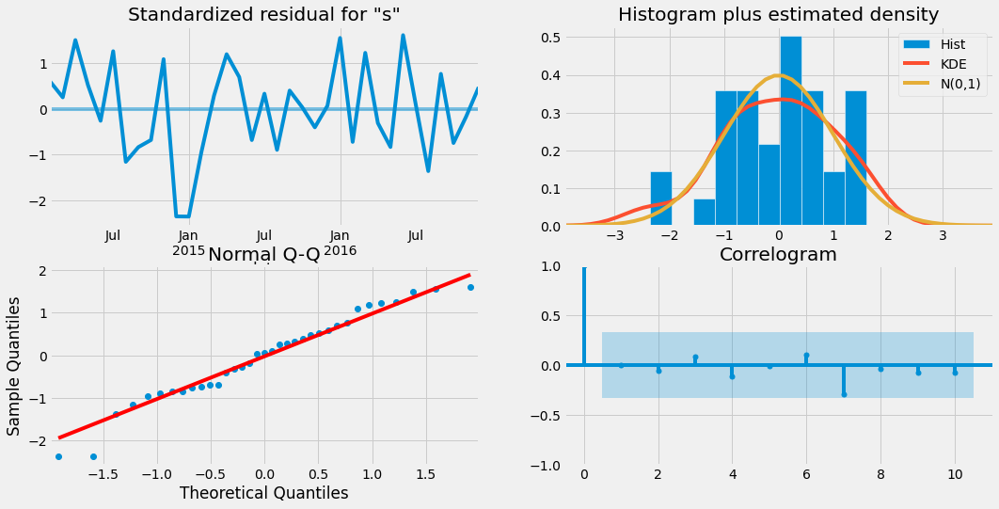

In [248]:
result_store8_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [249]:
#Now predict the values in the future
start = len(train_store8_m)
end = len(train_store8_m) + len(test_store8_m) - 1
prediction_store8_m = result_store8_m.predict(start,end).rename('SARIMA model predictions-Store 8')
prediction_store8_m 

2017-01-01    2546.421309
2017-02-01    2721.444974
2017-03-01    3263.806404
2017-04-01    3812.715995
2017-05-01    4055.295750
2017-06-01    4308.906631
2017-07-01    4641.400315
2017-08-01    4014.006259
2017-09-01    3795.388720
2017-10-01    3567.452185
2017-11-01    3750.160483
2017-12-01    2778.768914
Freq: MS, Name: SARIMA model predictions-Store 8, dtype: float64

Text(0.5, 1.0, 'Store 8 month supplies sales')

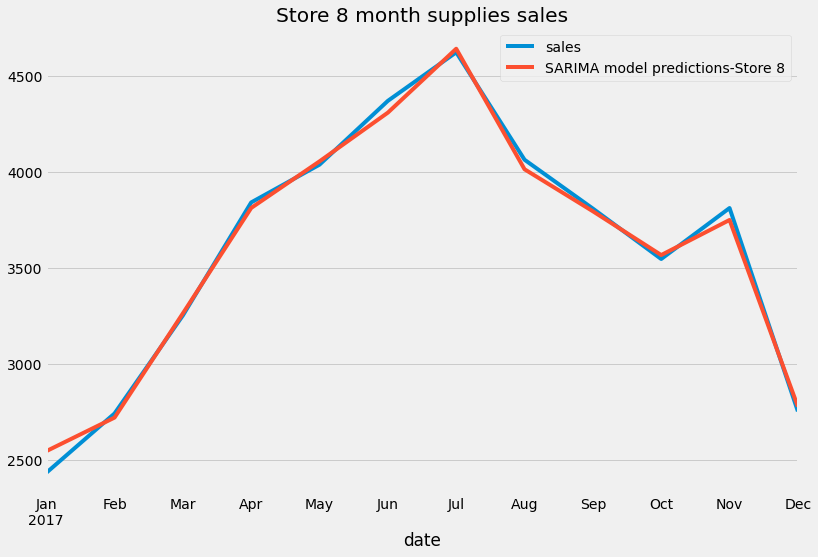

In [250]:
test_store8_m.plot(figsize=(12,8),legend=True)
prediction_store8_m.plot(legend=True)
plt.title("Store 8 month supplies sales")

### Model Evaluation scores Store 8

In [251]:
msc8=mean_squared_error(test_store8_m,prediction_store8_m)
msc8


2172.769292360029

In [252]:
r8=rmse(test_store8_m,prediction_store8_m)
r8

46.61297343401329

In [253]:
t8=test_store8_m.mean()
t8

3607.3589157706097

In [254]:
#Now let us forecast into the unknown future
model_store8_m_final = SARIMAX(store8_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store8_m_final = model_store8_m_final.fit()
forecast_store8_m= result_store8_m_final.predict(len(store8_m),len(store8_m)+11,typ='levels').rename('SARIMA forecast')

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Text(0.5, 1.0, 'Store 8 Monthly supplies sales')

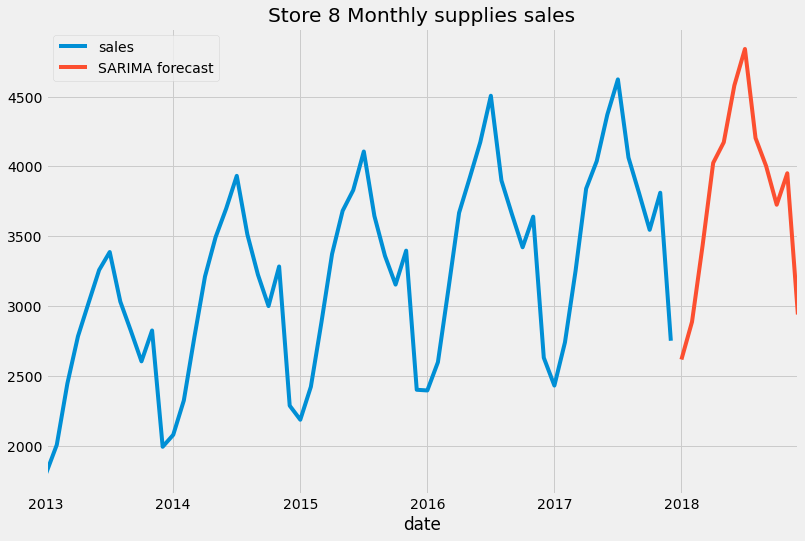

In [255]:
store8_m.plot(legend=True,figsize=(12,8))
forecast_store8_m.plot(legend=True)
plt.title("Store 8 Monthly supplies sales")

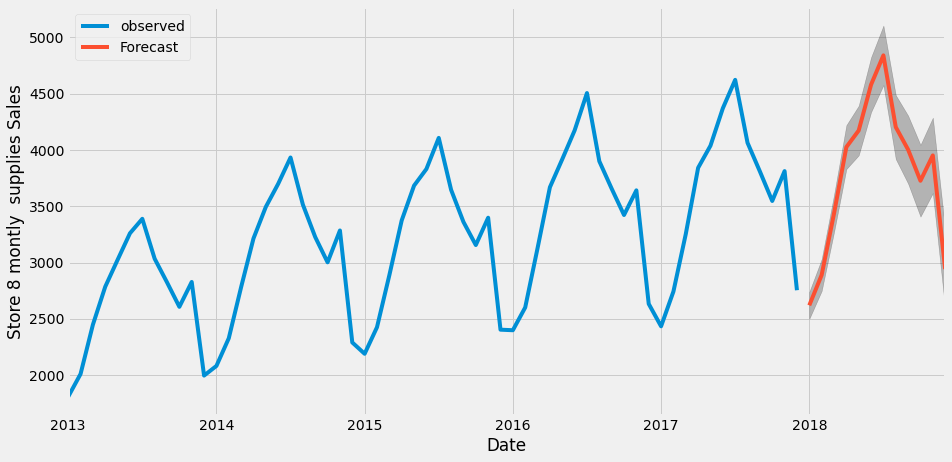

In [256]:
pred_store8_m = result_store8_m_final.get_forecast(steps=12)
pred_ci_store8_m = pred_store8_m.conf_int()
ax = store8_m.plot(label='observed',figsize=(14,7))
pred_store8_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store8_m.index,
               pred_ci_store8_m.iloc[:,0],
               pred_ci_store8_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 8 montly  supplies Sales')
plt.legend()
plt.show()

## STORE 9

In [257]:
train_store9_m = store9_m.iloc[:48]
test_store9_m = store9_m.iloc[48:]
model_store9_m = auto_arima(store9_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=514.098, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=517.910, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=517.883, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=516.081, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=516.083, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=515.920, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=515.890, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=517.865, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=515.985, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.855 seconds


In [258]:
model_store9_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -256.049
Date:                            Mon, 20 Feb 2023   AIC                            514.098
Time:                                    17:59:21   BIC                            515.948
Sample:                                01-01-2013   HQIC                           514.795
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3156.3980    613.277      5.147      0.000    1954.397    4358.399
===================================================================================
Ljung-Box (L1) (Q):                   0.21   Jarque-Bera (JB):                 2.82
Prob(Q):                              0.65   Prob(JB):                         0.24
Heteroskedasticity (H):               0.40   Skew:                            -0.60
Prob(H) (two-sided):                  0.08   Kurtosis:                         3.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [259]:
model_store9_m

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [260]:
model_store9_m = SARIMAX(train_store9_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store9_m = model_store9_m.fit()
result_store9_m.summary()

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -190.642
Date:                            Mon, 20 Feb 2023   AIC                            395.283
Time:                                    17:59:24   BIC                            406.171
Sample:                                01-01-2013   HQIC                           399.042
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0265      0.166     -0.160      0.873      -0.351       0.298
ma.L2         -0.2152      0.180     -1.197      0.231      -0.568       0.137
ma.L3          0.3451      0.185      1.866      0.062      -0.017       0.708
ma.S.L12      -0.0337    112.003     -0.000      1.000    -219.555     219.487
ma.S.L24       0.7746    398.084      0.002      0.998    -779.457     781.006
ma.S.L36       0.4240    212.809      0.002      0.998    -416.674     417.522
sigma2      1881.7116    8.5e+05      0.002      0.998   -1.66e+06    1.67e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.82
Prob(Q):                              1.00   Prob(JB):                         0.66
Heteroskedasticity (H):               0.75   Skew:                            -0.25
Prob(H) (two-sided):                  0.62   Kurtosis:                         2.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

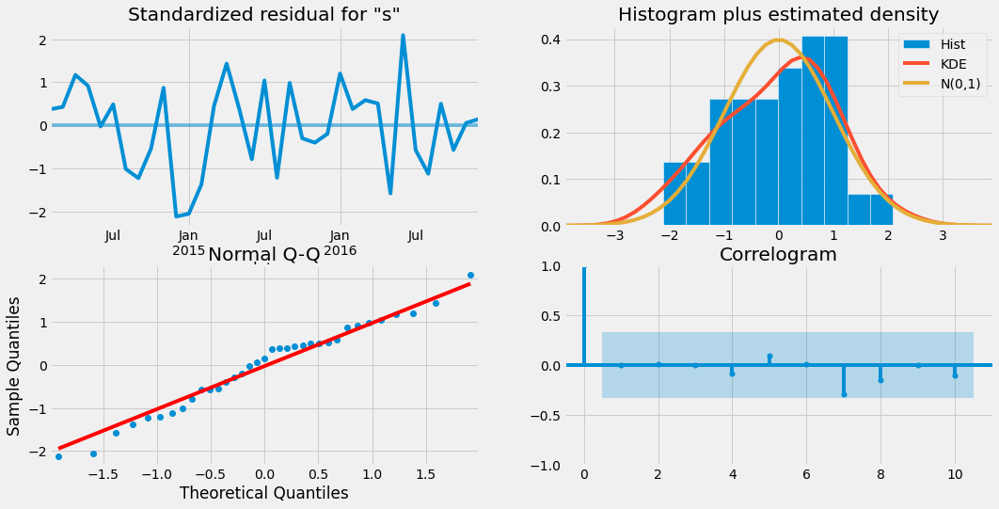

In [261]:
result_store9_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [262]:
#Now predict the values in the future
start = len(train_store9_m)
end = len(train_store9_m) + len(test_store9_m) - 1
prediction_store9_m = result_store9_m.predict(start,end).rename('SARIMA model predictions-Store 9')
prediction_store9_m 

2017-01-01    2146.316127
2017-02-01    2341.592997
2017-03-01    2798.134345
2017-04-01    3337.770465
2017-05-01    3522.336172
2017-06-01    3743.441597
2017-07-01    4064.015471
2017-08-01    3489.430767
2017-09-01    3296.186972
2017-10-01    3081.657241
2017-11-01    3269.319902
2017-12-01    2352.960856
Freq: MS, Name: SARIMA model predictions-Store 9, dtype: float64

Text(0.5, 1.0, 'Store 9 month supplies sales')

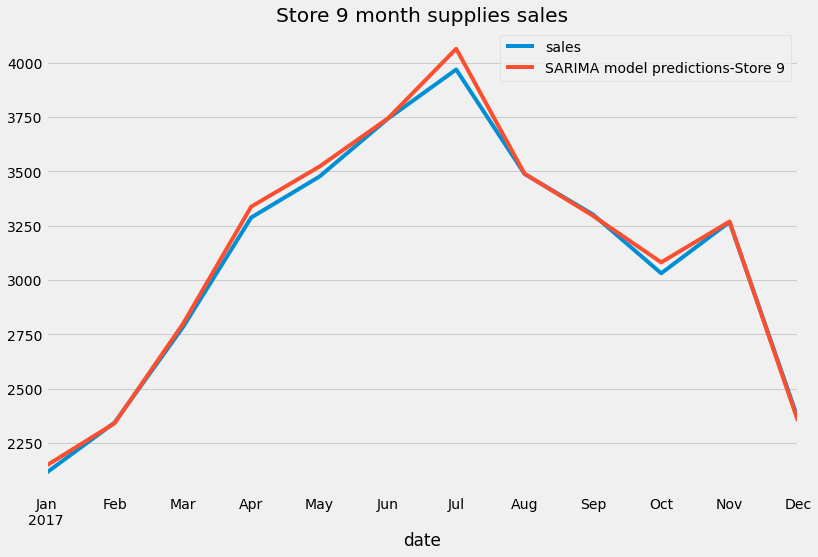

In [263]:
test_store9_m.plot(figsize=(12,8),legend=True)
prediction_store9_m.plot(legend=True)
plt.title("Store 9 month supplies sales")

### Model Evaluation scores Store 9

In [264]:
msc9=mean_squared_error(test_store9_m,prediction_store9_m)
msc9

1481.2365396456996

In [265]:
r9=rmse(test_store9_m,prediction_store9_m)
r9

38.48683592666068

In [266]:
t9=test_store9_m.mean()
t9

3097.281746031746

In [267]:
#Now let us forecast into the unknown future
model_store9_m_final = SARIMAX(store9_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store9_m_final = model_store9_m_final.fit()
forecast_store9_m= result_store9_m_final.predict(len(store9_m),len(store9_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store 9 Monthly supplies sales')

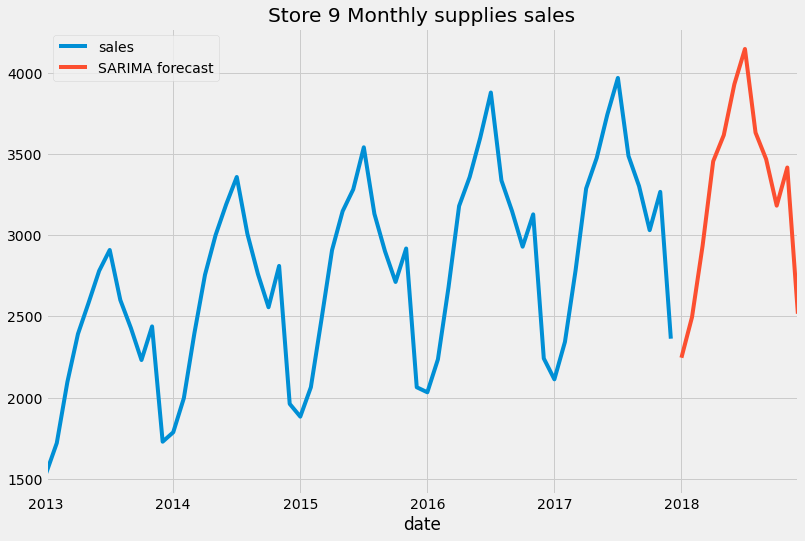

In [268]:
store9_m.plot(legend=True,figsize=(12,8))
forecast_store9_m.plot(legend=True)
plt.title("Store 9 Monthly supplies sales")

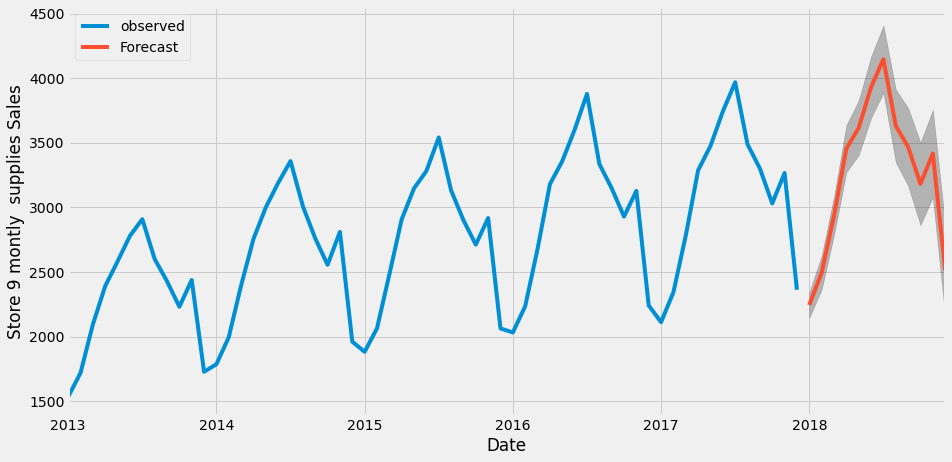

In [269]:
pred_store9_m = result_store9_m_final.get_forecast(steps=12)
pred_ci_store9_m = pred_store9_m.conf_int()
ax = store9_m.plot(label='observed',figsize=(14,7))
pred_store9_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store9_m.index,
               pred_ci_store9_m.iloc[:,0],
               pred_ci_store9_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 9 montly  supplies Sales')
plt.legend()
plt.show()

## STORE 10

In [270]:
train_store10_m = store10_m.iloc[:48]
test_store10_m = store10_m.iloc[48:]
model_store10_m = auto_arima(store10_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=531.800, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=532.331, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=533.006, Time=0.24 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=531.354, Time=0.16 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=531.088, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=533.085, Time=1.32 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=529.441, Time=0.52 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=531.423, Time=1.16 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=530.316, Time=0.80 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=531.026, Time=0.71 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=529.209, Time=0.49 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=53

In [271]:
model_store10_m.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   60
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 12)   Log Likelihood                -260.605
Date:                             Mon, 20 Feb 2023   AIC                            529.209
Time:                                     17:59:43   BIC                            536.610
Sample:                                 01-01-2013   HQIC                           531.994
                                      - 12-01-2017                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3079      0.133     -2.309      0.021      -0.569      -0.047
ar.S.L12      -0.1159      0.129     -0.896      0.370      -0.369       0.138
ar.S.L24       0.4948      0.183      2.705      0.007       0.136       0.853
sigma2      3256.6905    854.089      3.813      0.000    1582.708    4930.673
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                 4.73
Prob(Q):                              0.74   Prob(JB):                         0.09
Heteroskedasticity (H):               0.47   Skew:                            -0.77
Prob(H) (two-sided):                  0.14   Kurtosis:                         3.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [272]:
model_store10_m

ARIMA(order=(0, 1, 1), scoring_args={}, seasonal_order=(2, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [273]:
model_store10_m = SARIMAX(train_store10_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store10_m = model_store10_m.fit()
result_store10_m.summary()

C:\Users\HP\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 3)x(0, 1, 3, 12)   Log Likelihood                -193.167
Date:                            Mon, 20 Feb 2023   AIC                            400.334
Time:                                    17:59:46   BIC                            411.221
Sample:                                01-01-2013   HQIC                           404.092
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0540      0.154     -0.352      0.725      -0.355       0.247
ma.L2         -0.1360      0.188     -0.725      0.469      -0.504       0.232
ma.L3          0.3598      0.199      1.804      0.071      -0.031       0.751
ma.S.L12      -0.1597     22.263     -0.007      0.994     -43.794      43.475
ma.S.L24       1.0002    316.699      0.003      0.997    -619.718     621.718
ma.S.L36      -0.0733      9.261     -0.008      0.994     -18.224      18.078
sigma2      1956.5000   6.18e+05      0.003      0.997   -1.21e+06    1.21e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 1.33
Prob(Q):                              0.78   Prob(JB):                         0.51
Heteroskedasticity (H):               0.82   Skew:                            -0.30
Prob(H) (two-sided):                  0.74   Kurtosis:                         2.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

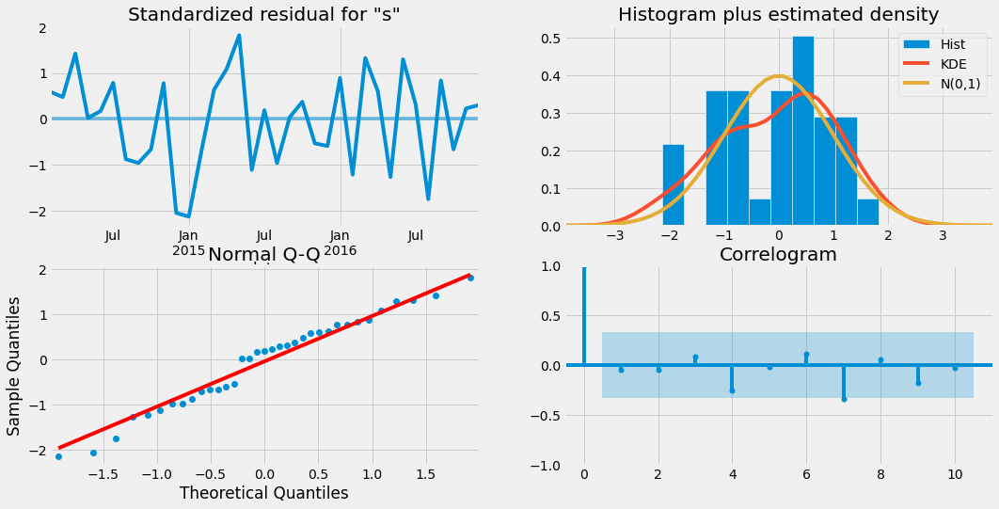

In [274]:
result_store10_m.plot_diagnostics(figsize=(16,8))
plt.show()

In [275]:
#Now predict the values in the future
start = len(train_store10_m)
end = len(train_store10_m) + len(test_store10_m) - 1
prediction_store10_m = result_store10_m.predict(start,end).rename('SARIMA model predictions-Store 10')
prediction_store10_m 

2017-01-01    2301.743081
2017-02-01    2486.179006
2017-03-01    2989.228751
2017-04-01    3500.929991
2017-05-01    3766.926901
2017-06-01    3956.600361
2017-07-01    4260.029897
2017-08-01    3721.604057
2017-09-01    3475.829448
2017-10-01    3298.090282
2017-11-01    3467.473148
2017-12-01    2510.619808
Freq: MS, Name: SARIMA model predictions-Store 10, dtype: float64

Text(0.5, 1.0, 'Store 10 month supplies sales')

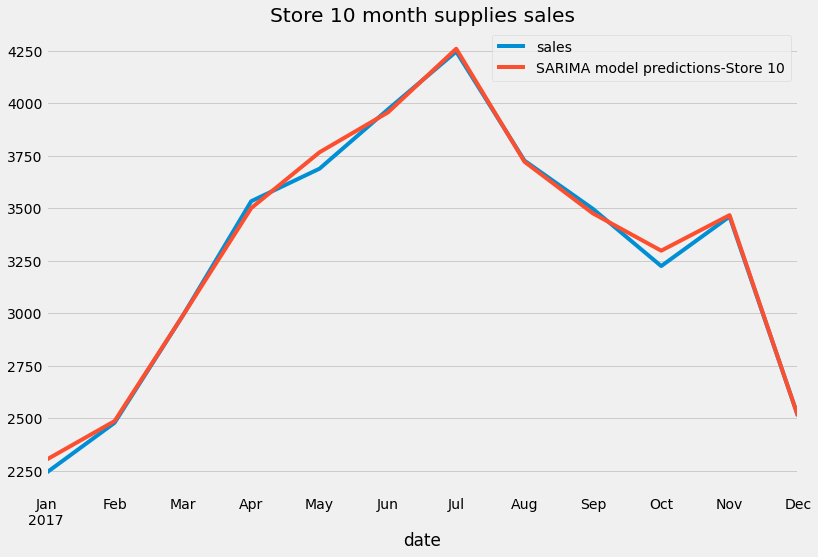

In [276]:
test_store10_m.plot(figsize=(12,8),legend=True)
prediction_store10_m.plot(legend=True)
plt.title("Store 10 month supplies sales")

### Model Evaluation scores Store 10

In [277]:
msc10=mean_squared_error(test_store10_m,prediction_store10_m)
msc10

1451.372917923665

In [278]:
r10=rmse(test_store10_m,prediction_store10_m)
r10

38.09688855961422

In [279]:
t10=test_store10_m.mean()
t10

3297.2601830517156

In [280]:
#Now let us forecast into the unknown future
model_store10_m_final = SARIMAX(store10_m,order=(0, 1, 3),seasonal_order=(0, 1, 3, 12))
result_store10_m_final = model_store10_m_final.fit()
forecast_store10_m= result_store10_m_final.predict(len(store10_m),len(store10_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store 10 Monthly supplies sales')

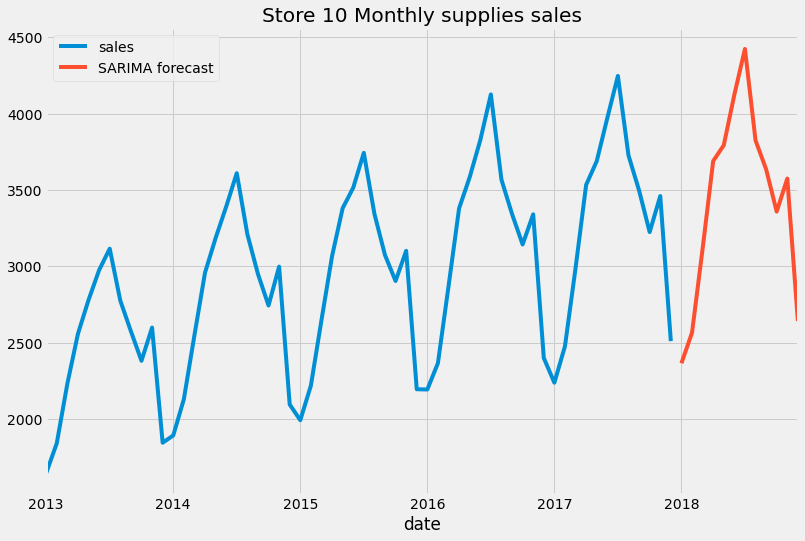

In [281]:
store10_m.plot(legend=True,figsize=(12,8))
forecast_store10_m.plot(legend=True)
plt.title("Store 10 Monthly supplies sales")

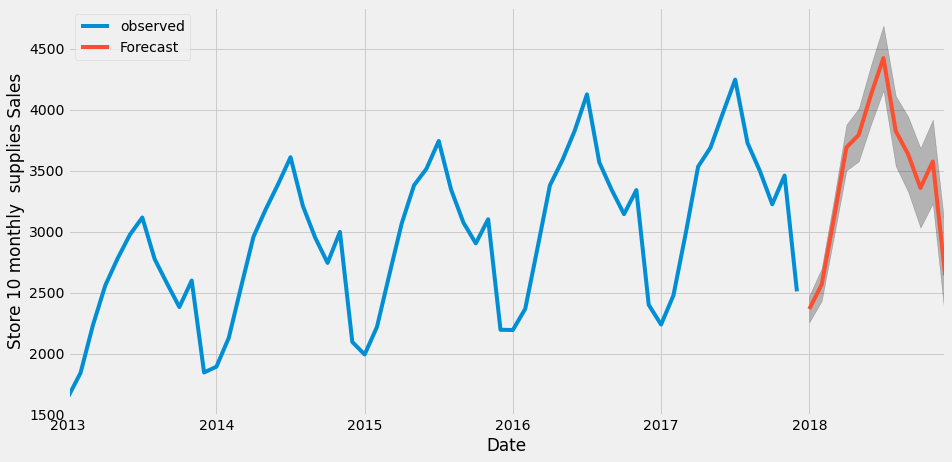

In [282]:
pred_store10_m = result_store10_m_final.get_forecast(steps=12)
pred_ci_store10_m = pred_store10_m.conf_int()
ax = store10_m.plot(label='observed',figsize=(14,7))
pred_store10_m.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store10_m.index,
               pred_ci_store10_m.iloc[:,0],
               pred_ci_store10_m.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 10 monthly  supplies Sales')
plt.legend()
plt.show()

### Comparison oF Evaluation Sores from SARIMA Model

In [283]:
models = pd.DataFrame({
    'Model Name' : ['Store 1','Store 2','Store 3','Store 4','Store 5','Store 6','Store 7','Store 8','Store 9','Store 10' ],
    'MSE values' : [msc1,msc2,msc3,msc4,msc5,msc6,msc7,msc8,msc9,msc10],
    'RMSE values' : [r1,r2,r3,r4,r5,r6,r7,r8,r9,r10],
    'Mean Vales' : [t1,t2,t3,t4,t5,t6,t7,t8,t9,t10]
})
models.set_index('Model Name')

,MSE values,RMSE values,Mean Vales
Model Name,,,
Store 1,715.946616,26.757179,2659.885305
Store 2,1271.486435,35.657908,3767.342921
Store 3,1950.648070,44.166142,3350.165559
Store 4,865.683101,29.422493,3085.820897
Store 5,890.776379,29.845877,2236.334901
Store 6,2295.933443,47.915900,2233.088671
Store 7,2008.326087,44.814351,2045.124296
Store 8,2172.769292,46.612973,3607.358916
Store 9,1481.236540,38.486836,3097.281746


****